In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.cloud import bigquery

client = bigquery.Client()
sns.set(style="whitegrid")

In [ ]:
query = "SELECT * FROM `just-data-sandbox-oos.feature_engineering.raw_data`"
df = client.query(query).to_dataframe()

pd.set_option('display.max_colwidth', 20)
pd.set_option('display.max_columns', None)  # Show all columns
df=df.sort_values(by='createdTime', ascending=True)
df.head()

,unique_id,order_item_id,createdTime,adjustmentId,restaurant_name,order_item_quantity,order_number,restaurant_id,order_item_name,order_item_price_each,orderId,order_item_price_sum,total,subtotal,scenario
115235,a2556aa8-d4dc-4f...,6a5d7b6d98cc9a0c...,2025-01-01 07:01:...,7f1b47a01422475d...,M&M Food M...,4,e94b6267ee2449c1...,11f1f94555e155ad...,Lays Class######...,12.67,7632ebc729d44c13...,50.68,58.28,50.68,DELIVERED
233576,4c61329b-3fd8-4a...,6df4699463399216...,2025-01-01 07:04:...,2908e39afa344d80...,LCBO (Danf...),3,e756513f1c994d56...,2792271a088e7881...,Maker's Ma######...,69.56,1afda0b7579941f3...,208.68,239.98,208.68,DELIVERED
15983,d943c0ce-2be3-43...,b95ce666368b54f7...,2025-01-01 07:08:...,0e0d730adc8745bd...,Rexall (U...),5,283a01f73f2842b7...,007c0cb81363275a...,Deep Dish ######...,45.70,ca47fa6b523748d9...,228.50,262.77,228.50,DELIVERED
91887,3e72cde7-bafb-43...,bf382318dcbb848b...,2025-01-01 07:15:...,a42d5033b94a465f...,LCBO (Midl...),5,58dc657831884a77...,0fdea8d9e04c6247...,Lowenbrau ######...,4.40,e18a3b650c644af5...,22.00,25.30,22.00,DELIVERED
127169,31ba0aa0-bf21-49...,29082b7a722290b2...,2025-01-01 07:16:...,dc32930522864055...,M&M Food M...,4,6c2bbddf502a486a...,11f1f94555e155ad...,Bacon Wrap######...,57.53,7f769ed162474536...,230.12,264.64,230.12,DELIVERED


In [ ]:
# Check the data types and non-null counts for each column
print("Data Types and Non-Null Counts:")
print(df.info())

# Summary statistics for numerical fields
print("\nNumerical Summary:")
print(df.describe())

# Summary statistics for categorical or non-numerical fields
print("\nCategorical Summary (including objects):")
print(df.describe(include=['object']))

Data Types and Non-Null Counts:
<class 'pandas.core.frame.DataFrame'>
Index: 236570 entries, 115235 to 176233
Data columns (total 15 columns):
 #   Column                 Non-Null Count   Dtype              
---  ------                 --------------   -----              
 0   unique_id              236570 non-null  object             
 1   order_item_id          236570 non-null  object             
 2   createdTime            236570 non-null  datetime64[us, UTC]
 3   adjustmentId           236570 non-null  object             
 4   restaurant_name        236570 non-null  object             
 5   order_item_quantity    236570 non-null  Int64              
 6   order_number           236570 non-null  object             
 7   restaurant_id          236570 non-null  object             
 8   order_item_name        236570 non-null  object             
 9   order_item_price_each  236570 non-null  float64            
 10  orderId                236570 non-null  object             
 11  order_i

In [ ]:
list(df.columns)

['unique_id',
 'order_item_id',
 'createdTime',
 'adjustmentId',
 'restaurant_name',
 'order_item_quantity',
 'order_number',
 'restaurant_id',
 'order_item_name',
 'order_item_price_each',
 'orderId',
 'order_item_price_sum',
 'total',
 'subtotal',
 'scenario']

In [ ]:
# Count missing values in each column
print("Missing Values per Column:")
missing_values = df.isnull().sum()
print(missing_values[missing_values > 0])  # Shows only columns with missing values

Missing Values per Column:
Series([], dtype: int64)


In [ ]:
# Check for duplicated rows ignoring the unique_id column
duplicates_ignoring_unique = df.drop(columns=['unique_id']).duplicated().sum()
print(f"Number of duplicate rows (ignoring unique_id): {duplicates_ignoring_unique}")

Number of duplicate rows (ignoring unique_id): 0


## 2. numerical


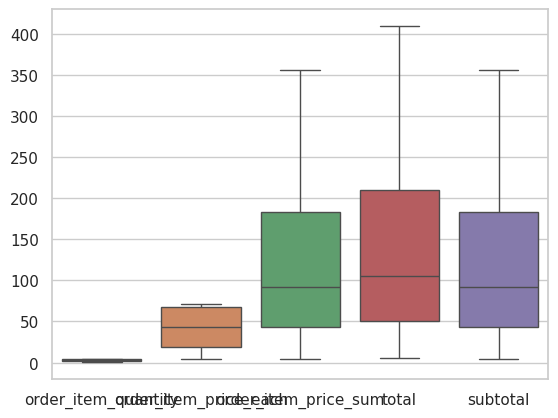

In [ ]:
# Identify outliers using visualizations (use boxplots).
sns.boxplot(data=df.select_dtypes(include=np.number))
plt.show()

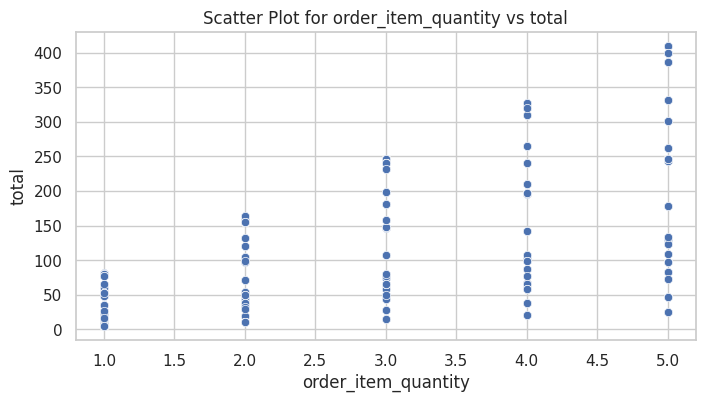

In [ ]:
# Example: Scatter plot for two numerical columns
x_col = 'order_item_quantity'  # Replace with your column name
y_col = 'total'  # Replace with your column name

plt.figure(figsize=(8, 4))
sns.scatterplot(x=df[x_col], y=df[y_col])
plt.title(f'Scatter Plot for {x_col} vs {y_col}')
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.show()

In [ ]:
# Validate relationships between numeric fields (for example, check if order_item_price_sum equals order_item_quantity * order_item_price_each)
# Validate that order_item_price_sum approximates order_item_quantity * order_item_price_each
df['calculated_price_sum'] = df['order_item_quantity'] * df['order_item_price_each']
difference = (df['order_item_price_sum'] - df['calculated_price_sum']).abs()
print("Summary of pricing differences:")
print(difference.describe())

Summary of pricing differences:
count    236570.0
mean          0.0
std           0.0
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           0.0
dtype: Float64


3. categorical

In [ ]:
# Standardize restaurant names by trimming and converting to title case
df['restaurant_name'] = df['restaurant_name'].str.strip().str.title()

# Check duplicate unique identifiers
duplicate_ids = df['unique_id'].duplicated().sum()
print(f"Duplicate unique_id count: {duplicate_ids}")

# Review the distribution of scenario
print(df['scenario'].value_counts())

Duplicate unique_id count: 0
scenario
DELIVERED       230936
OUT_OF_STOCK      5634
Name: count, dtype: int64


3. timestamp

In [ ]:
# Add time features from createdTime
df['year'] = df['createdTime'].dt.year
df['month'] = df['createdTime'].dt.month
df['day'] = df['createdTime'].dt.day  # Day of month
df['weekday'] = df['createdTime'].dt.weekday  # Monday=0, Sunday=6

# Create an AM/PM feature by extracting the hour
df['hour'] = df['createdTime'].dt.hour
df['am_pm'] = df['hour'].apply(lambda x: 'AM' if x < 12 else 'PM')

# Create a feature to indicate if the day is a weekday or weekend
# Here, Saturday (5) and Sunday (6) are considered weekend
df['weekday_or_weekend'] = df['weekday'].apply(lambda x: 'Weekend' if x >= 5 else 'Weekday')

# Optionally, if you no longer need the auxiliary 'hour' column, you can drop it
# df = df.drop(columns=['hour'])

# Display a few rows to verify the new features
df.head()

,unique_id,order_item_id,createdTime,adjustmentId,restaurant_name,order_item_quantity,order_number,restaurant_id,order_item_name,order_item_price_each,orderId,order_item_price_sum,total,subtotal,scenario,calculated_price_sum,year,month,day,weekday,hour,am_pm,weekday_or_weekend
115235,a2556aa8-d4dc-4f...,6a5d7b6d98cc9a0c...,2025-01-01 07:01:...,7f1b47a01422475d...,M&M Food M...,4,e94b6267ee2449c1...,11f1f94555e155ad...,Lays Class######...,12.67,7632ebc729d44c13...,50.68,58.28,50.68,DELIVERED,50.68,2025,1,1,2,7,AM,Weekday
233576,4c61329b-3fd8-4a...,6df4699463399216...,2025-01-01 07:04:...,2908e39afa344d80...,Lcbo (Danf...),3,e756513f1c994d56...,2792271a088e7881...,Maker's Ma######...,69.56,1afda0b7579941f3...,208.68,239.98,208.68,DELIVERED,208.68,2025,1,1,2,7,AM,Weekday
15983,d943c0ce-2be3-43...,b95ce666368b54f7...,2025-01-01 07:08:...,0e0d730adc8745bd...,Rexall (U...),5,283a01f73f2842b7...,007c0cb81363275a...,Deep Dish ######...,45.70,ca47fa6b523748d9...,228.50,262.77,228.50,DELIVERED,228.5,2025,1,1,2,7,AM,Weekday
91887,3e72cde7-bafb-43...,bf382318dcbb848b...,2025-01-01 07:15:...,a42d5033b94a465f...,Lcbo (Midl...),5,58dc657831884a77...,0fdea8d9e04c6247...,Lowenbrau ######...,4.40,e18a3b650c644af5...,22.00,25.30,22.00,DELIVERED,22.0,2025,1,1,2,7,AM,Weekday
127169,31ba0aa0-bf21-49...,29082b7a722290b2...,2025-01-01 07:16:...,dc32930522864055...,M&M Food M...,4,6c2bbddf502a486a...,11f1f94555e155ad...,Bacon Wrap######...,57.53,7f769ed162474536...,230.12,264.64,230.12,DELIVERED,230.12,2025,1,1,2,7,AM,Weekday


4. Consistency Checks and Derived Variables

In [ ]:
# Calculate order frequency by restaurant
restaurant_order_counts = df.groupby('restaurant_id')['order_number'].nunique()
print(restaurant_order_counts.describe())

# Create a feature for average item price (e.g., price per order_item_quantity)
df['avg_price_per_item'] = df['order_item_price_sum'] / df['order_item_quantity']

count       11.000000
mean     21506.363636
std        246.951523
min      21092.000000
25%      21318.500000
50%      21529.000000
75%      21622.000000
max      21970.000000
Name: order_number, dtype: float64


Samples per Restaurant (Alias based on frequency: largest gets 'Restaurant 1'):
restaurant_alias
Restaurant 1     21970
Restaurant 2     21749
Restaurant 3     21626
Restaurant 4     21618
Restaurant 5     21586
Restaurant 6     21529
Restaurant 7     21501
Restaurant 8     21332
Restaurant 9     21305
Restaurant 10    21262
Restaurant 11    21092


<ipython-input-13-4f70a9b1fc7d>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='restaurant_alias', data=df, order=order_counts, palette="Blues_d")


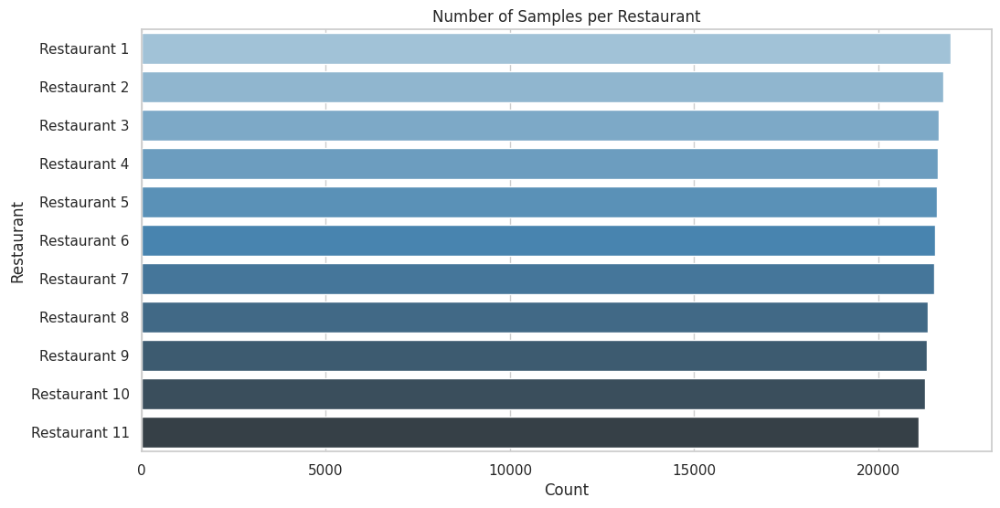

In [ ]:
# Samples per Restaurant with Aliases Based on Frequency

# Create an alias mapping using the order from the largest count (largest first)
sorted_restaurants = df['restaurant_id'].value_counts().index
alias_dict = {rid: f"Restaurant {i+1}" for i, rid in enumerate(sorted_restaurants)}

# Map the restaurant_id column to create a new alias column based on sorted order
df['restaurant_alias'] = df['restaurant_id'].map(alias_dict)

# Textual summary: Count the number of samples per restaurant using alias.
print("Samples per Restaurant (Alias based on frequency: largest gets 'Restaurant 1'):")
restaurant_summary = df['restaurant_alias'].value_counts()
print(restaurant_summary.to_string())  # Convert to string for complete text output

# Plot: Using alias names for better visualization.
plt.figure(figsize=(12, 6))
# Order by frequency (should be already in correct order due to alias_dict ordering)
order_counts = df['restaurant_alias'].value_counts().index
sns.countplot(y='restaurant_alias', data=df, order=order_counts, palette="Blues_d")
plt.title('Number of Samples per Restaurant')
plt.xlabel('Count')
plt.ylabel('Restaurant')
plt.show()


Samples per Item (using item_alias):
item_alias
Extra Larg…    32247
Deep Dish…     31932
Maker's Ma…    21732
Lowenbrau…     21612
St Remy VS…    21549
Lays Class…     7274
Boneless B…     7236
Mushroom M…     7225
Haagen Daz…     7206
Black Pepp…     7201
Spanakopit…     7191
Bacon Wrap…     7175
Walnut Rai…     7152
Gourmet Me…     7151
Beef Strog…     7138
Crinkle Cu…     7126
Hershey Ki…     7117
Kellogg's…      7114
Jumbo Coco…     7100
Mini Choco…     7092


<ipython-input-14-65c3d3cdf227>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='item_alias', data=df, order=item_counts, palette="viridis")


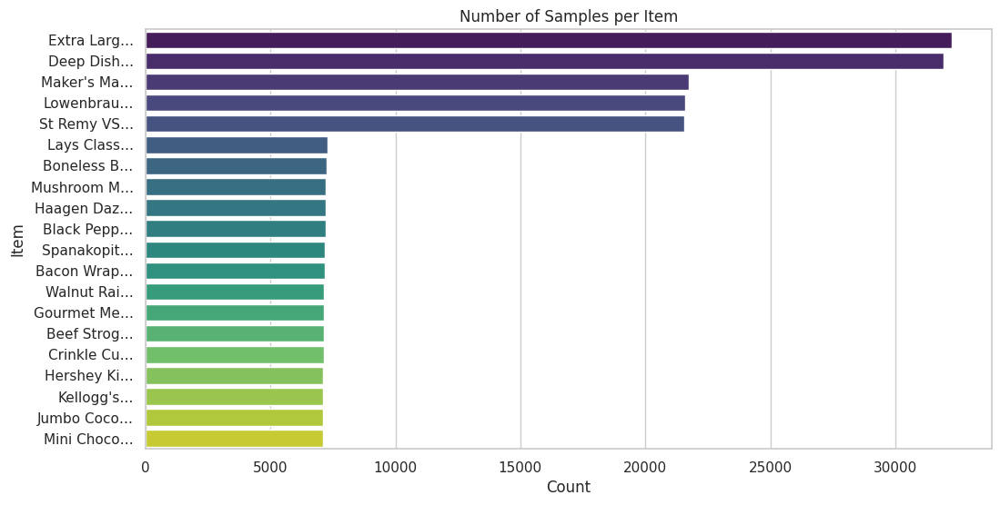

In [ ]:
# Create a new column 'item_alias' by removing everything after the first '#' occurrence
# and appending an ellipsis ("…") if any '#' were found
df['item_alias'] = df['order_item_name'].apply(
    lambda x: x.split('#')[0].strip() + ("…" if '#' in x else "")
)

# Samples per item using the new alias
print("\nSamples per Item (using item_alias):")
item_summary = df['item_alias'].value_counts()
print(item_summary.to_string())

plt.figure(figsize=(12, 6))
item_counts = df['item_alias'].value_counts().index
sns.countplot(y='item_alias', data=df, order=item_counts, palette="viridis")
plt.title('Number of Samples per Item')
plt.xlabel('Count')
plt.ylabel('Item')
plt.show()


Frequency of OOS Situation:
scenario
DELIVERED       230936
OUT_OF_STOCK      5634


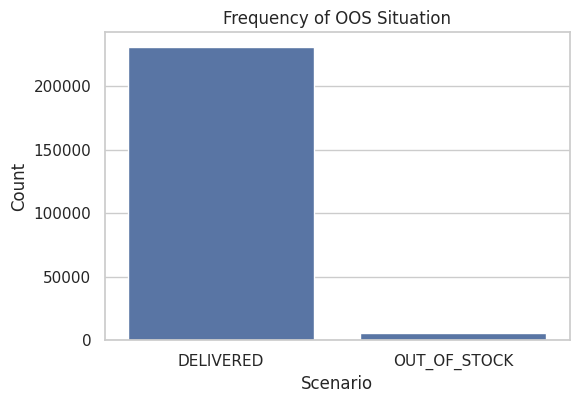

In [ ]:
# Frequency of the OOS situation
# Count how often each scenario occurs.
print("\nFrequency of OOS Situation:")
scenario_summary = df['scenario'].value_counts()
print(scenario_summary.to_string())

plt.figure(figsize=(6, 4))
sns.countplot(x='scenario', data=df, order=df['scenario'].value_counts().index)
plt.title('Frequency of OOS Situation')
plt.xlabel('Scenario')
plt.ylabel('Count')
plt.show()

Frequency of OOS Situation per Restaurant (Alias Only):
Restaurant 2: 667
Restaurant 1: 622
Restaurant 4: 621
Restaurant 6: 592
Restaurant 8: 533
Restaurant 9: 518
Restaurant 10: 511
Restaurant 3: 506
Restaurant 7: 453
Restaurant 11: 343
Restaurant 5: 268


<ipython-input-16-fd50d84945ce>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


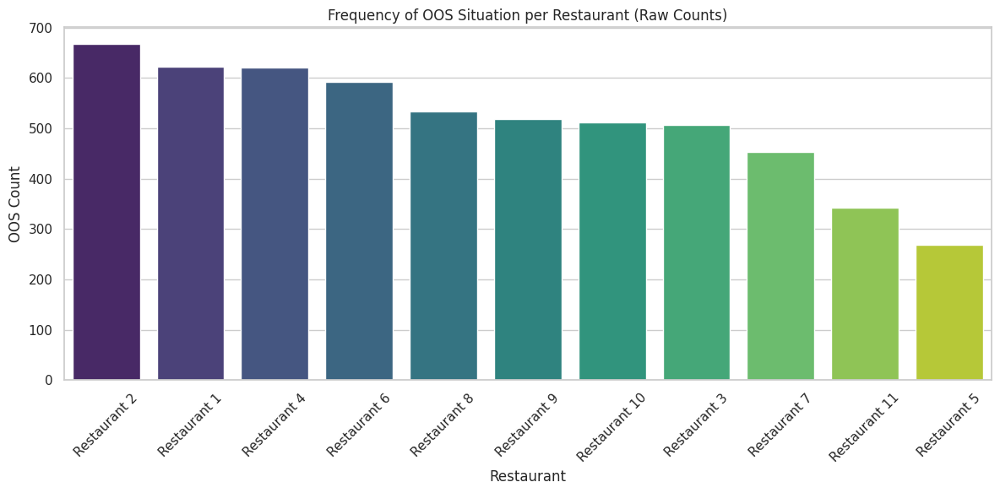

In [ ]:
# Filter the DataFrame to only include rows where the scenario is OOS
# (Assuming the column 'scenario' contains the status and 'OUT_OF_STOCK' is the status value)
oos_df = df[df['scenario'] == 'OUT_OF_STOCK']

# Group by restaurant_alias and count the number of OOS events per restaurant
oos_counts = oos_df.groupby('restaurant_alias').size().reset_index(name='OOS_Count')

# Sort oos_counts from largest to smallest by OOS_Count
oos_counts = oos_counts.sort_values(by='OOS_Count', ascending=False)

# Textual summary: Print each restaurant alias and its count of OOS events
print("Frequency of OOS Situation per Restaurant (Alias Only):")
for _, row in oos_counts.iterrows():
    print(f"{row['restaurant_alias']}: {row['OOS_Count']}")

# --- Plotting OOS Frequency per Restaurant (Raw Counts) using aliases only ---
plt.figure(figsize=(12, 6))
sns.barplot(
    x='restaurant_alias',
    y='OOS_Count',
    data=oos_counts,
    palette="viridis"
)
plt.xticks(rotation=45)
plt.title("Frequency of OOS Situation per Restaurant (Raw Counts)")
plt.xlabel("Restaurant")
plt.ylabel("OOS Count")
plt.tight_layout()
plt.show()


Frequency of OOS Situation per Restaurant (Percentage) using Aliases:
Restaurant 2: 3.07%
Restaurant 4: 2.87%
Restaurant 1: 2.83%
Restaurant 6: 2.75%
Restaurant 8: 2.50%
Restaurant 9: 2.43%
Restaurant 10: 2.40%
Restaurant 3: 2.34%
Restaurant 7: 2.11%
Restaurant 11: 1.63%
Restaurant 5: 1.24%


<ipython-input-17-bffe818435b2>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


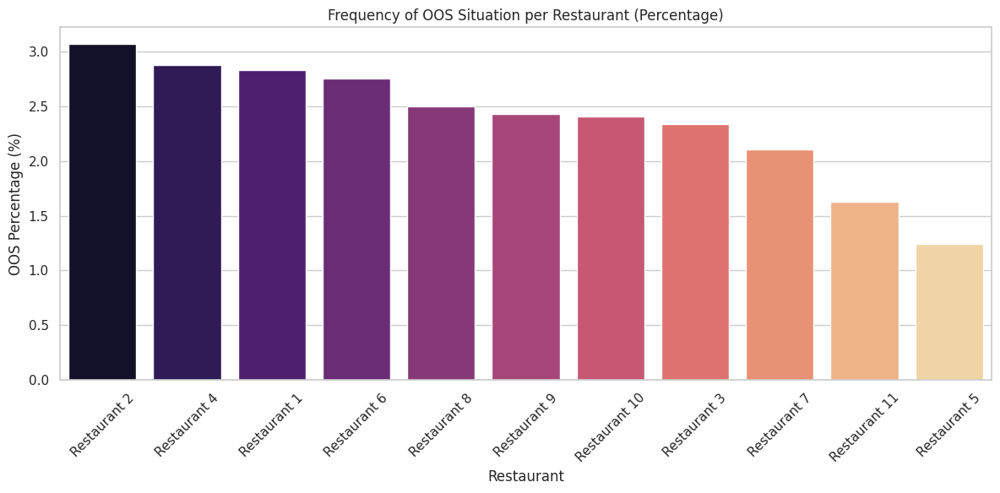

In [ ]:
print("\nFrequency of OOS Situation per Restaurant (Percentage) using Aliases:")

# Calculate total counts per restaurant_alias
total_restaurant_counts_alias = df['restaurant_alias'].value_counts()

# Calculate OOS counts per restaurant_alias for the rows where scenario == 'OUT_OF_STOCK'
oos_restaurant_counts_alias = df[df['scenario'] == 'OUT_OF_STOCK']['restaurant_alias'].value_counts()

# Compute the percentage and reset the index for plotting
restaurant_percentages = (oos_restaurant_counts_alias / total_restaurant_counts_alias * 100).reset_index()
restaurant_percentages.columns = ['restaurant_alias', 'percentage']

# Sort the DataFrame from largest to smallest percentage
restaurant_percentages = restaurant_percentages.sort_values(by='percentage', ascending=False)

# Textual summary: print sorted percentages per restaurant (using alias only)
for _, row in restaurant_percentages.iterrows():
    print(f"{row['restaurant_alias']}: {row['percentage']:.2f}%")

# --- Plotting OOS Frequency per Restaurant (Percentage) using Aliases ---
plt.figure(figsize=(12, 6))
sns.barplot(
    data=restaurant_percentages,
    x='restaurant_alias',
    y='percentage',
    palette="magma"
)
plt.xticks(rotation=45)
plt.title("Frequency of OOS Situation per Restaurant (Percentage)")
plt.xlabel("Restaurant")
plt.ylabel("OOS Percentage (%)")
plt.tight_layout()
plt.show()


Frequency of OOS Situation per Item (Raw Counts):
Lowenbrau…: 785
Deep Dish…: 630
Maker's Ma…: 536
St Remy VS…: 440
Extra Larg…: 434
Boneless B…: 244
Haagen Daz…: 231
Hershey Ki…: 229
Lays Class…: 221
Black Pepp…: 221
Bacon Wrap…: 214
Kellogg's…: 191
Jumbo Coco…: 186
Mini Choco…: 177
Beef Strog…: 167
Spanakopit…: 160
Mushroom M…: 158
Walnut Rai…: 145
Gourmet Me…: 135
Crinkle Cu…: 130


<ipython-input-18-034244fd8a56>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


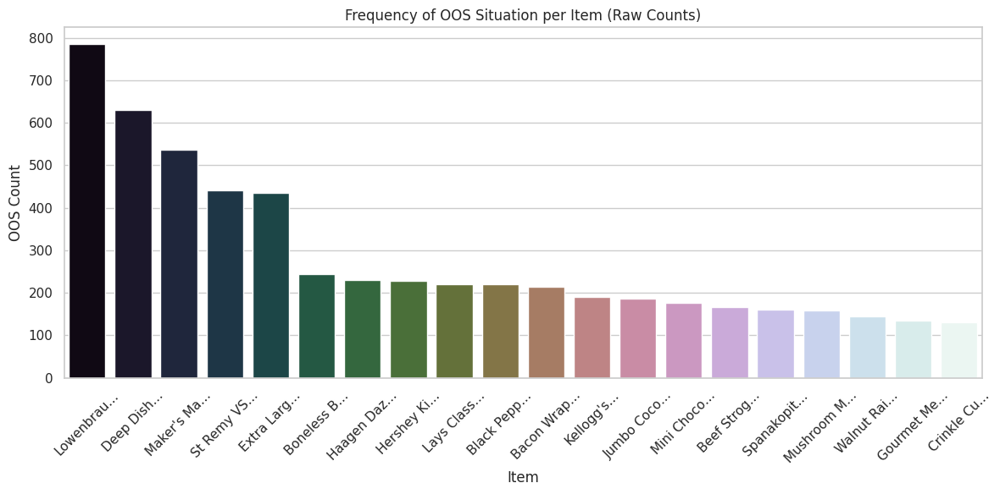


Frequency of OOS Situation per Item (Percentage) Sorted (Largest to Smallest):
Lowenbrau…: 3.63%
Boneless B…: 3.37%
Hershey Ki…: 3.22%
Haagen Daz…: 3.21%
Black Pepp…: 3.07%
Lays Class…: 3.04%
Bacon Wrap…: 2.98%
Kellogg's…: 2.68%
Jumbo Coco…: 2.62%
Mini Choco…: 2.50%
Maker's Ma…: 2.47%
Beef Strog…: 2.34%
Spanakopit…: 2.23%
Mushroom M…: 2.19%
St Remy VS…: 2.04%
Walnut Rai…: 2.03%
Deep Dish…: 1.97%
Gourmet Me…: 1.89%
Crinkle Cu…: 1.82%
Extra Larg…: 1.35%


<ipython-input-18-034244fd8a56>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


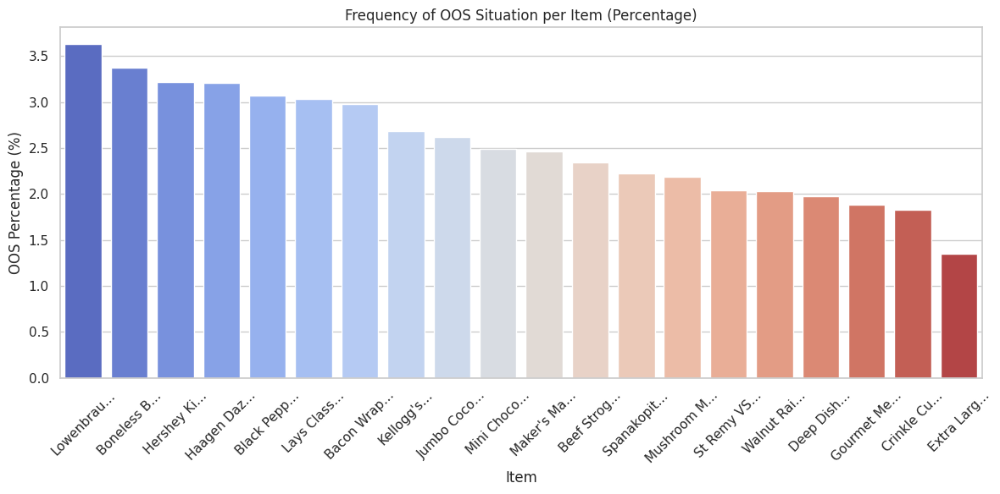

In [ ]:
# --------------------------------------------
# Textual Summary and Plot: Frequency per Item using item_alias
# --------------------------------------------

# Total count of samples per order item (using item_alias)
total_item_counts = df['item_alias'].value_counts()

# OOS event count per order item (using item_alias)
oos_item_counts = oos_df['item_alias'].value_counts()

print("\nFrequency of OOS Situation per Item (Raw Counts):")
for item, count in oos_item_counts.items():
    print(f"{item}: {count}")

# --- Plotting OOS Frequency per Item (Raw Counts) using item_alias ---
plt.figure(figsize=(12, 6))
sns.barplot(
    x=oos_item_counts.index,
    y=oos_item_counts.values,
    palette="cubehelix"
)
plt.xticks(rotation=45)
plt.title("Frequency of OOS Situation per Item (Raw Counts)")
plt.xlabel("Item")
plt.ylabel("OOS Count")
plt.tight_layout()
plt.show()

# --- Plotting OOS Frequency per Item (Percentage) using item_alias ---
# Calculate percentage values and reset index for plotting
item_percentages = (oos_item_counts / total_item_counts * 100).reset_index()
item_percentages.columns = ['item_alias', 'percentage']

# Sort the DataFrame from largest to smallest percentage
item_percentages = item_percentages.sort_values(by='percentage', ascending=False)

# Textual summary: print sorted percentages per item
print("\nFrequency of OOS Situation per Item (Percentage) Sorted (Largest to Smallest):")
for _, row in item_percentages.iterrows():
    print(f"{row['item_alias']}: {row['percentage']:.2f}%")

plt.figure(figsize=(12, 6))
sns.barplot(
    data=item_percentages,
    x='item_alias',
    y='percentage',
    palette="coolwarm"
)
plt.xticks(rotation=45)
plt.title("Frequency of OOS Situation per Item (Percentage)")
plt.xlabel("Item")
plt.ylabel("OOS Percentage (%)")
plt.tight_layout()
plt.show()

Frequency of OOS Situation per Item per Restaurant (Raw Counts & Percentage):

Restaurant: Restaurant 1
  Lowenbrau…: Raw Count = 256, Percentage = 3.47%
  St Remy VS…: Raw Count = 200, Percentage = 2.76%
  Maker's Ma…: Raw Count = 166, Percentage = 2.26%

Restaurant: Restaurant 10
  Kellogg's…: Raw Count = 57, Percentage = 3.89%
  Jumbo Coco…: Raw Count = 44, Percentage = 3.06%
  Beef Strog…: Raw Count = 40, Percentage = 2.91%
  Haagen Daz…: Raw Count = 42, Percentage = 2.87%
  Boneless B…: Raw Count = 40, Percentage = 2.75%
  Lays Class…: Raw Count = 39, Percentage = 2.74%
  Spanakopit…: Raw Count = 39, Percentage = 2.71%
  Bacon Wrap…: Raw Count = 38, Percentage = 2.66%
  Walnut Rai…: Raw Count = 34, Percentage = 2.45%
  Black Pepp…: Raw Count = 30, Percentage = 2.20%
  Mushroom M…: Raw Count = 30, Percentage = 2.20%
  Mini Choco…: Raw Count = 28, Percentage = 2.02%
  Gourmet Me…: Raw Count = 27, Percentage = 1.87%
  Hershey Ki…: Raw Count = 19, Percentage = 1.35%
  Crinkle Cu…: Raw

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

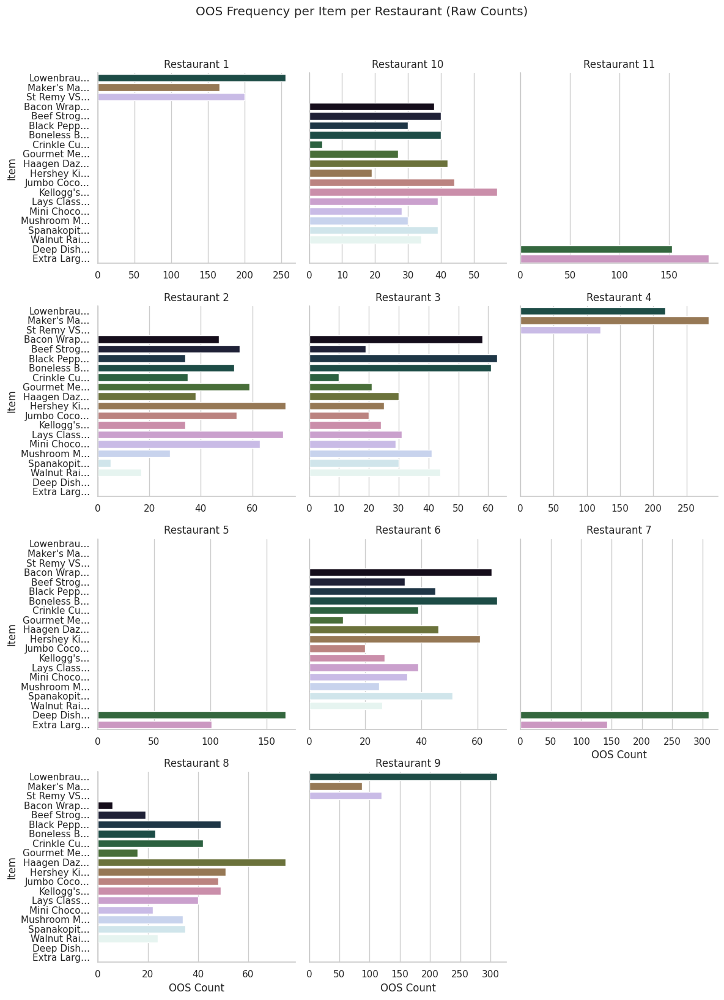

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

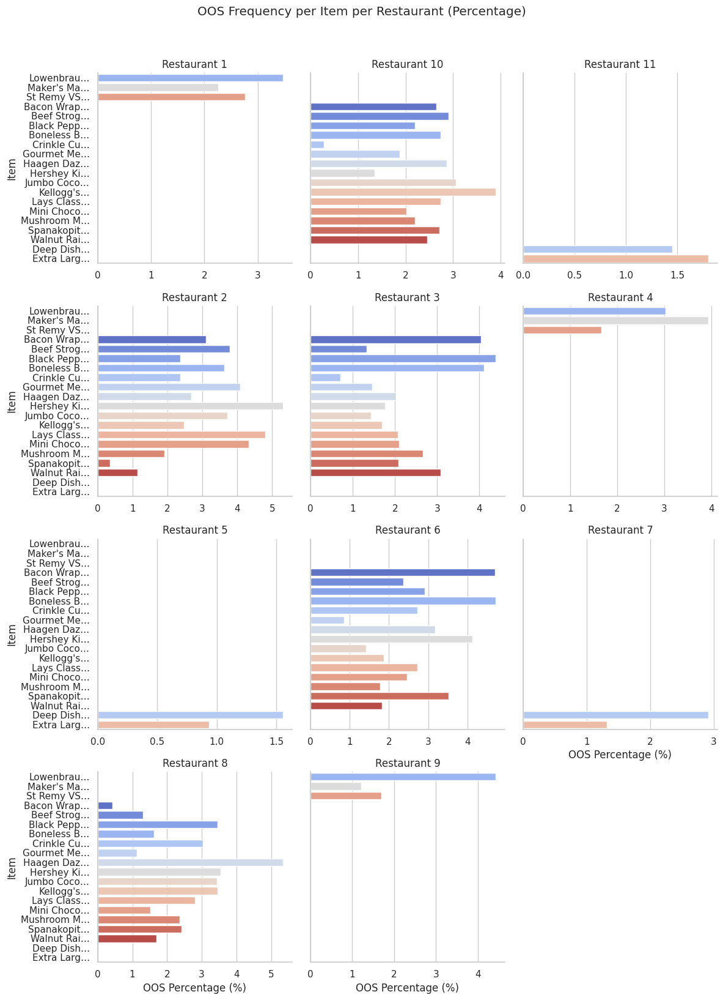

In [ ]:
# --------------------------------------------
# Frequency of OOS Situation per Item per Restaurant
# --------------------------------------------

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Group by restaurant_alias and item_alias for total order counts
total_counts_rest_item = df.groupby(['restaurant_alias', 'item_alias']).size().reset_index(name='total_count')

# Group by restaurant_alias and item_alias for OOS counts
oos_counts_rest_item = oos_df.groupby(['restaurant_alias', 'item_alias']).size().reset_index(name='oos_count')

# Merge the two DataFrames on restaurant_alias and item_alias
freq_rest_item = pd.merge(total_counts_rest_item, oos_counts_rest_item,
                          on=['restaurant_alias', 'item_alias'], how='left')

# Replace missing OOS counts with 0 (if an item in a restaurant never went OOS)
freq_rest_item['oos_count'] = freq_rest_item['oos_count'].fillna(0)

# Calculate percentage
freq_rest_item['percentage'] = freq_rest_item['oos_count'] / freq_rest_item['total_count'] * 100

# -----------------
# Textual Summary
# -----------------
print("Frequency of OOS Situation per Item per Restaurant (Raw Counts & Percentage):")
# For each restaurant, sort items by descending OOS percentage and print summary.
for restaurant in sorted(freq_rest_item['restaurant_alias'].unique()):
    print(f"\nRestaurant: {restaurant}")
    sub_df = freq_rest_item[freq_rest_item['restaurant_alias'] == restaurant].sort_values(by='percentage', ascending=False)
    for _, row in sub_df.iterrows():
        print(f"  {row['item_alias']}: Raw Count = {int(row['oos_count'])}, Percentage = {row['percentage']:.2f}%")

# -----------------
# Plotting using Facet Grids for visualizing per Restaurant
# -----------------

# Raw count plot: one barplot per restaurant.
g_raw = sns.FacetGrid(freq_rest_item, col="restaurant_alias", col_wrap=3, height=4, sharex=False)
g_raw.map_dataframe(sns.barplot, y="item_alias", x="oos_count", palette="cubehelix", orient="h")
g_raw.set_titles("{col_name}")
g_raw.set_axis_labels("OOS Count", "Item")
g_raw.fig.suptitle("OOS Frequency per Item per Restaurant (Raw Counts)", y=1.02)
plt.tight_layout()
plt.show()

# Percentage plot: one barplot per restaurant.
# Sort items within each restaurant by percentage.
g_percent = sns.FacetGrid(freq_rest_item, col="restaurant_alias", col_wrap=3, height=4, sharex=False)
g_percent.map_dataframe(sns.barplot, y="item_alias", x="percentage", palette="coolwarm", orient="h")
g_percent.set_titles("{col_name}")
g_percent.set_axis_labels("OOS Percentage (%)", "Item")
g_percent.fig.suptitle("OOS Frequency per Item per Restaurant (Percentage)", y=1.02)
plt.tight_layout()
plt.show()

Frequency of OOS Situation per Item per Restaurant (Raw Counts & Percentage):

Restaurant 1:
  Lowenbrau…: Raw Count = 256, Percentage = 3.47%
  St Remy VS…: Raw Count = 200, Percentage = 2.76%
  Maker's Ma…: Raw Count = 166, Percentage = 2.26%

Restaurant 2:
  Hershey Ki…: Raw Count = 73, Percentage = 5.31%
  Lays Class…: Raw Count = 72, Percentage = 4.81%
  Mini Choco…: Raw Count = 63, Percentage = 4.33%
  Gourmet Me…: Raw Count = 59, Percentage = 4.08%
  Beef Strog…: Raw Count = 55, Percentage = 3.79%
  Jumbo Coco…: Raw Count = 54, Percentage = 3.72%
  Boneless B…: Raw Count = 53, Percentage = 3.62%
  Bacon Wrap…: Raw Count = 47, Percentage = 3.10%
  Haagen Daz…: Raw Count = 38, Percentage = 2.68%
  Kellogg's…: Raw Count = 34, Percentage = 2.47%
  Black Pepp…: Raw Count = 34, Percentage = 2.36%
  Crinkle Cu…: Raw Count = 35, Percentage = 2.36%
  Mushroom M…: Raw Count = 28, Percentage = 1.91%
  Walnut Rai…: Raw Count = 17, Percentage = 1.13%
  Spanakopit…: Raw Count = 5, Percentage 

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

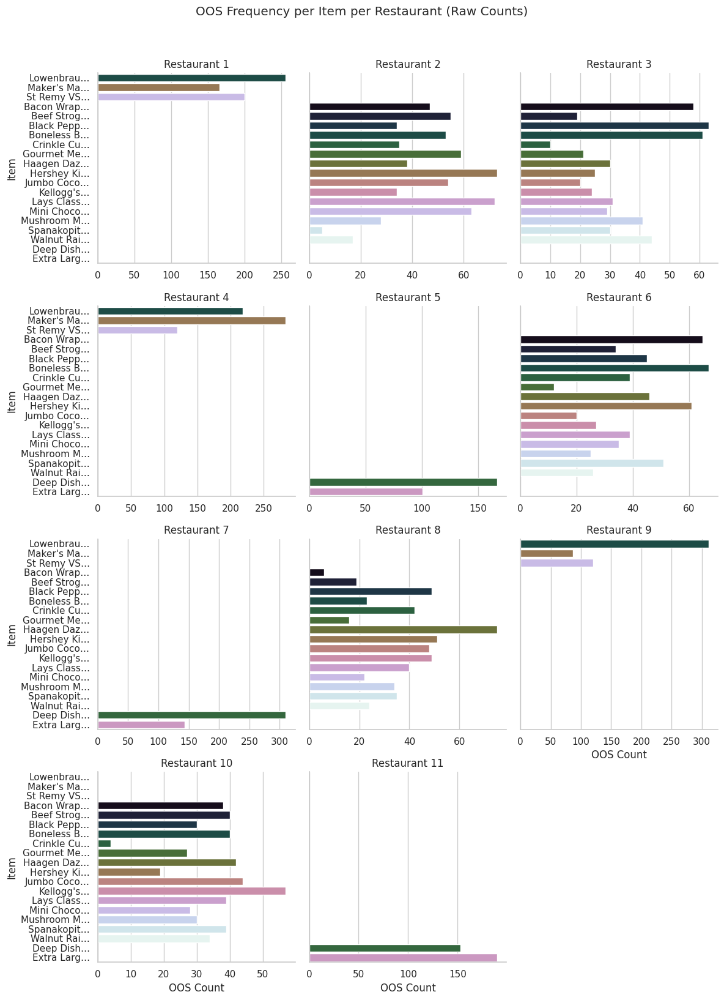

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

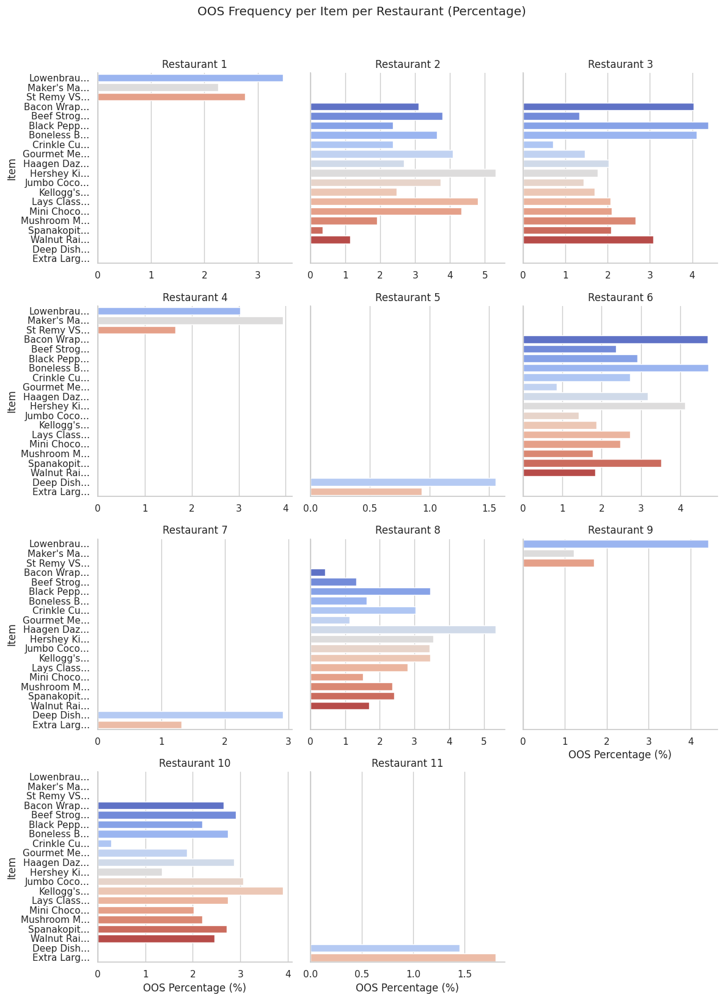

In [ ]:
# --------------------------------------------
# Frequency of OOS Situation per Item per Restaurant
# --------------------------------------------

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Group by restaurant_alias and item_alias for total order counts
total_counts_rest_item = df.groupby(['restaurant_alias', 'item_alias']).size().reset_index(name='total_count')

# Group by restaurant_alias and item_alias for OOS counts
oos_counts_rest_item = oos_df.groupby(['restaurant_alias', 'item_alias']).size().reset_index(name='oos_count')

# Merge the two DataFrames on restaurant_alias and item_alias
freq_rest_item = pd.merge(total_counts_rest_item, oos_counts_rest_item,
                          on=['restaurant_alias', 'item_alias'], how='left')

# Replace missing OOS counts with 0 (if an item in a restaurant never went OOS)
freq_rest_item['oos_count'] = freq_rest_item['oos_count'].fillna(0)

# Calculate percentage (convert to percentage)
freq_rest_item['percentage'] = freq_rest_item['oos_count'] / freq_rest_item['total_count'] * 100

# Define the desired restaurant order (assuming restaurants 1 to 11 exist)
restaurant_order = [f"Restaurant {i}" for i in range(1, 12)]

# -----------------
# Textual Summary (ordered by our restaurant_order)
# -----------------
print("Frequency of OOS Situation per Item per Restaurant (Raw Counts & Percentage):")
for restaurant in restaurant_order:
    # Filter and sort items by descending percentage within the current restaurant
    sub_df = freq_rest_item[freq_rest_item['restaurant_alias'] == restaurant].sort_values(by='percentage', ascending=False)
    if sub_df.empty:
        continue
    print(f"\n{restaurant}:")
    for _, row in sub_df.iterrows():
        print(f"  {row['item_alias']}: Raw Count = {int(row['oos_count'])}, Percentage = {row['percentage']:.2f}%")

# -----------------
# Plotting using Facet Grids for visualizing per Restaurant
# -----------------

# For the raw count plot, we use FacetGrid with specified restaurant order.
g_raw = sns.FacetGrid(freq_rest_item, col="restaurant_alias", col_order=restaurant_order, col_wrap=3, height=4, sharex=False)
g_raw.map_dataframe(sns.barplot, y="item_alias", x="oos_count", palette="cubehelix", orient="h")
g_raw.set_titles("{col_name}")
g_raw.set_axis_labels("OOS Count", "Item")
g_raw.fig.suptitle("OOS Frequency per Item per Restaurant (Raw Counts)", y=1.02)
plt.tight_layout()
plt.show()

# For the percentage plot, we also set the same specified order.
g_percent = sns.FacetGrid(freq_rest_item, col="restaurant_alias", col_order=restaurant_order, col_wrap=3, height=4, sharex=False)
g_percent.map_dataframe(sns.barplot, y="item_alias", x="percentage", palette="coolwarm", orient="h")
g_percent.set_titles("{col_name}")
g_percent.set_axis_labels("OOS Percentage (%)", "Item")
g_percent.fig.suptitle("OOS Frequency per Item per Restaurant (Percentage)", y=1.02)
plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

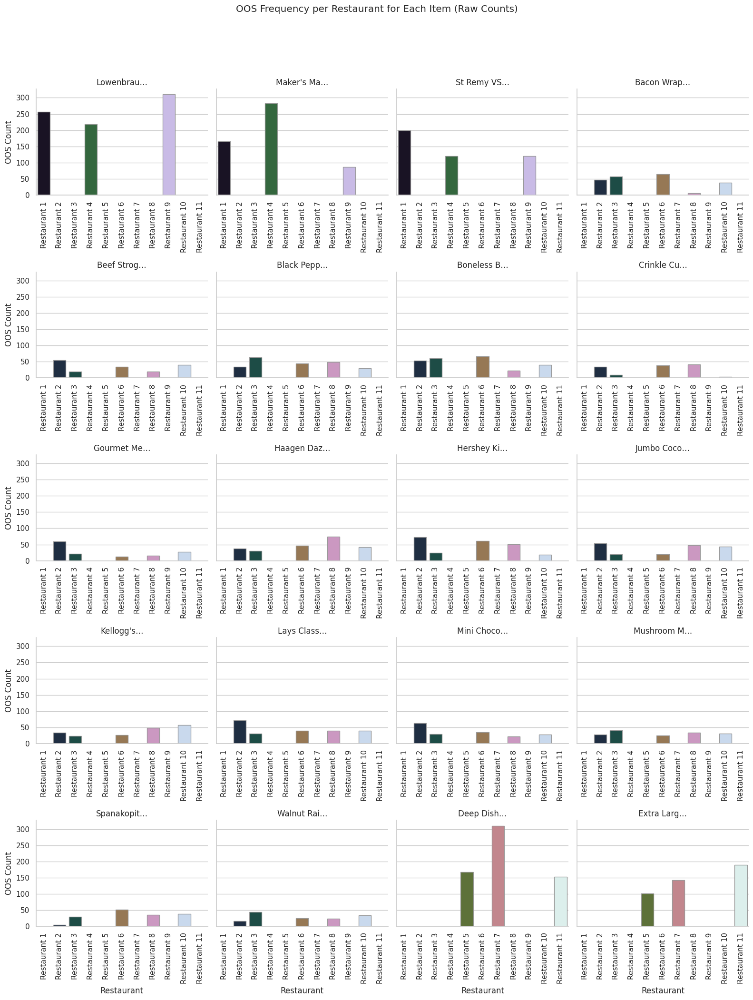

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

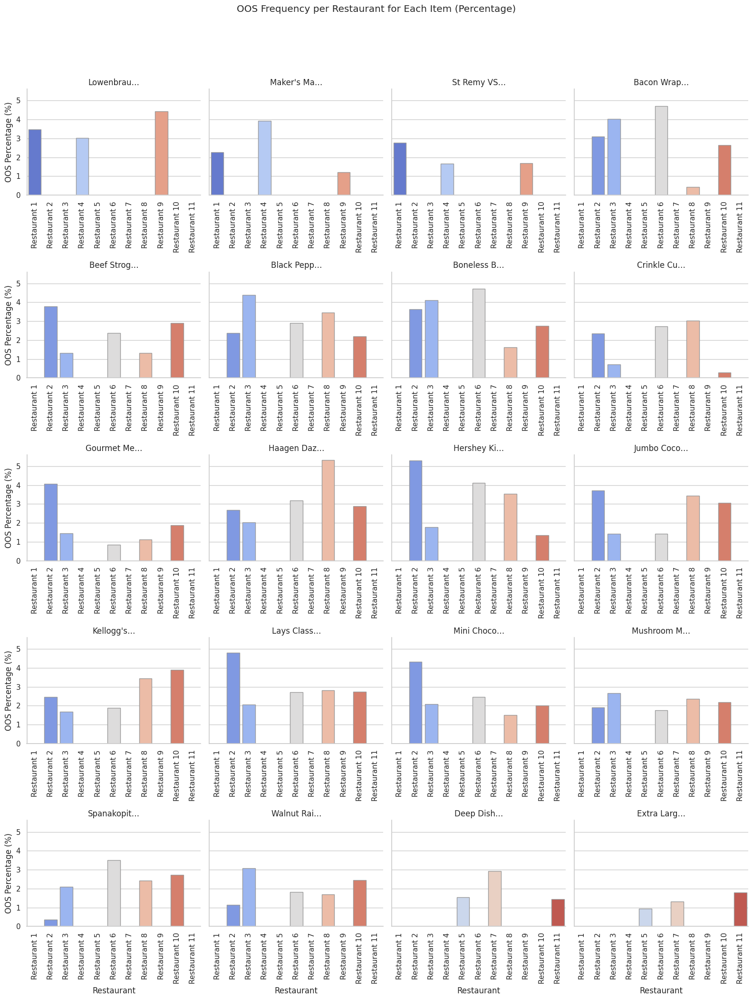

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# (Assuming freq_rest_item has been computed as previously)
# For reference, here's how freq_rest_item is built:
# --------------------------------------------------
# total_counts_rest_item = df.groupby(['restaurant_alias', 'item_alias']).size().reset_index(name='total_count')
# oos_counts_rest_item = oos_df.groupby(['restaurant_alias', 'item_alias']).size().reset_index(name='oos_count')
# freq_rest_item = pd.merge(total_counts_rest_item, oos_counts_rest_item, on=['restaurant_alias', 'item_alias'], how='left')
# freq_rest_item['oos_count'] = freq_rest_item['oos_count'].fillna(0)
# freq_rest_item['percentage'] = freq_rest_item['oos_count'] / freq_rest_item['total_count'] * 100
# --------------------------------------------------

# Optional: Define a fixed order for restaurants if desired.
restaurant_order = [f"Restaurant {i}" for i in range(1, 12)]

# -------------------------------
# Plotting using Facet Grids per Item (Raw Counts)
# -------------------------------
# Each facet panel represents an item (item_alias). Bars within show OOS counts grouped by restaurant_alias.
g_item_raw = sns.FacetGrid(freq_rest_item, col="item_alias", col_wrap=4, height=4, sharex=False)
g_item_raw.map_dataframe(sns.barplot, x="restaurant_alias", y="oos_count",
                         order=restaurant_order, palette="cubehelix", edgecolor=".6")
g_item_raw.set_titles("{col_name}")
g_item_raw.set_axis_labels("Restaurant", "OOS Count")
g_item_raw.fig.suptitle("OOS Frequency per Restaurant for Each Item (Raw Counts)", y=1.05)
for ax in g_item_raw.axes.flatten():
    for label in ax.get_xticklabels():
        label.set_rotation(90)
plt.tight_layout()

# Save the plot as a PNG image
plt.savefig("oos_frequency_per_restaurant_per_item_raw_counts.png", dpi=300, bbox_inches='tight')

plt.show()

# -------------------------------
# Plotting using Facet Grids per Item (Percentage)
# -------------------------------
# Again, each facet panel represents an item (item_alias) and bars show the OOS percentage across restaurants.
g_item_percent = sns.FacetGrid(freq_rest_item, col="item_alias", col_wrap=4, height=4, sharex=False)
g_item_percent.map_dataframe(sns.barplot, x="restaurant_alias", y="percentage",
                             order=restaurant_order, palette="coolwarm", edgecolor=".6")
g_item_percent.set_titles("{col_name}")
g_item_percent.set_axis_labels("Restaurant", "OOS Percentage (%)")
g_item_percent.fig.suptitle("OOS Frequency per Restaurant for Each Item (Percentage)", y=1.05)
for ax in g_item_percent.axes.flatten():
    for label in ax.get_xticklabels():
        label.set_rotation(90)
plt.tight_layout()

# Save the plot as a PNG image
plt.savefig("oos_frequency_per_restaurant_per_item_percentage.png", dpi=300, bbox_inches='tight')
plt.show()

Frequency of OOS Situation per Item per Restaurant (Raw Counts & Percentage):

Item: Bacon Wrap…
   Restaurant 6: Raw Count = 65, Percentage = 4.70%
   Restaurant 3: Raw Count = 58, Percentage = 4.04%
   Restaurant 2: Raw Count = 47, Percentage = 3.10%
   Restaurant 10: Raw Count = 38, Percentage = 2.66%
   Restaurant 8: Raw Count = 6, Percentage = 0.42%


Item: Beef Strog…
   Restaurant 2: Raw Count = 55, Percentage = 3.79%
   Restaurant 10: Raw Count = 40, Percentage = 2.91%
   Restaurant 6: Raw Count = 34, Percentage = 2.37%
   Restaurant 3: Raw Count = 19, Percentage = 1.32%
   Restaurant 8: Raw Count = 19, Percentage = 1.31%


Item: Black Pepp…
   Restaurant 3: Raw Count = 63, Percentage = 4.38%
   Restaurant 8: Raw Count = 49, Percentage = 3.46%
   Restaurant 6: Raw Count = 45, Percentage = 2.91%
   Restaurant 2: Raw Count = 34, Percentage = 2.36%
   Restaurant 10: Raw Count = 30, Percentage = 2.20%


Item: Boneless B…
   Restaurant 6: Raw Count = 67, Percentage = 4.71%
   Restau

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

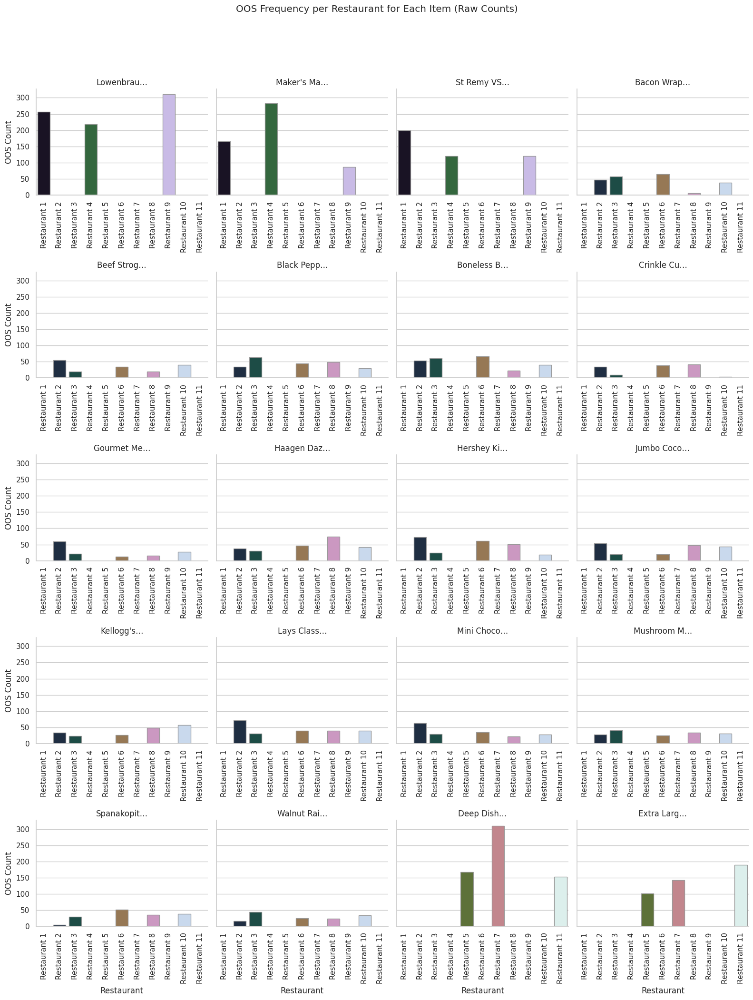

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

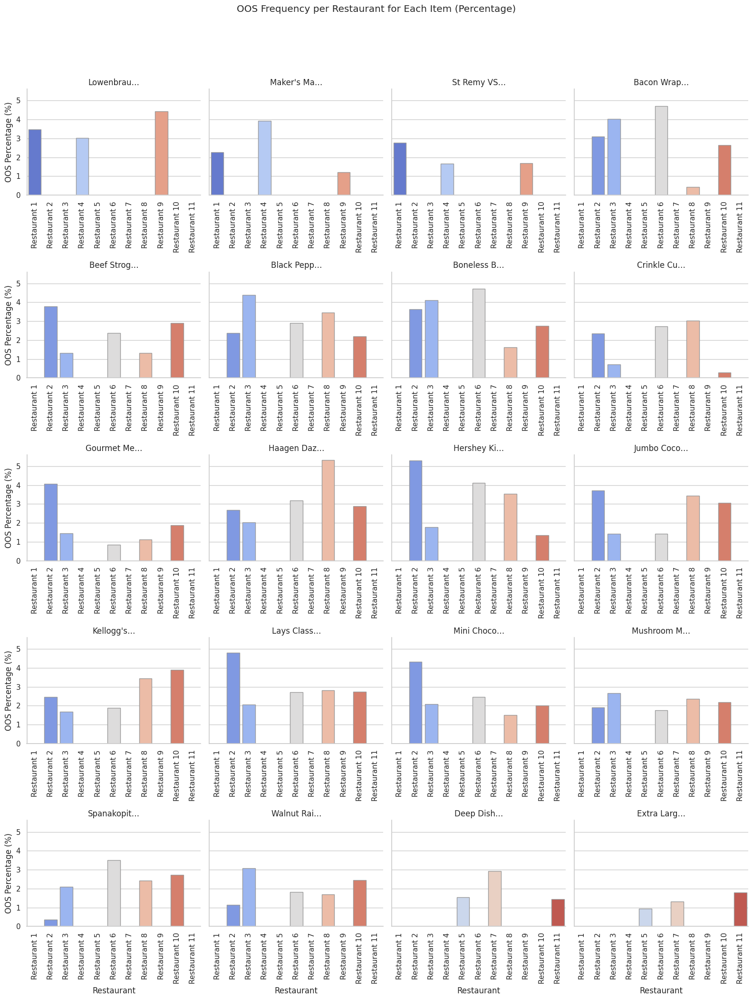

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# (Assuming freq_rest_item has been computed as previously)
# For reference, here's how freq_rest_item is built:
# --------------------------------------------------
# total_counts_rest_item = df.groupby(['restaurant_alias', 'item_alias']).size().reset_index(name='total_count')
# oos_counts_rest_item = oos_df.groupby(['restaurant_alias', 'item_alias']).size().reset_index(name='oos_count')
# freq_rest_item = pd.merge(total_counts_rest_item, oos_counts_rest_item, on=['restaurant_alias', 'item_alias'], how='left')
# freq_rest_item['oos_count'] = freq_rest_item['oos_count'].fillna(0)
# freq_rest_item['percentage'] = freq_rest_item['oos_count'] / freq_rest_item['total_count'] * 100
# --------------------------------------------------

# Optional: Define a fixed order for restaurants if desired.
restaurant_order = [f"Restaurant {i}" for i in range(1, 12)]

# -------------------------------
# Textual Summary: Frequency of OOS per Item per Restaurant
# -------------------------------
print("Frequency of OOS Situation per Item per Restaurant (Raw Counts & Percentage):\n")
# Group data by item_alias
for item, group in freq_rest_item.groupby('item_alias'):
    print(f"Item: {item}")
    # Sort within the item group by percentage in descending order
    group_sorted = group.sort_values(by='percentage', ascending=False)
    for _, row in group_sorted.iterrows():
        print(f"   {row['restaurant_alias']}: Raw Count = {int(row['oos_count'])}, Percentage = {row['percentage']:.2f}%")
    print("\n")

# -------------------------------
# Plotting using Facet Grids per Item (Raw Counts)
# -------------------------------
# Each facet panel represents an item (item_alias). Bars within show OOS counts grouped by restaurant_alias.
g_item_raw = sns.FacetGrid(freq_rest_item, col="item_alias", col_wrap=4, height=4, sharex=False)
g_item_raw.map_dataframe(sns.barplot, x="restaurant_alias", y="oos_count",
                         order=restaurant_order, palette="cubehelix", edgecolor=".6")
g_item_raw.set_titles("{col_name}")
g_item_raw.set_axis_labels("Restaurant", "OOS Count")
g_item_raw.fig.suptitle("OOS Frequency per Restaurant for Each Item (Raw Counts)", y=1.05)
for ax in g_item_raw.axes.flatten():
    for label in ax.get_xticklabels():
        label.set_rotation(90)
plt.tight_layout()
# Save the plot as a PNG image
g_item_raw.fig.savefig("oos_frequency_per_restaurant_per_item_raw_counts.png", dpi=300, bbox_inches='tight')
plt.show()

# -------------------------------
# Plotting using Facet Grids per Item (Percentage)
# -------------------------------
# Again, each facet panel represents an item (item_alias) and bars show the OOS percentage across restaurants.
g_item_percent = sns.FacetGrid(freq_rest_item, col="item_alias", col_wrap=4, height=4, sharex=False)
g_item_percent.map_dataframe(sns.barplot, x="restaurant_alias", y="percentage",
                             order=restaurant_order, palette="coolwarm", edgecolor=".6")
g_item_percent.set_titles("{col_name}")
g_item_percent.set_axis_labels("Restaurant", "OOS Percentage (%)")
g_item_percent.fig.suptitle("OOS Frequency per Restaurant for Each Item (Percentage)", y=1.05)
for ax in g_item_percent.axes.flatten():
    for label in ax.get_xticklabels():
        label.set_rotation(90)
plt.tight_layout()
# Save the plot as a PNG image
g_item_percent.fig.savefig("oos_frequency_per_restaurant_per_item_percentage.png", dpi=300, bbox_inches='tight')
plt.show()

--- end for midterm report ---

following are more for exploratory.

In [ ]:
list(df.columns)

['unique_id',
 'order_item_id',
 'createdTime',
 'adjustmentId',
 'restaurant_name',
 'order_item_quantity',
 'order_number',
 'restaurant_id',
 'order_item_name',
 'order_item_price_each',
 'orderId',
 'order_item_price_sum',
 'total',
 'subtotal',
 'scenario',
 'calculated_price_sum',
 'year',
 'month',
 'day',
 'weekday',
 'hour',
 'am_pm',
 'weekday_or_weekend',
 'avg_price_per_item',
 'restaurant_alias',
 'item_alias']

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 236570 entries, 115235 to 176233
Data columns (total 26 columns):
 #   Column                 Non-Null Count   Dtype              
---  ------                 --------------   -----              
 0   unique_id              236570 non-null  object             
 1   order_item_id          236570 non-null  object             
 2   createdTime            236570 non-null  datetime64[us, UTC]
 3   adjustmentId           236570 non-null  object             
 4   restaurant_name        236570 non-null  object             
 5   order_item_quantity    236570 non-null  Int64              
 6   order_number           236570 non-null  object             
 7   restaurant_id          236570 non-null  object             
 8   order_item_name        236570 non-null  object             
 9   order_item_price_each  236570 non-null  float64            
 10  orderId                236570 non-null  object             
 11  order_item_price_sum   236570 non-null 

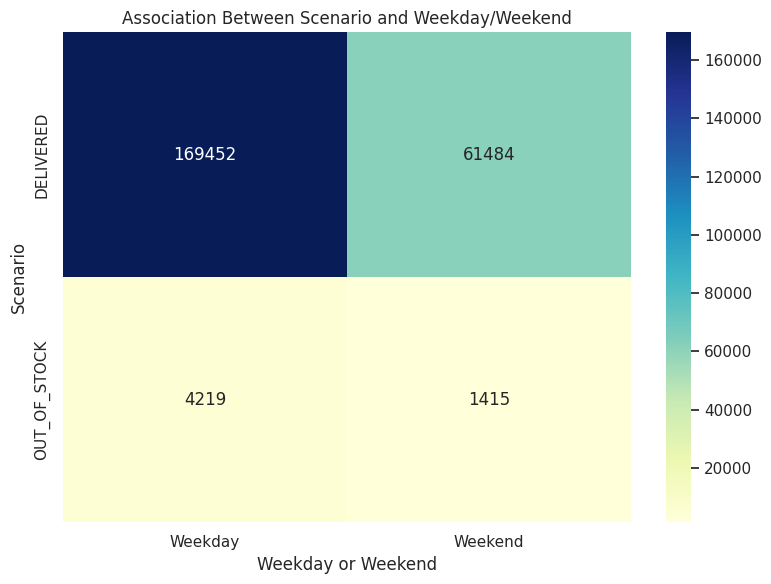

In [ ]:
# Create a contingency table of scenario vs weekday_or_weekend
ct = pd.crosstab(df['scenario'], df['weekday_or_weekend'])

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(ct, annot=True, fmt="d", cmap="YlGnBu")
plt.title("Association Between Scenario and Weekday/Weekend")
plt.xlabel("Weekday or Weekend")
plt.ylabel("Scenario")
plt.tight_layout()
plt.show()


Cramér's V matrix:
                    scenario  restaurant_alias  item_alias     am_pm  \
scenario            0.999909          0.033728    0.043594  0.000000   
restaurant_alias    0.033728          1.000000    0.447200  0.000000   
item_alias          0.043594          0.447200    1.000000  0.000000   
am_pm               0.000000          0.000000    0.000000  0.999985   
weekday_or_weekend  0.004749          0.008710    0.005313  0.000000   

                    weekday_or_weekend  
scenario                      0.004749  
restaurant_alias              0.008710  
item_alias                    0.005313  
am_pm                         0.000000  
weekday_or_weekend            0.999989  


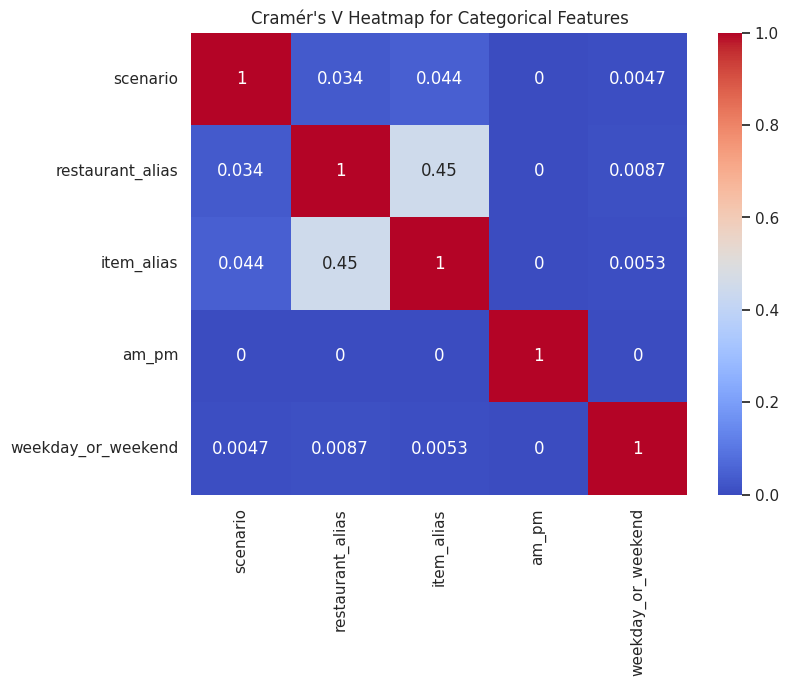

In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import chi2_contingency
import seaborn as sns
import matplotlib.pyplot as plt

def cramers_v(confusion_matrix):
    from scipy.stats import chi2_contingency
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.values.sum()  # Change here!
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    # Correct for bias:
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return (phi2corr / min((kcorr-1), (rcorr-1)))**0.5

# # Example: Compute Cramér's V between 'scenario' and 'weekday_or_weekend'
# # (Adjust the column names as necessary)
# conf_matrix = pd.crosstab(df['scenario'], df['weekday_or_weekend'])
# cramers_v_value = cramers_v(conf_matrix)
# print("Cramér's V between 'scenario' and 'weekday_or_weekend':", cramers_v_value)

# If you want to compute pairwise Cramér's V for multiple categorical columns, first select the columns:
categorical_cols = ['scenario', 'restaurant_alias', 'item_alias','am_pm', 'weekday_or_weekend']  # Adjust as needed

# Create an empty DataFrame to store the Cramér's V results.
cramers_v_matrix = pd.DataFrame(index=categorical_cols, columns=categorical_cols, dtype=float)
for col1 in categorical_cols:
    for col2 in categorical_cols:
        confusion_mat = pd.crosstab(df[col1], df[col2])
        cramers_v_matrix.loc[col1, col2] = cramers_v(confusion_mat)

print("\nCramér's V matrix:")
print(cramers_v_matrix)

# Plot a heatmap of the Cramér's V matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cramers_v_matrix.astype(float), annot=True, cmap='coolwarm', vmin=0, vmax=1)
plt.title("Cramér's V Heatmap for Categorical Features")
plt.show()

<Figure size 1000x800 with 0 Axes>

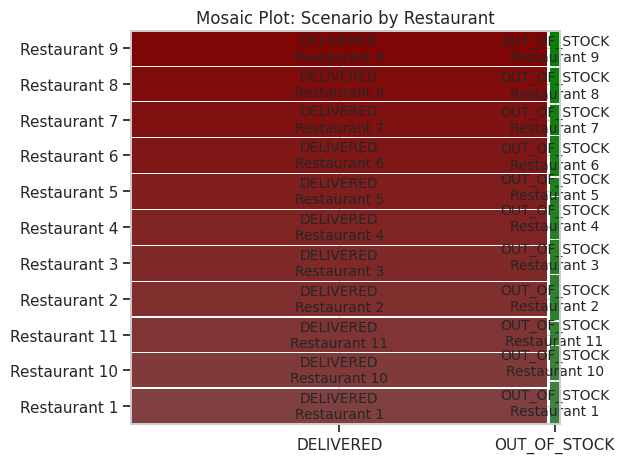

In [ ]:
from statsmodels.graphics.mosaicplot import mosaic
import matplotlib.pyplot as plt

# For scenario and restaurant_alias
mosaic_data = pd.crosstab(df['scenario'], df['restaurant_alias'])

# The mosaic function expects a dictionary of keys, so we stack the table, which gives a multi-index Series.
plt.figure(figsize=(10, 8))
mosaic(mosaic_data.stack(), title="Mosaic Plot: Scenario by Restaurant")
plt.tight_layout()
plt.show()

<Figure size 800x600 with 0 Axes>

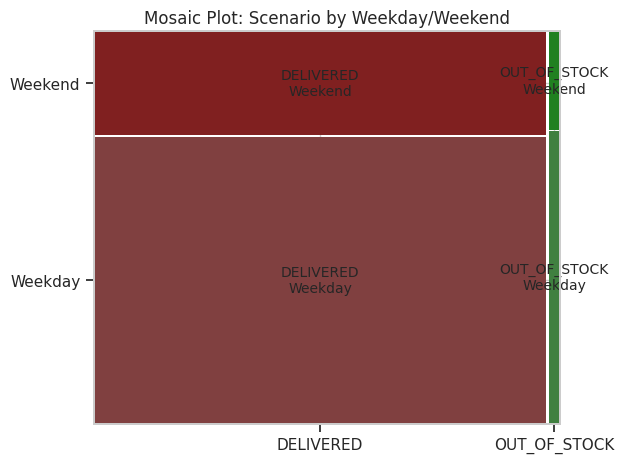

In [ ]:
plt.figure(figsize=(8, 6))
mosaic(pd.crosstab(df['scenario'], df['weekday_or_weekend']).stack(),
       title="Mosaic Plot: Scenario by Weekday/Weekend")
plt.tight_layout()
plt.show()

# Time Series EDA

In [ ]:
# Make a copy of the original DataFrame for time series analysis.
df_timeseries = df.copy()

In [ ]:
# Set the copy's 'createdTime' column as the index
df_timeseries.set_index('createdTime', inplace=True)

KeyError: "None of ['createdTime'] are in the columns"

In [ ]:
# Aggregate daily order counts; this operation relies on a datetime index.
daily_counts = df_timeseries.resample('D').size()
print(daily_counts.head())

createdTime
2025-01-01 00:00:00+00:00    833
2025-01-02 00:00:00+00:00    754
2025-01-03 00:00:00+00:00    837
2025-01-04 00:00:00+00:00    920
2025-01-05 00:00:00+00:00    882
Freq: D, dtype: int64


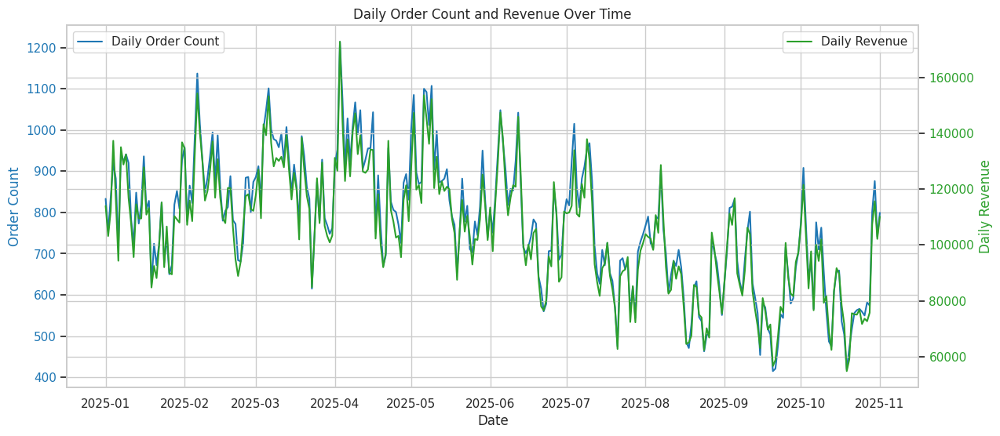

In [ ]:
# Aggregate daily metrics
daily_counts = df_timeseries.resample('D').size()  # Count orders per day
daily_revenue = df_timeseries.resample('D')['total'].sum()  # Sum of totals per day

# Plot the trends
fig, ax1 = plt.subplots(figsize=(14, 6))
color = 'tab:blue'
ax1.set_xlabel('Date')
ax1.set_ylabel('Order Count', color=color)
ax1.plot(daily_counts.index, daily_counts.values, color=color, label='Daily Order Count')
ax1.tick_params(axis='y', labelcolor=color)
ax1.legend(loc='upper left')

ax2 = ax1.twinx()  # instantiate a second axis that shares the same x-axis
color = 'tab:green'
ax2.set_ylabel('Daily Revenue', color=color)
ax2.plot(daily_revenue.index, daily_revenue.values, color=color, label='Daily Revenue')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')

plt.title('Daily Order Count and Revenue Over Time')
plt.show()

<ipython-input-35-0e120583c3da>:6: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_counts = df_timeseries.resample('M').size()
<ipython-input-35-0e120583c3da>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_revenue = df_timeseries.resample('M')['total'].sum()


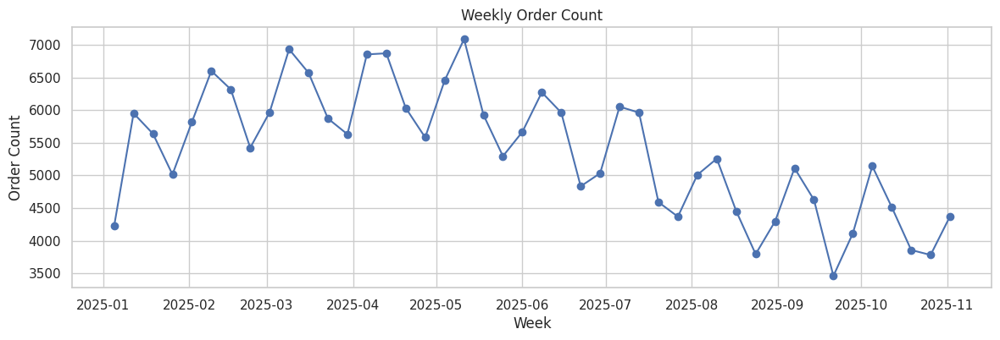

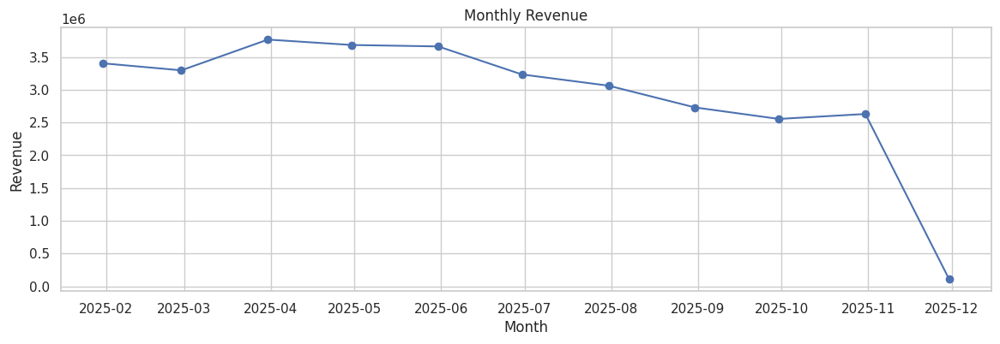

In [ ]:
# Weekly aggregation
weekly_counts = df_timeseries.resample('W').size()
weekly_revenue = df_timeseries.resample('W')['total'].sum()

# Monthly aggregation
monthly_counts = df_timeseries.resample('M').size()
monthly_revenue = df_timeseries.resample('M')['total'].sum()

# Plot weekly counts
plt.figure(figsize=(14, 4))
plt.plot(weekly_counts.index, weekly_counts.values, marker='o', linestyle='-')
plt.title('Weekly Order Count')
plt.xlabel('Week')
plt.ylabel('Order Count')
plt.show()

# Plot monthly revenue
plt.figure(figsize=(14, 4))
plt.plot(monthly_revenue.index, monthly_revenue.values, marker='o', linestyle='-')
plt.title('Monthly Revenue')
plt.xlabel('Month')
plt.ylabel('Revenue')
plt.show()

<ipython-input-36-e846ab1971c0>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=hourly_counts.index, y=hourly_counts.values, palette="Blues_d")


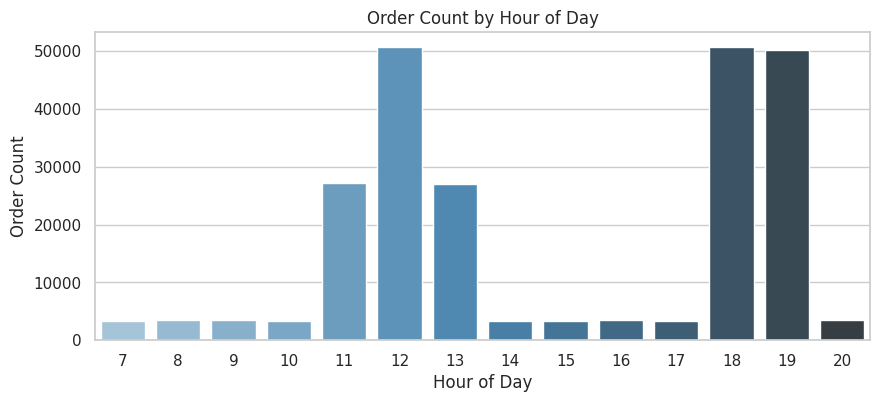

In [ ]:
# Aggregate order counts by hour across all days
hourly_counts = df.groupby('hour').size()

plt.figure(figsize=(10, 4))
sns.barplot(x=hourly_counts.index, y=hourly_counts.values, palette="Blues_d")
plt.title('Order Count by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Order Count')
plt.show()

<ipython-input-37-298607172b52>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='weekday', data=df, palette="pastel", order=sorted(df['weekday'].unique()))


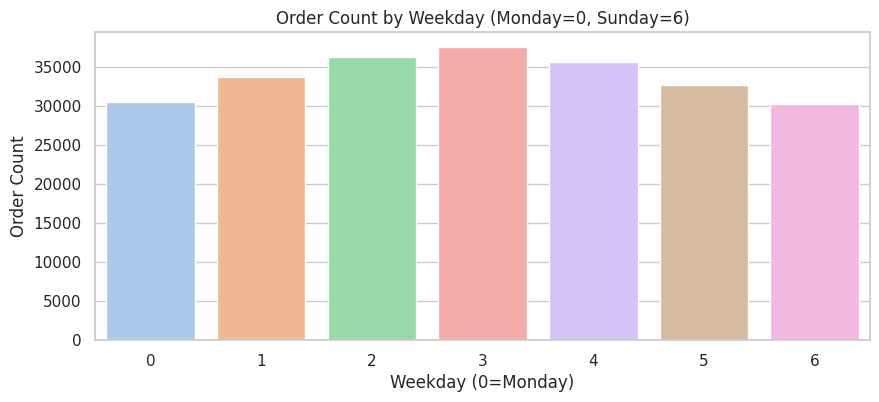

In [ ]:
# Aggregate order counts by weekday across all days
plt.figure(figsize=(10, 4))
sns.countplot(x='weekday', data=df, palette="pastel", order=sorted(df['weekday'].unique()))
plt.title('Order Count by Weekday (Monday=0, Sunday=6)')
plt.xlabel('Weekday (0=Monday)')
plt.ylabel('Order Count')
plt.show()

<ipython-input-38-38c7af68da34>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='hour', y='total', data=df, palette="vlag")


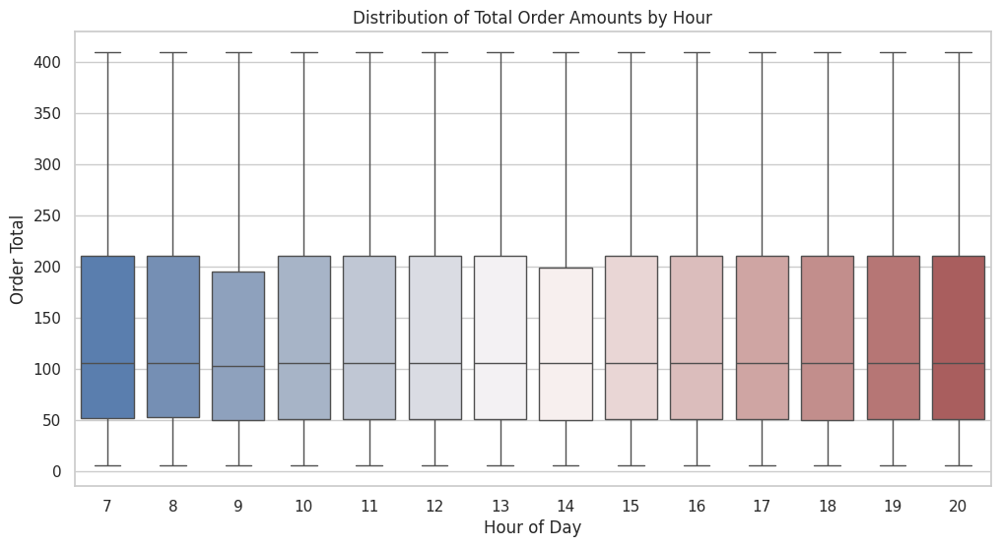

In [ ]:
# boxplot for orders by hour of day to see the distribution of order totals
plt.figure(figsize=(12, 6))
sns.boxplot(x='hour', y='total', data=df, palette="vlag")
plt.title('Distribution of Total Order Amounts by Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Order Total')
plt.show()

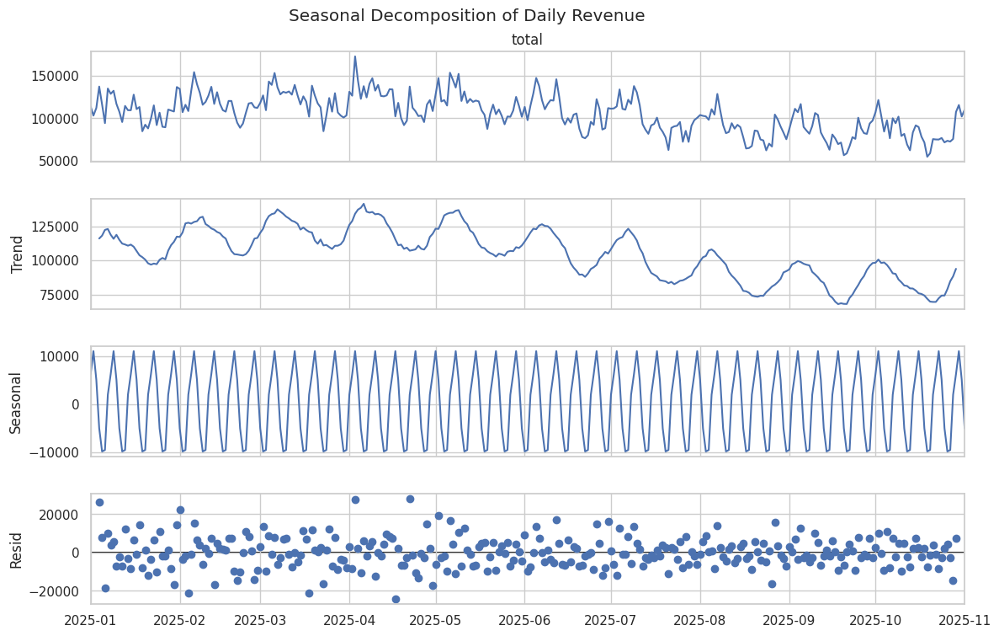

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Ensure the daily series has a continuous date range; if there are missing days, consider reindexing
daily_revenue = daily_revenue.asfreq('D')

decomposition = seasonal_decompose(daily_revenue, model='additive')
fig = decomposition.plot()
fig.set_size_inches(14, 8)
plt.suptitle('Seasonal Decomposition of Daily Revenue')
plt.show()

Time vs Scenarios

In [ ]:
# Group by 'scenario' and re-sample on a daily basis, then count the orders
daily_counts = df_timeseries.groupby('scenario').resample('D').size().unstack('scenario', fill_value=0)

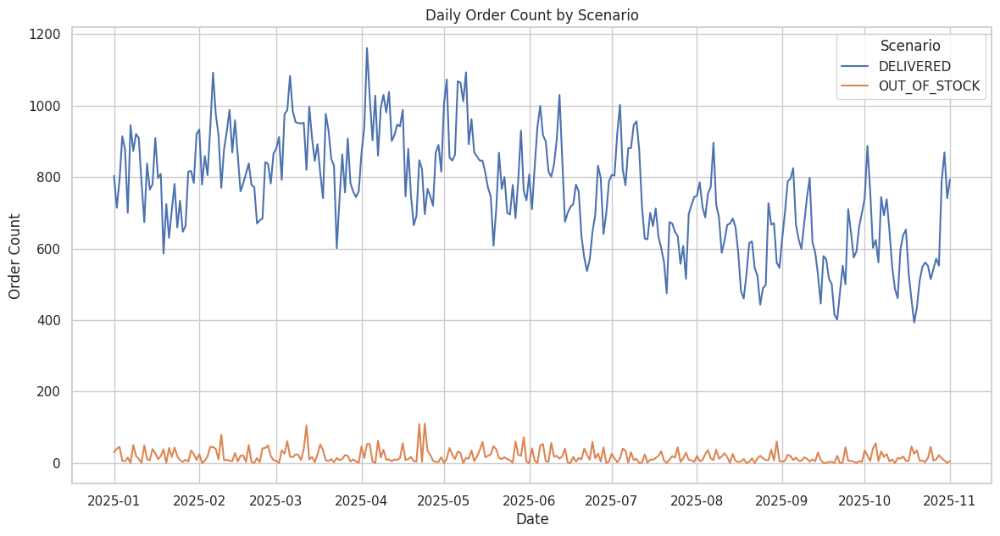

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))
for scenario in daily_counts.columns:
    plt.plot(daily_counts.index, daily_counts[scenario], label=scenario)

plt.xlabel('Date')
plt.ylabel('Order Count')
plt.title('Daily Order Count by Scenario')
plt.legend(title='Scenario')
plt.show()

In [ ]:
unique_scenarios = df['scenario'].unique()
print("Unique scenarios:", unique_scenarios)

Unique scenarios: ['DELIVERED' 'OUT_OF_STOCK']


Hourly Out-Of-Stock counts for each Restaurant–Item pair:
hour                           7    8    9     10    11    12    13   14   15  \
restaurant_alias item_alias                                                     
Restaurant 1     Lowenbrau…   4.0  8.0  5.0  12.0  22.0  58.0  26.0  4.0  4.0   
                 Maker's Ma…  1.0  2.0  1.0   1.0  14.0  37.0  23.0  4.0  3.0   
                 St Remy VS…  4.0  1.0  3.0   3.0  24.0  48.0  18.0  6.0  2.0   
Restaurant 10    Bacon Wrap…  0.0  0.0  0.0   0.0   8.0   7.0   3.0  2.0  1.0   
                 Beef Strog…  0.0  0.0  2.0   0.0   4.0  12.0  10.0  0.0  0.0   
...                           ...  ...  ...   ...   ...   ...   ...  ...  ...   
Restaurant 8     Spanakopit…  0.0  1.0  0.0   0.0   4.0   7.0   3.0  0.0  2.0   
                 Walnut Rai…  0.0  0.0  0.0   0.0   2.0   7.0   5.0  0.0  2.0   
Restaurant 9     Lowenbrau…   9.0  6.0  1.0   9.0  30.0  78.0  29.0  3.0  4.0   
                 Maker's Ma…  2.0  1.0  2.0   0.0  

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


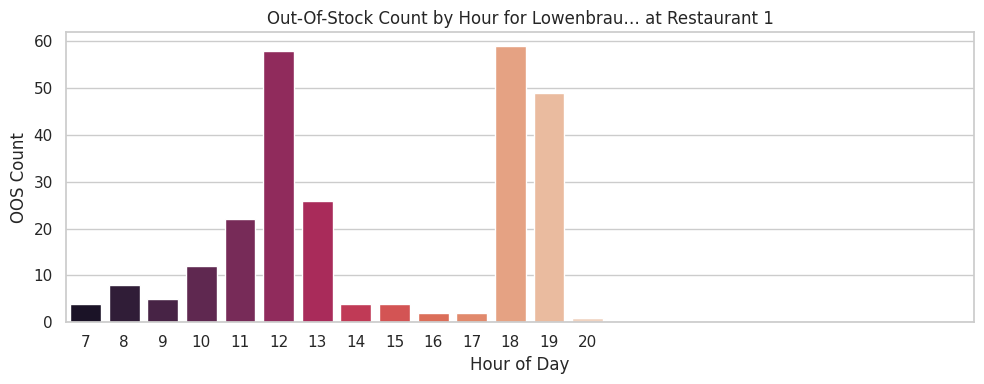

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


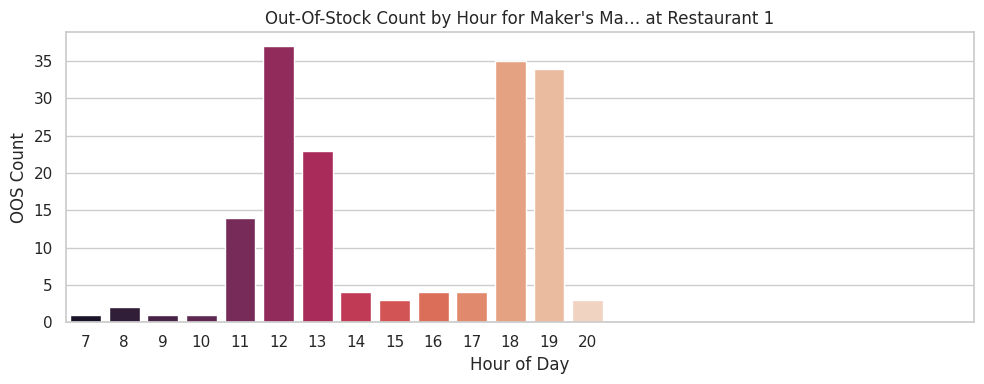

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


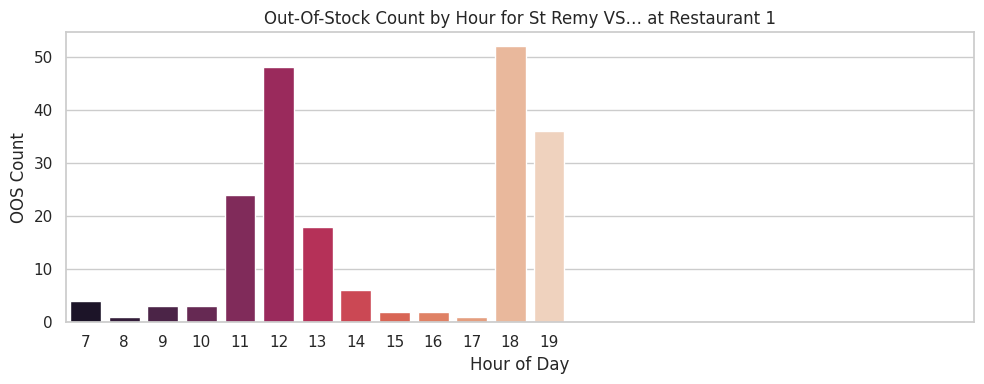

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


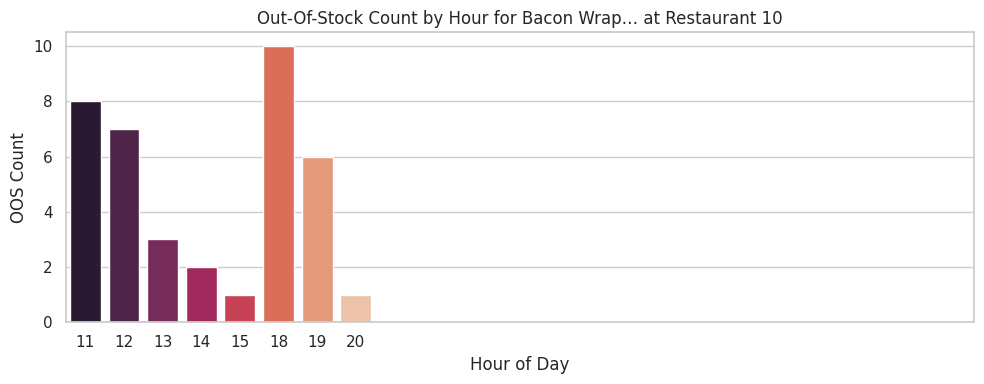

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


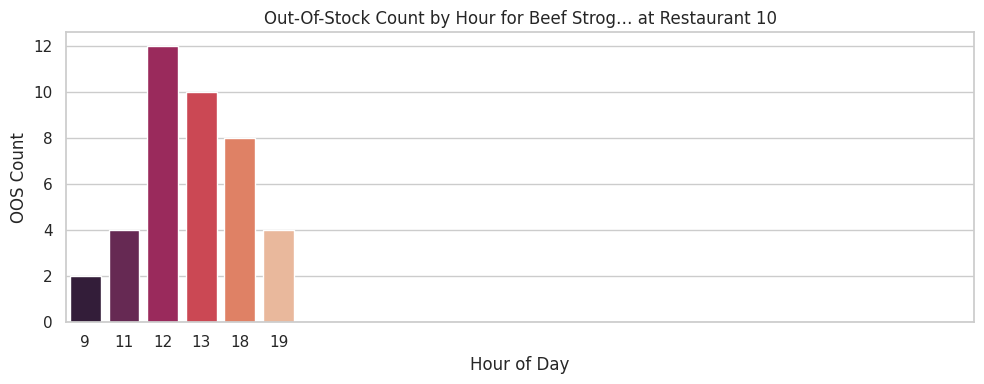

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


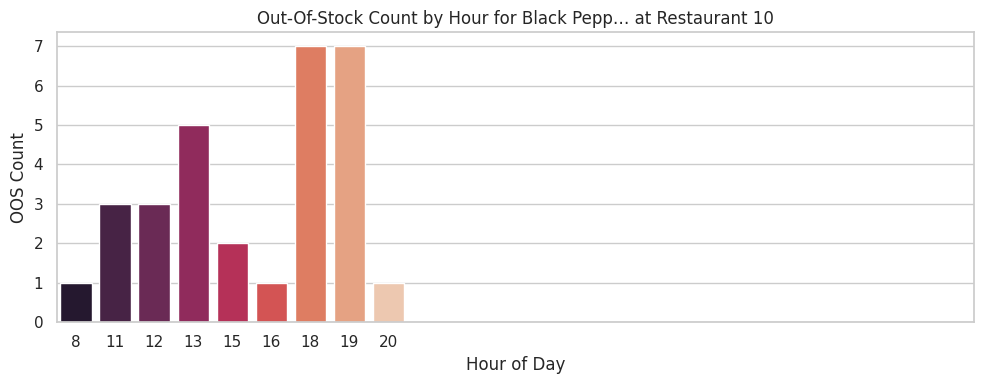

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


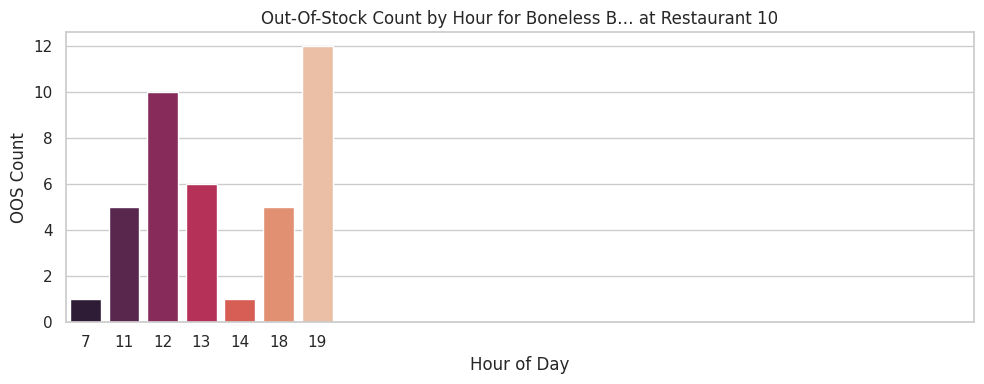

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


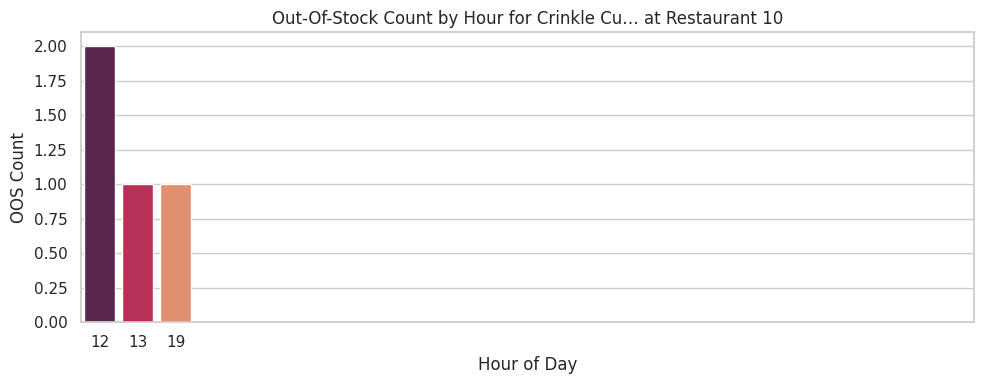

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


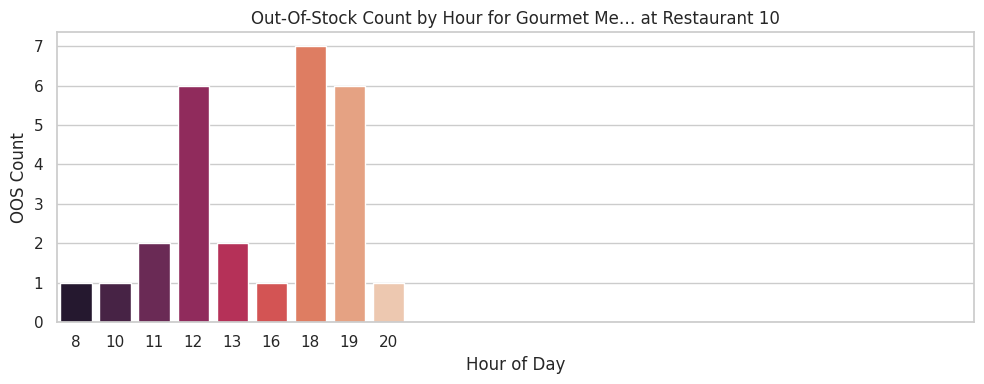

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


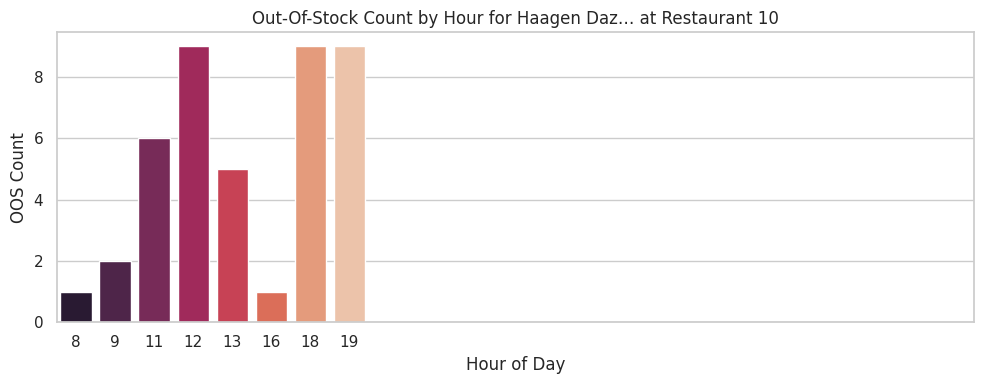

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


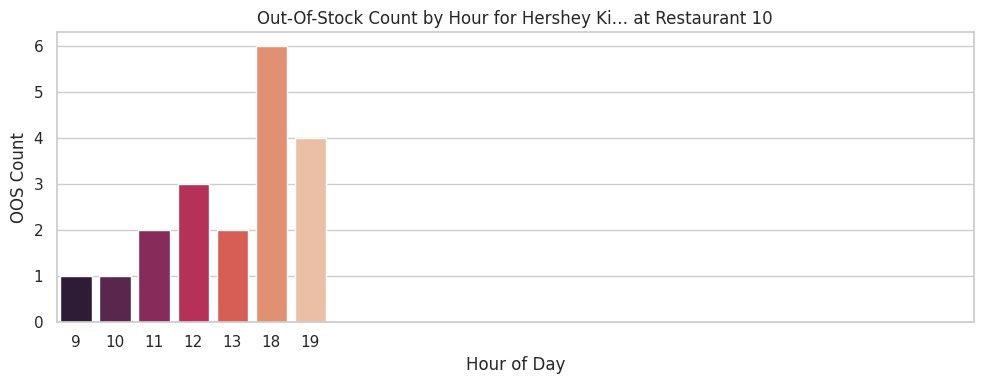

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


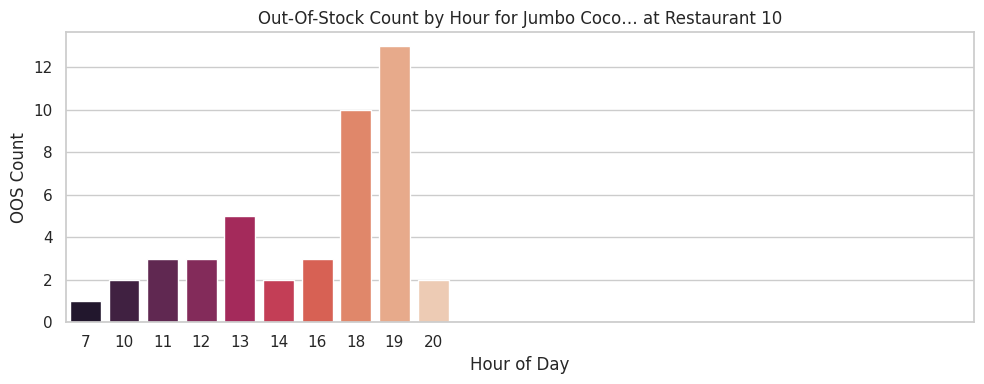

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


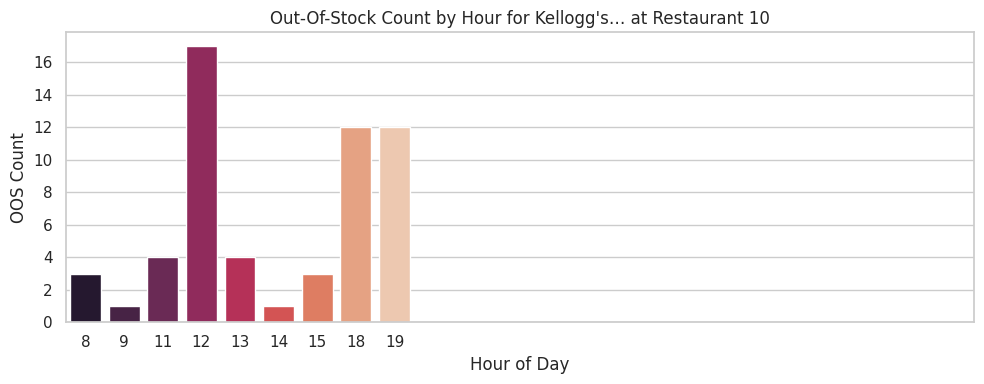

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


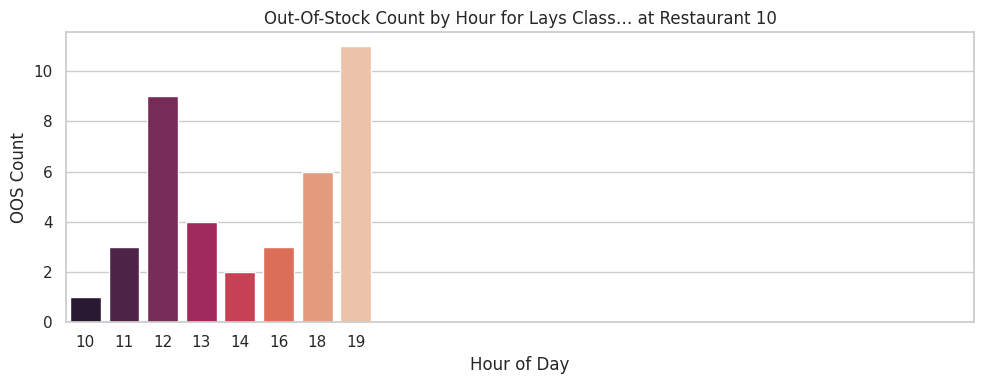

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


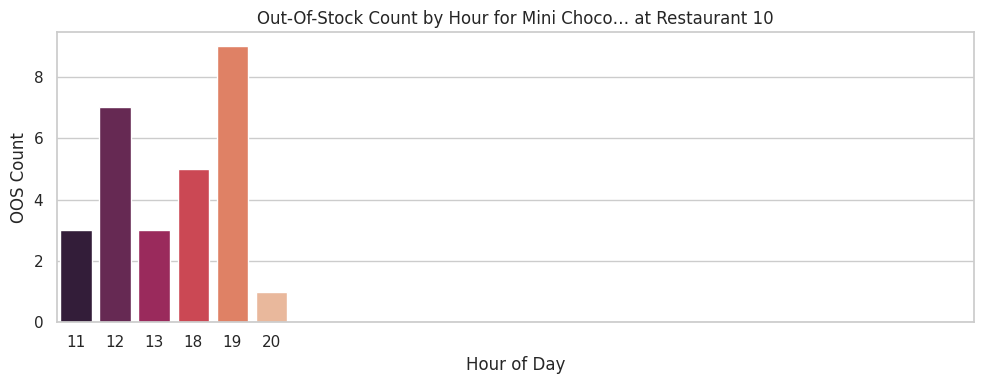

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


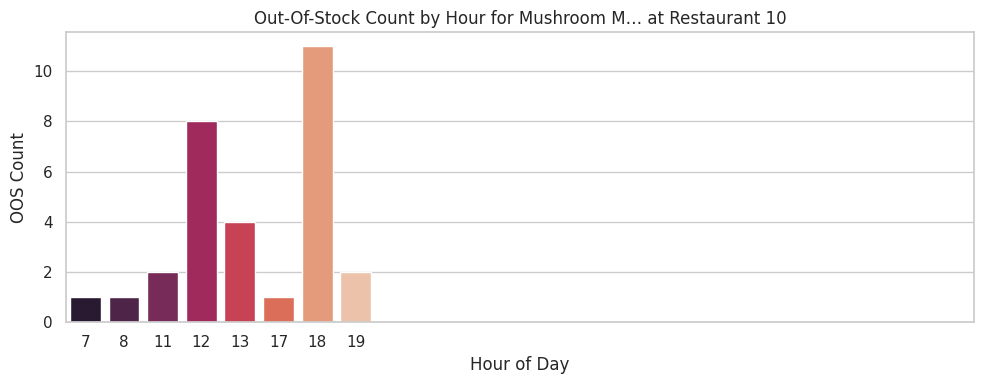

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


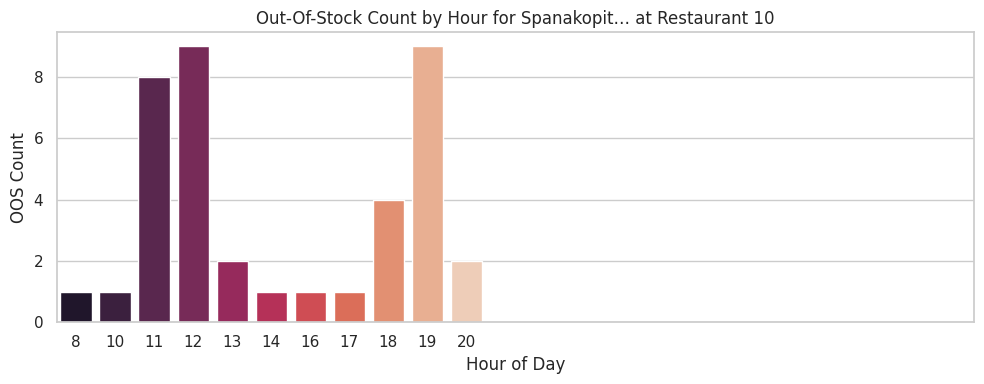

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


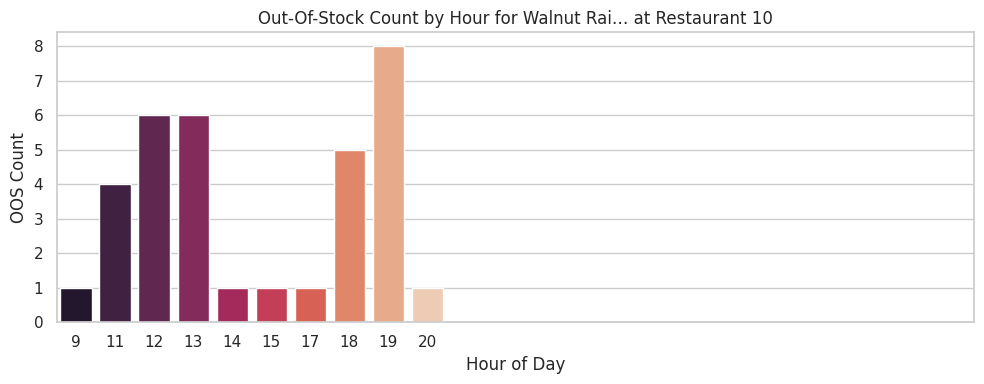

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


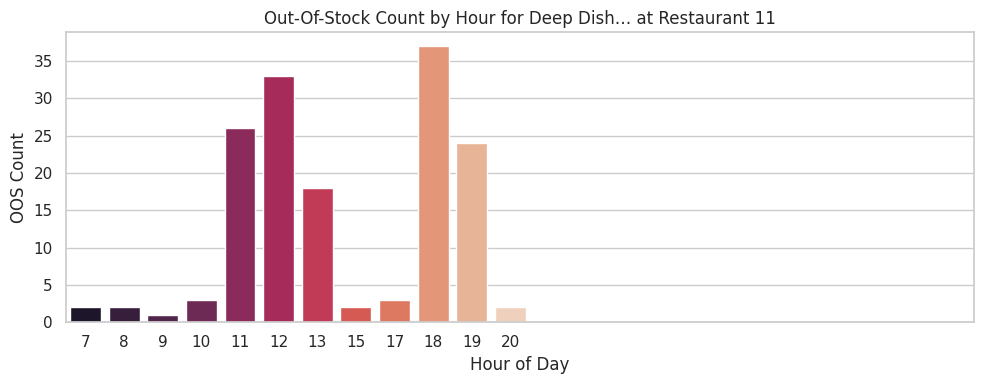

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


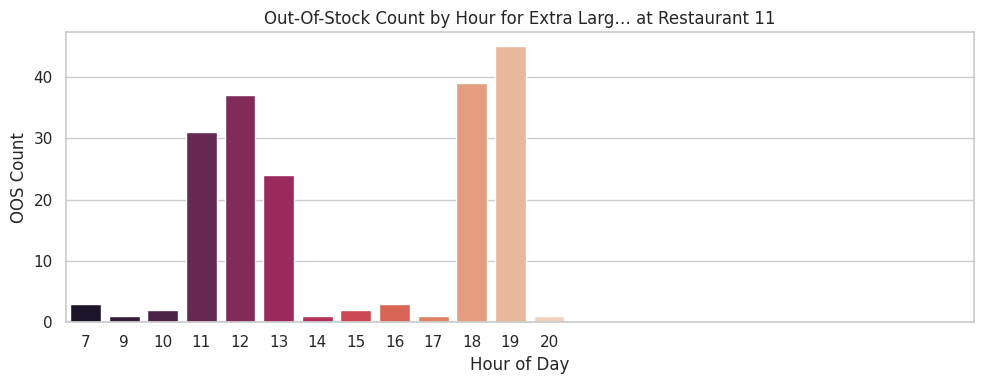

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


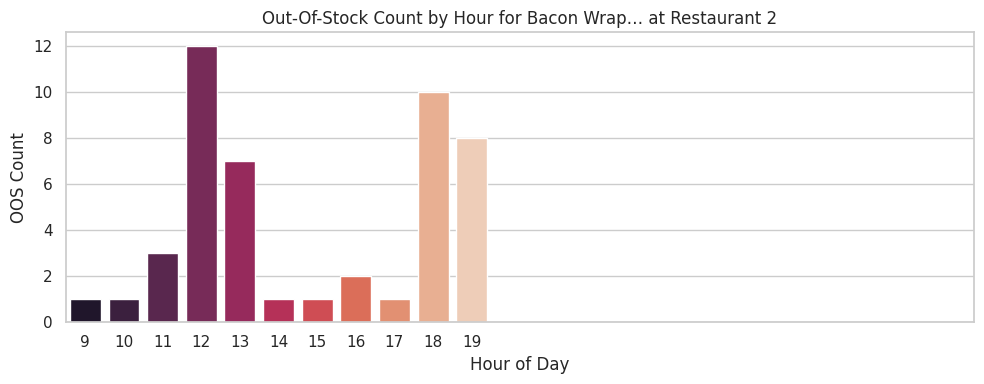

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


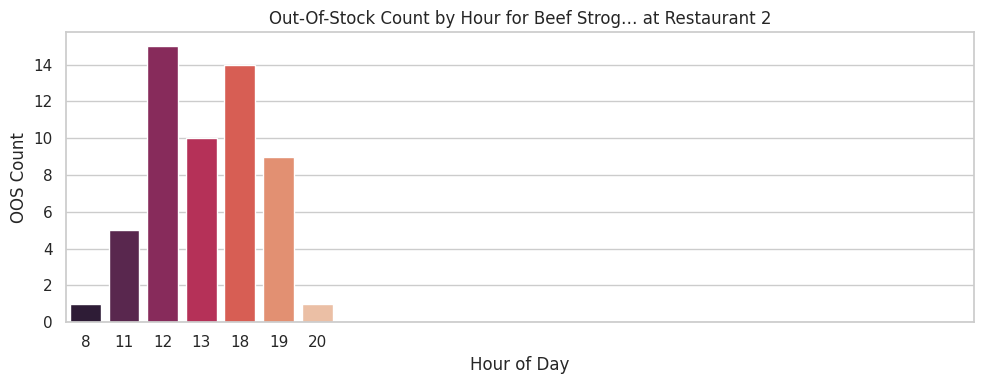

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


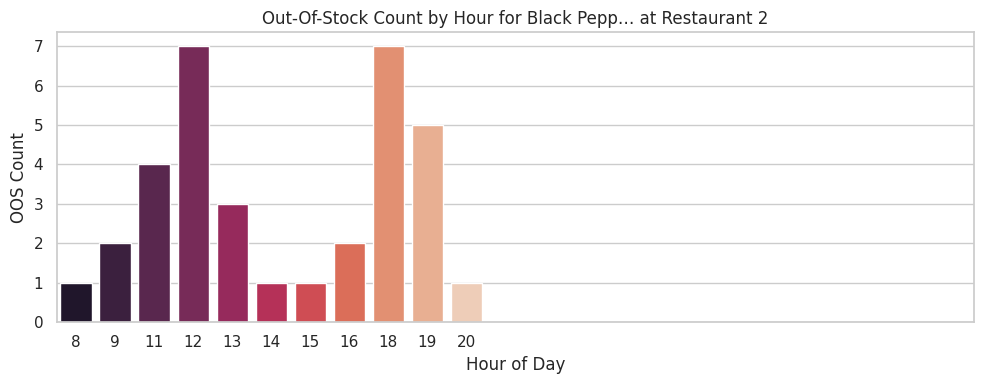

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


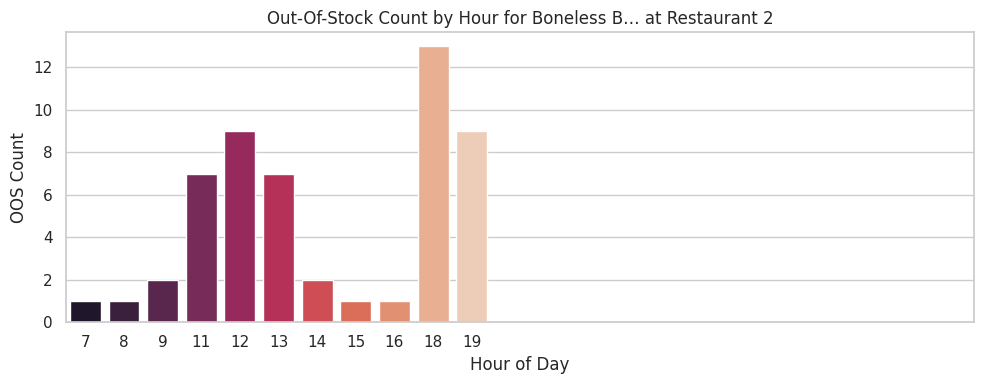

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


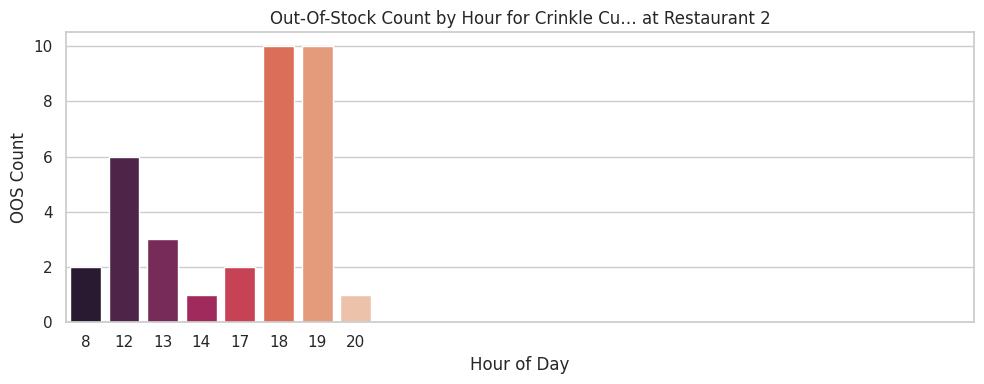

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


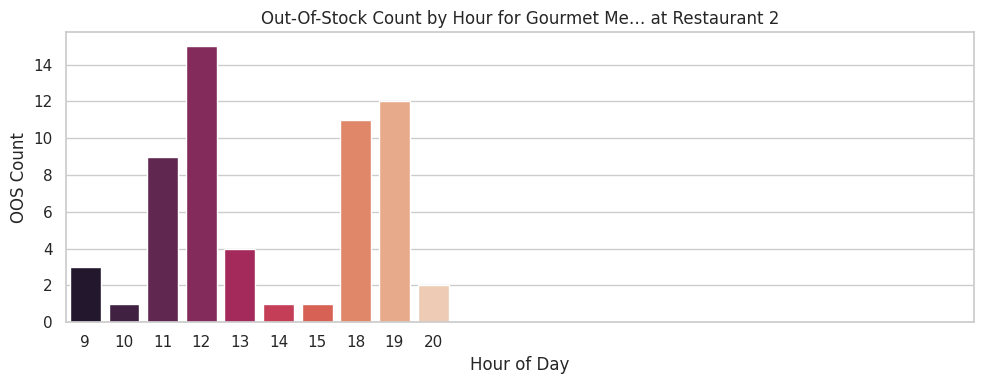

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


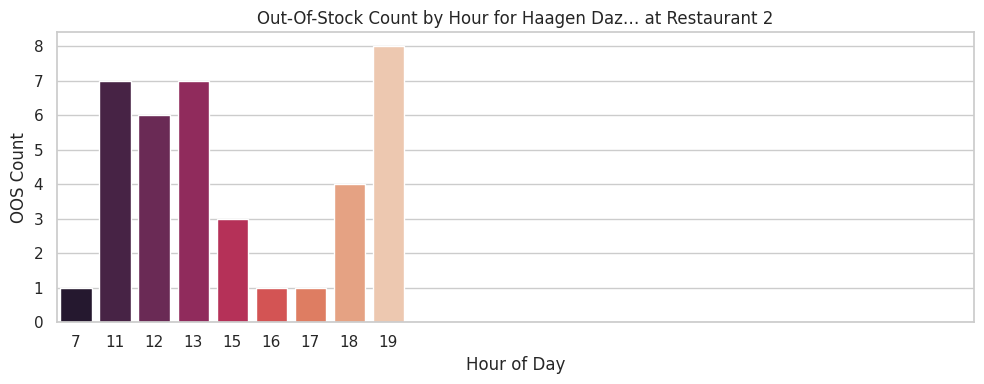

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


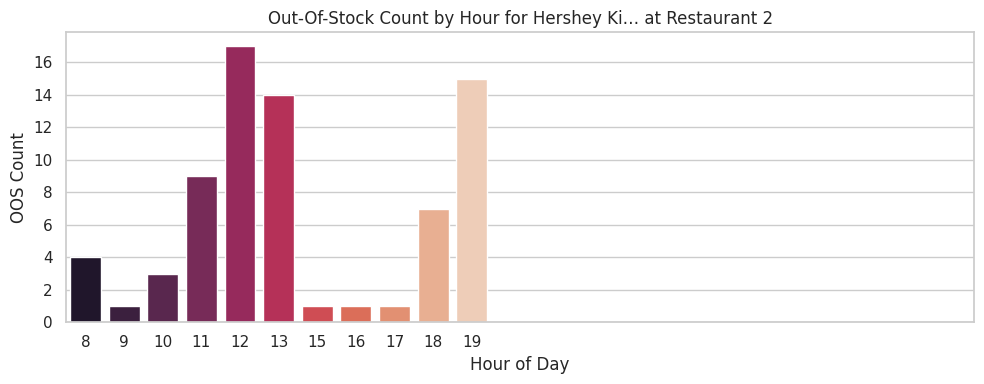

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


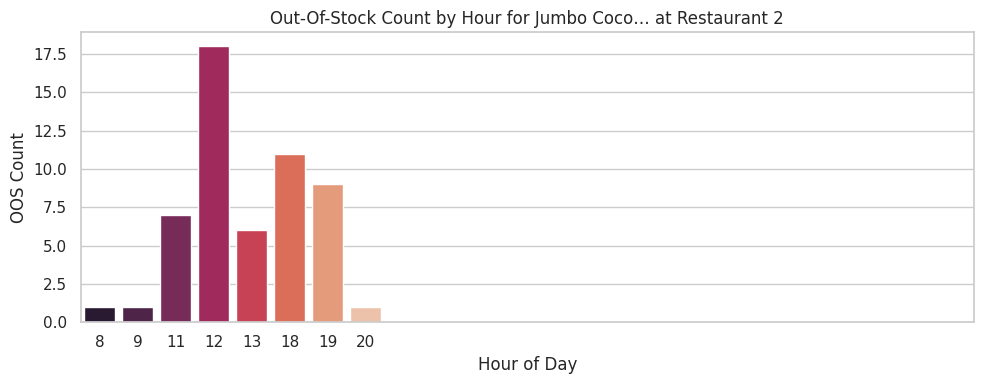

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


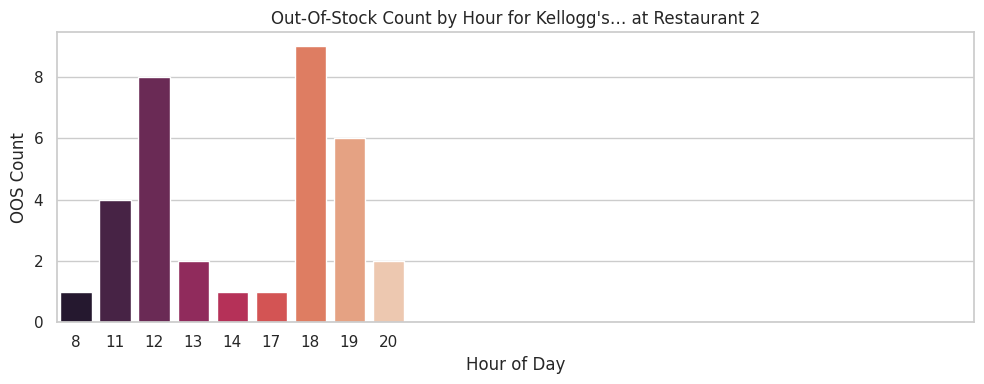

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


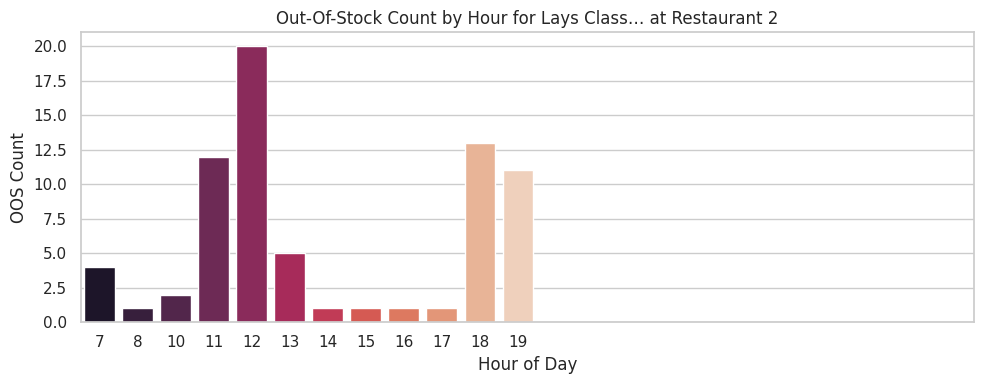

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


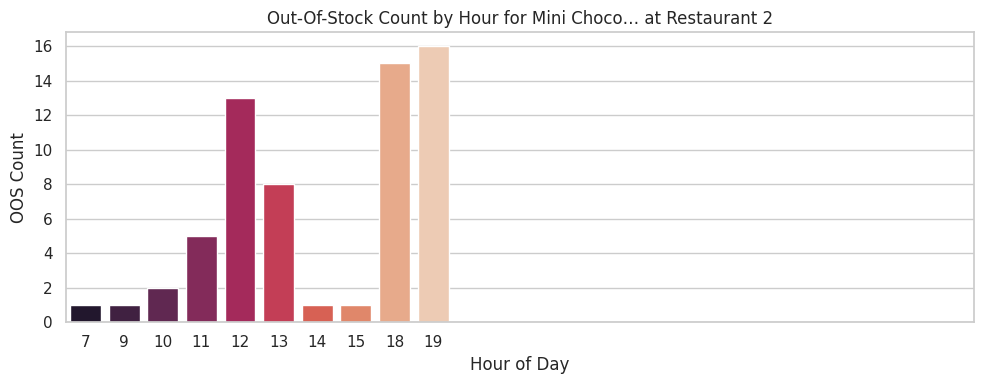

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


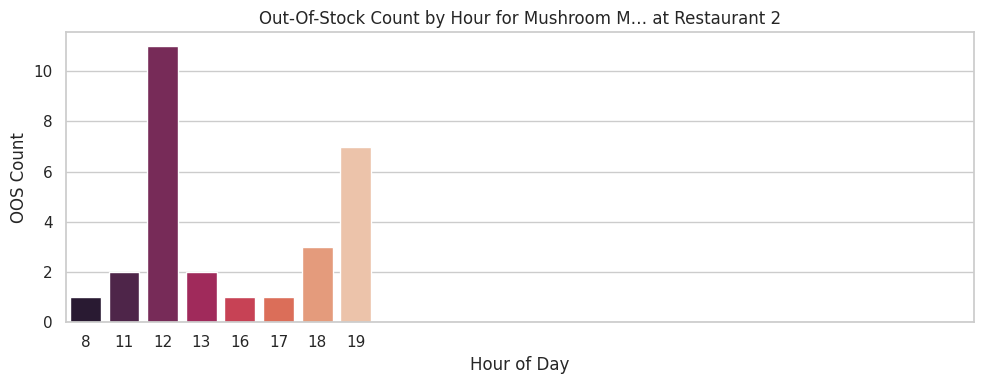

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


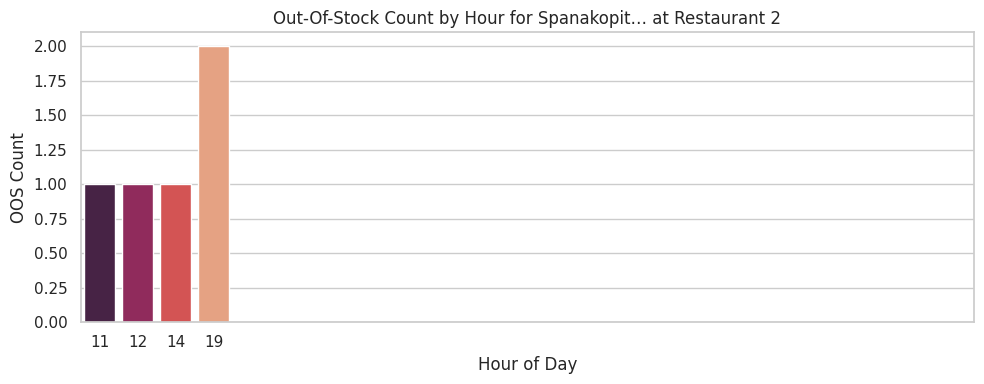

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


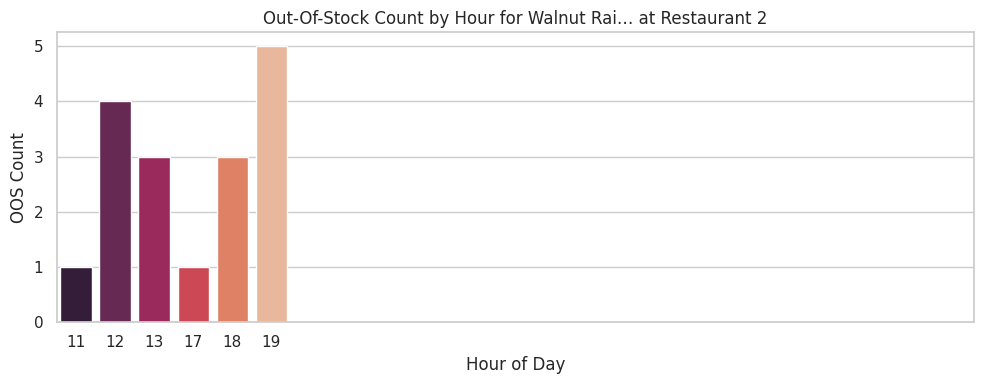

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


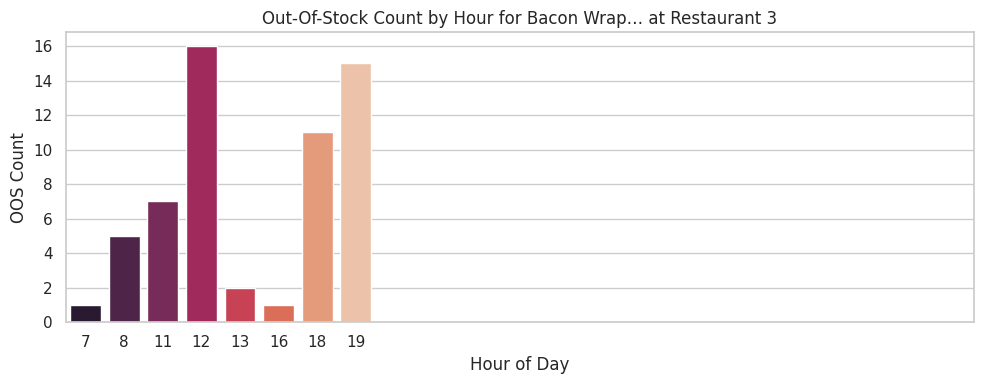

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


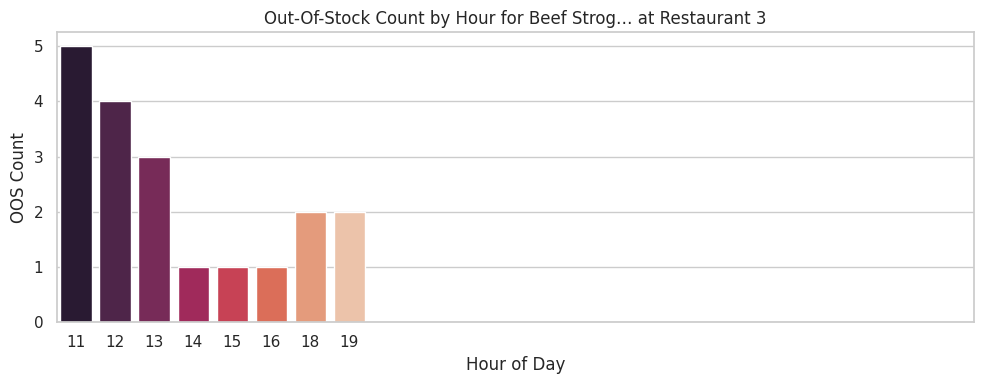

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


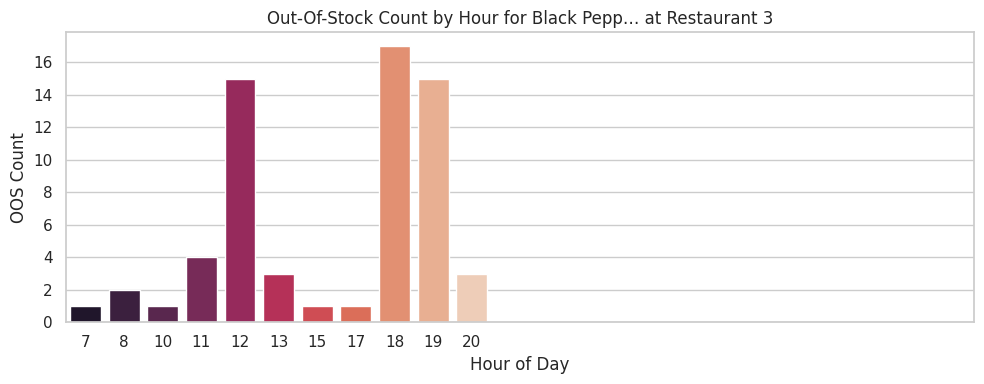

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


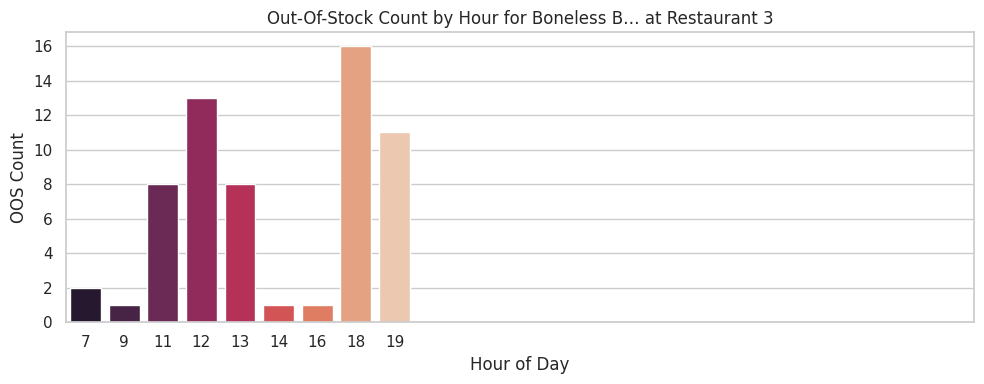

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


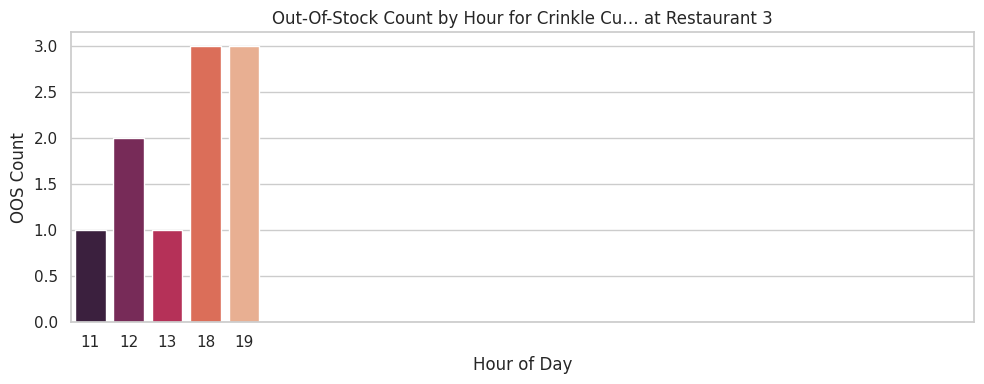

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


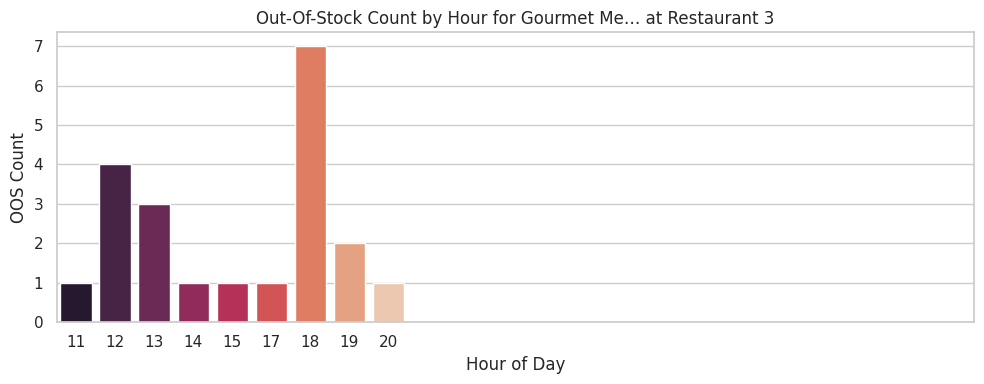

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


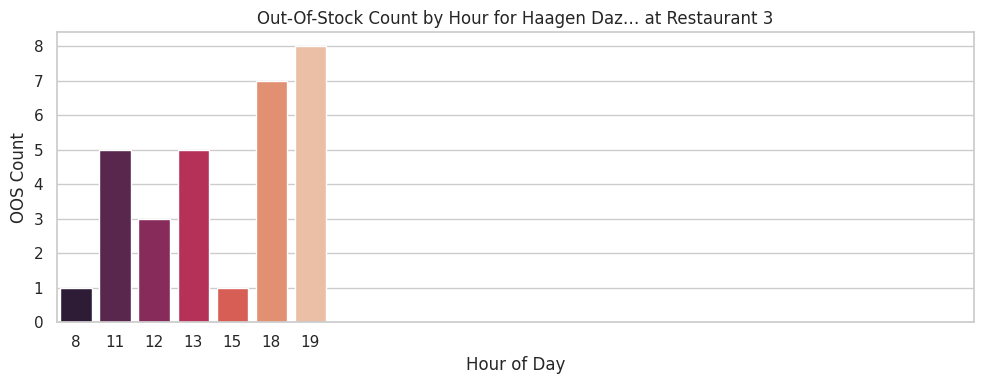

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


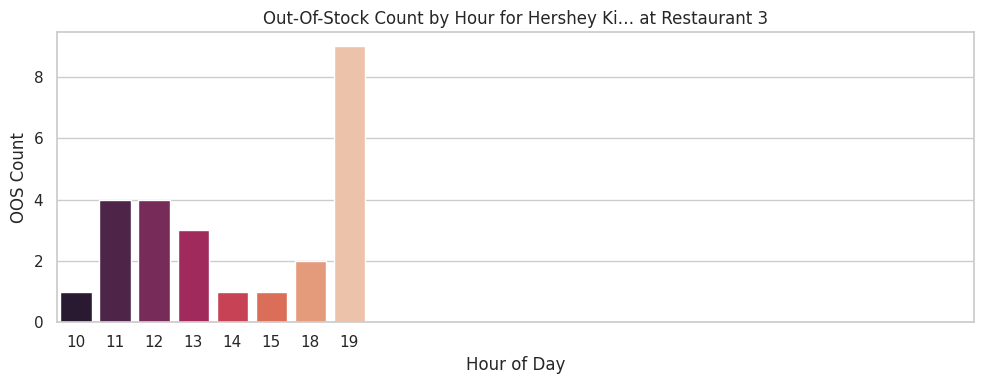

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


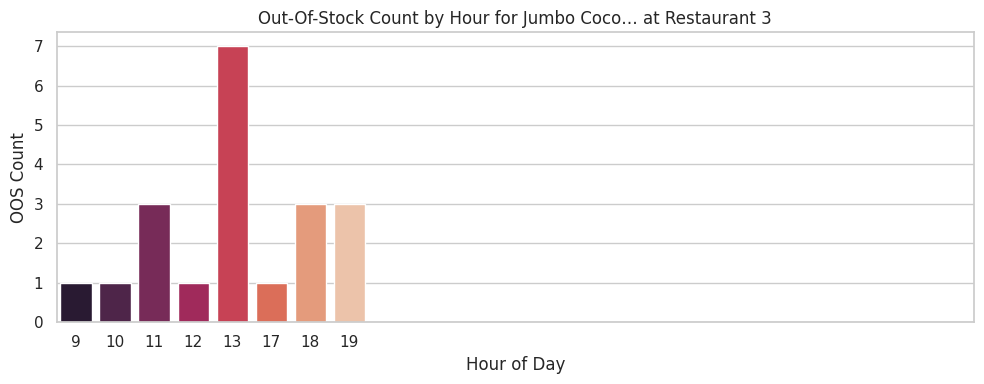

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


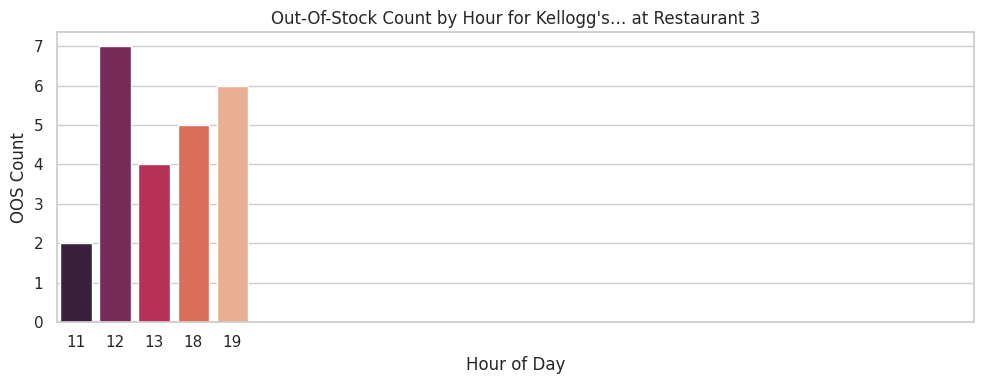

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


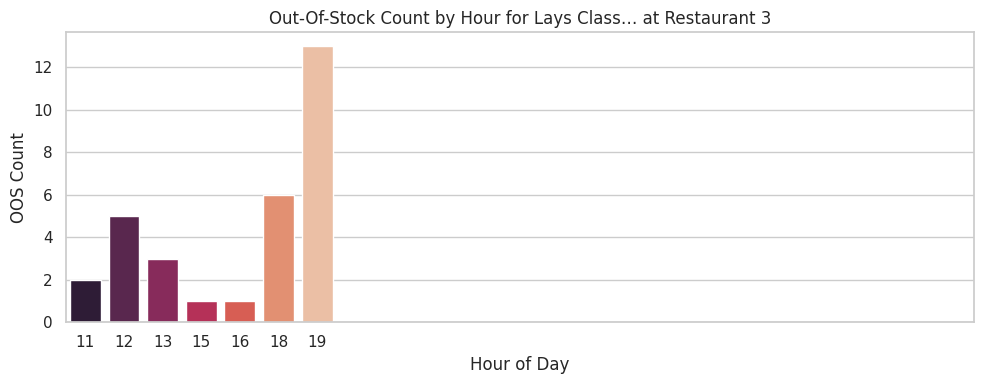

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


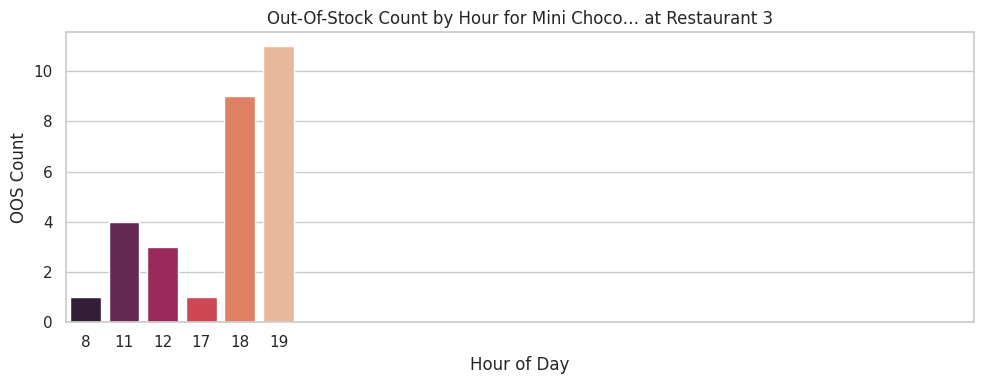

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


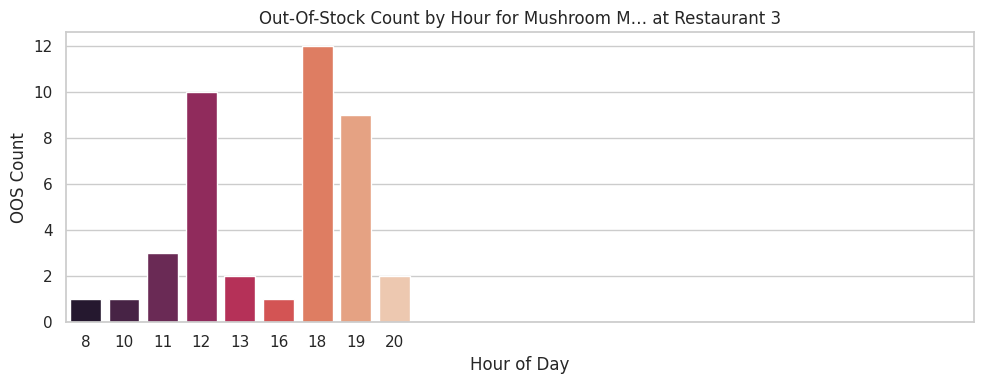

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


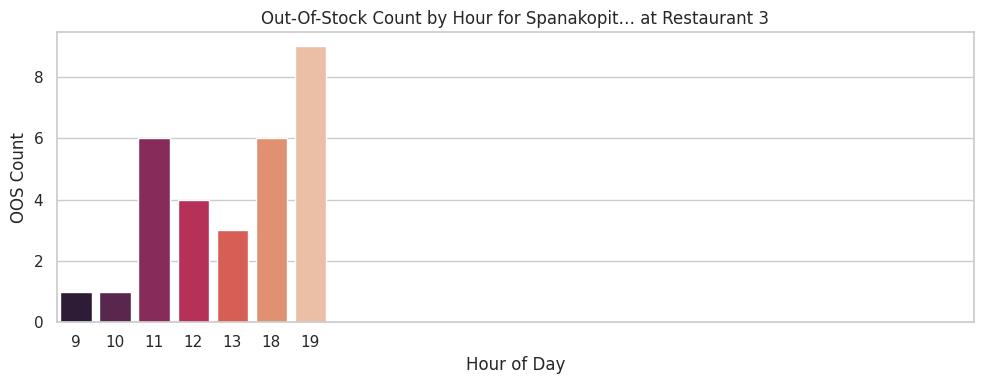

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


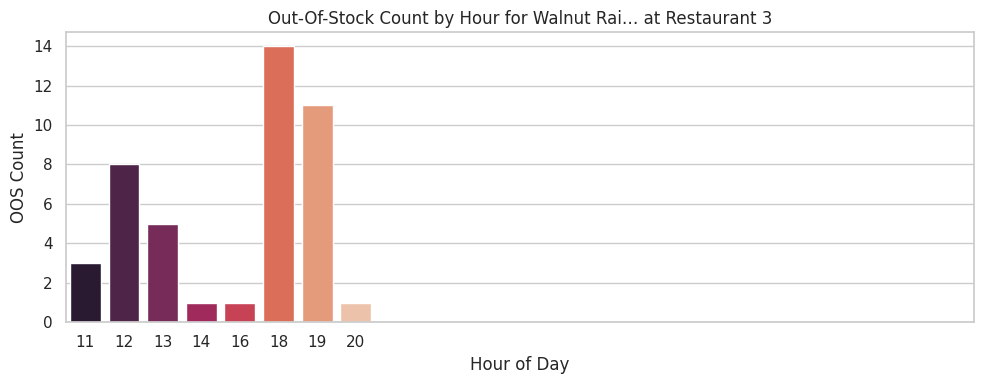

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


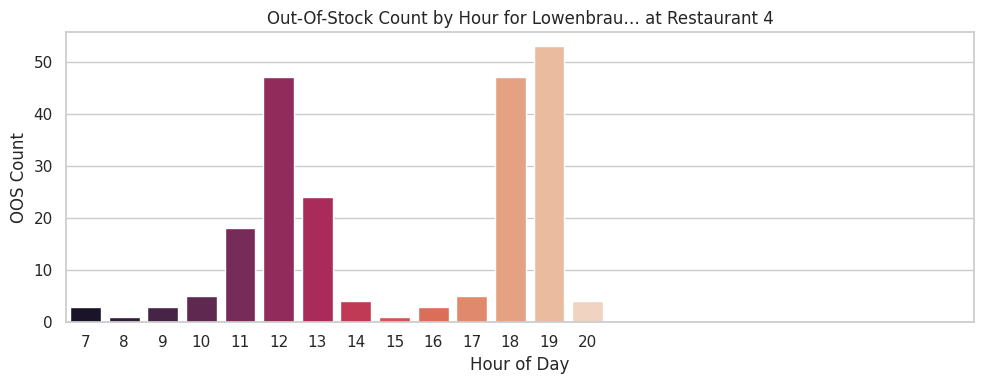

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


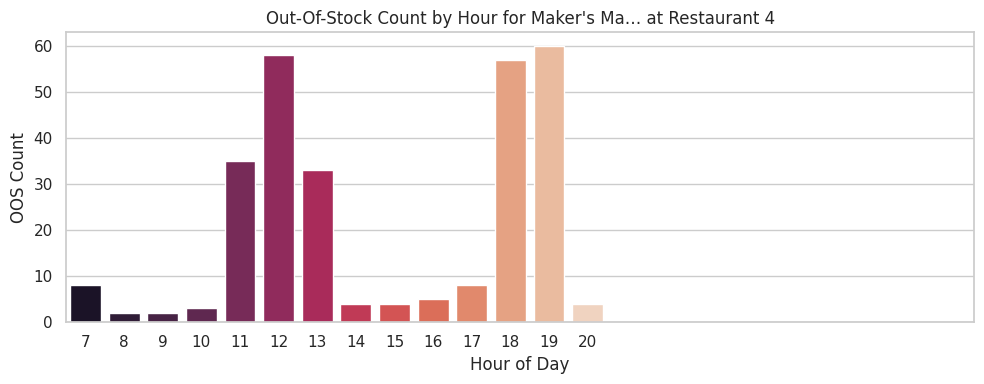

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


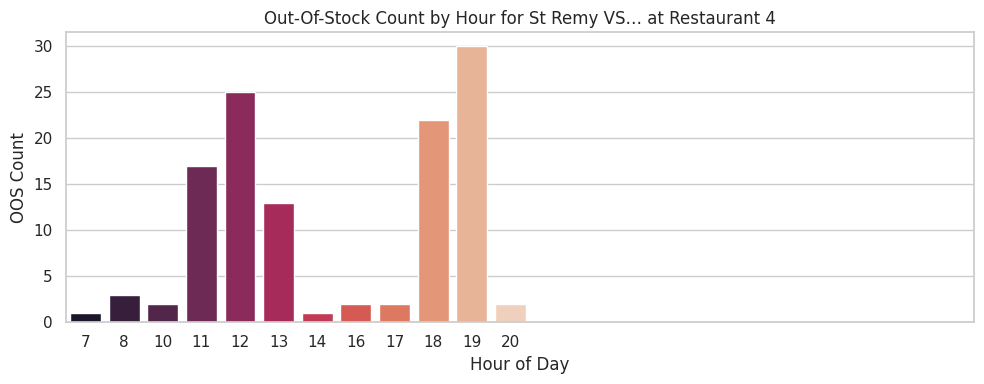

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


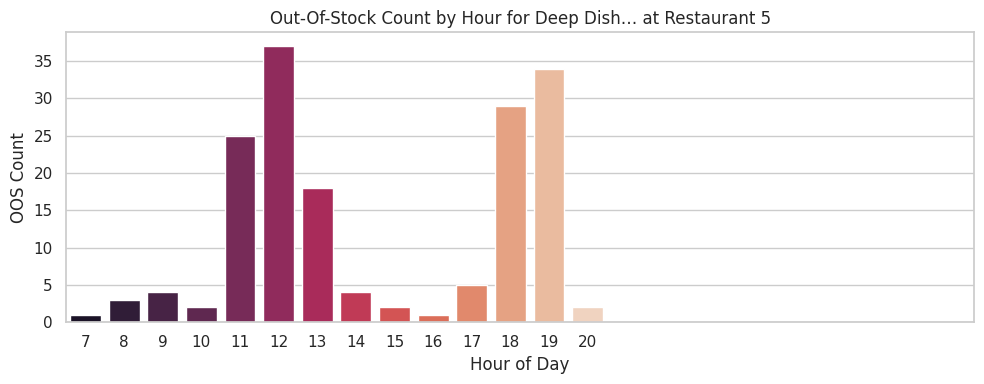

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


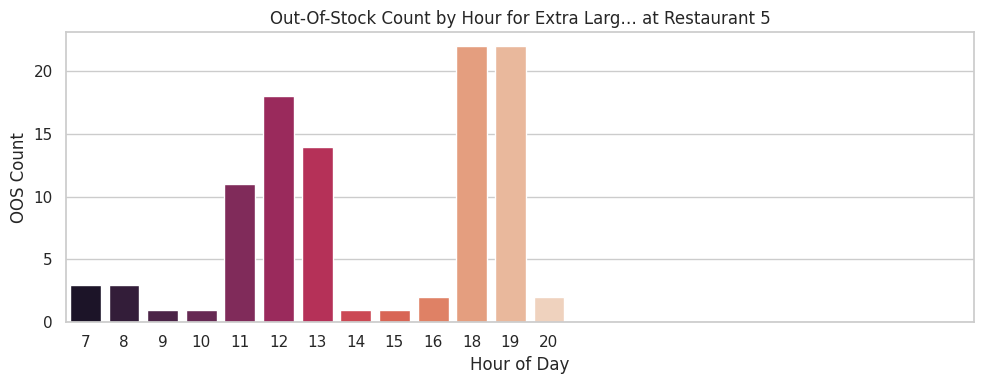

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


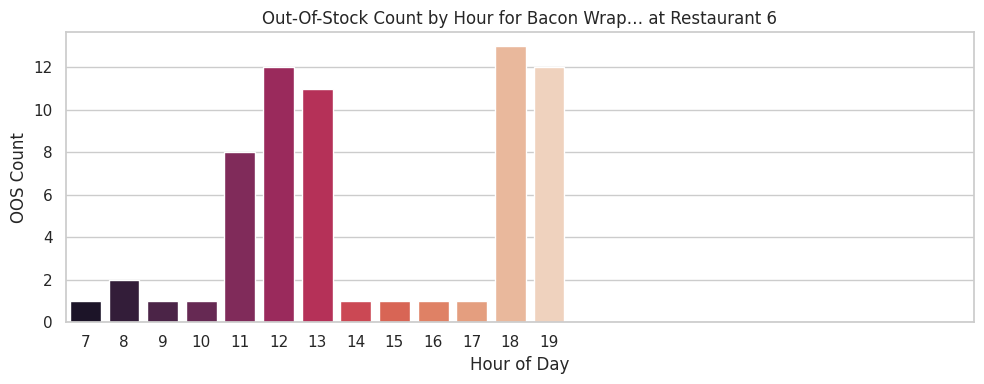

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


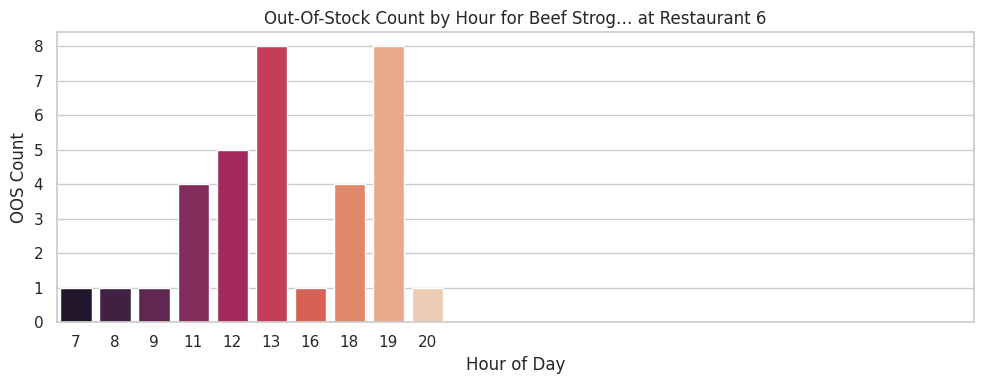

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


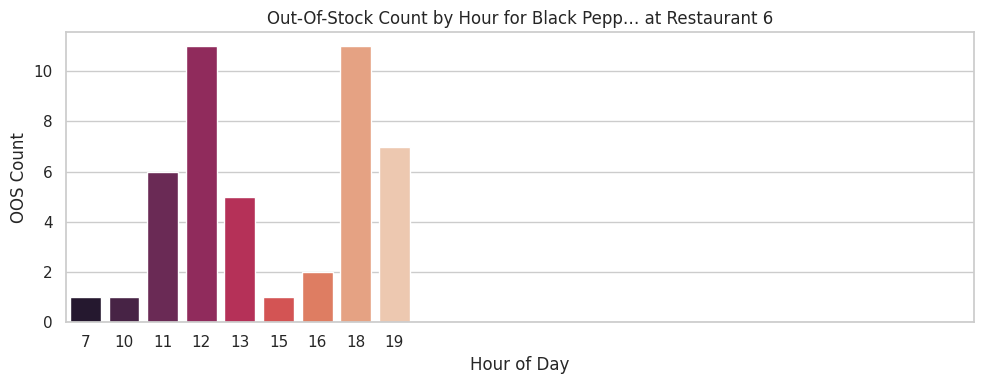

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


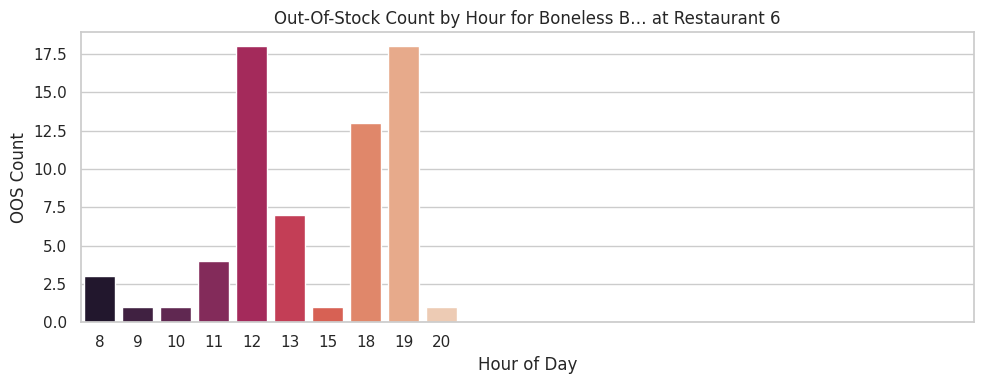

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


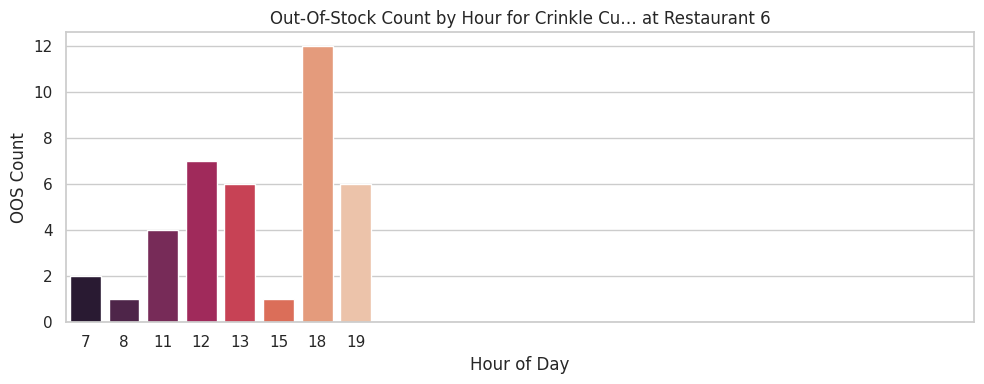

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


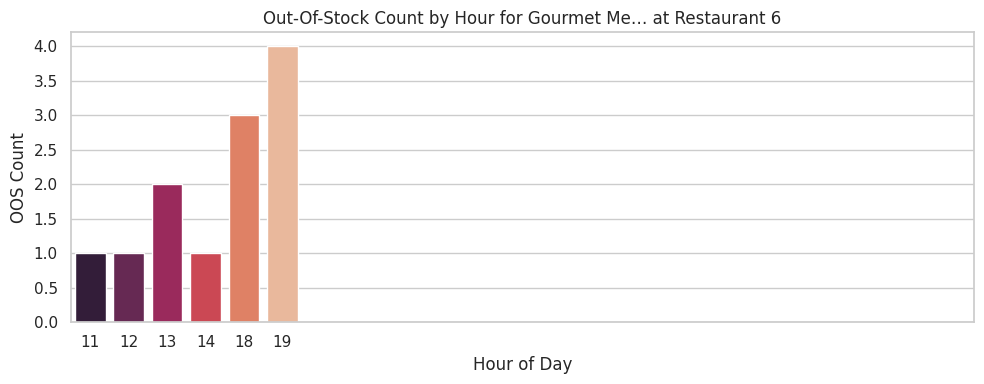

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


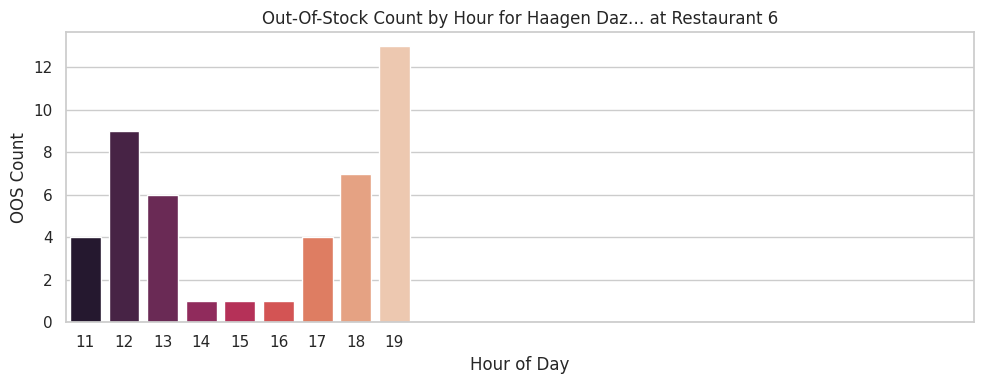

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


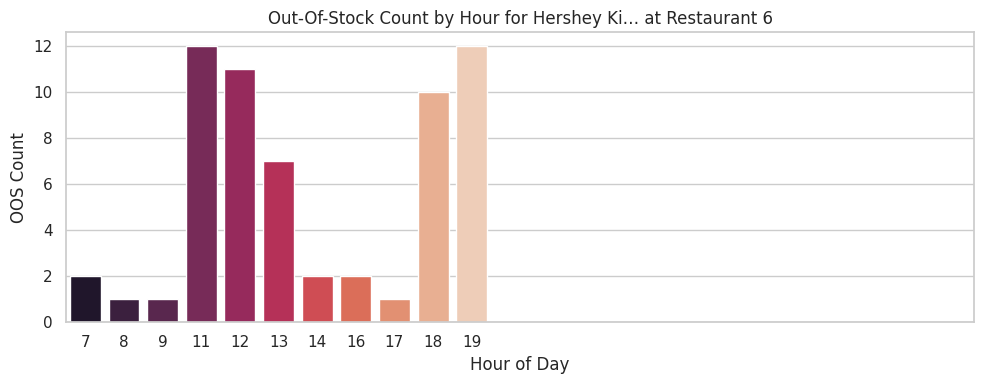

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


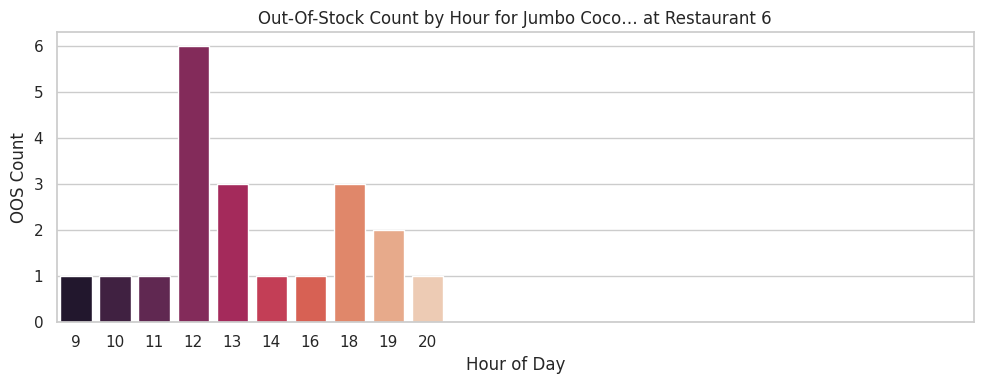

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


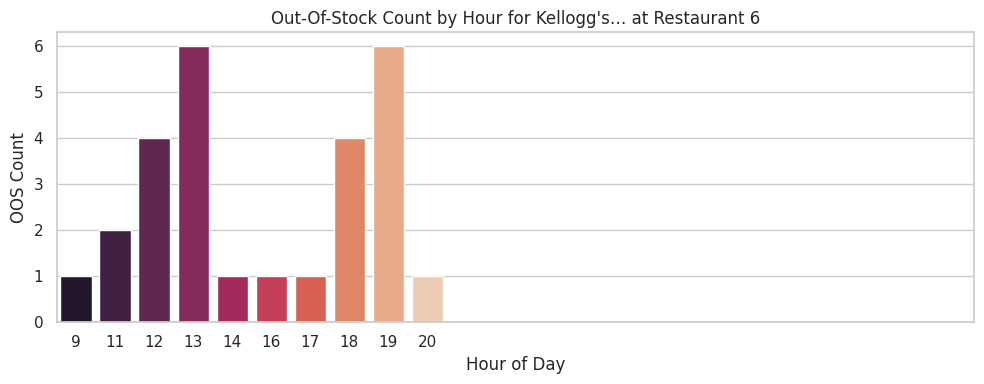

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


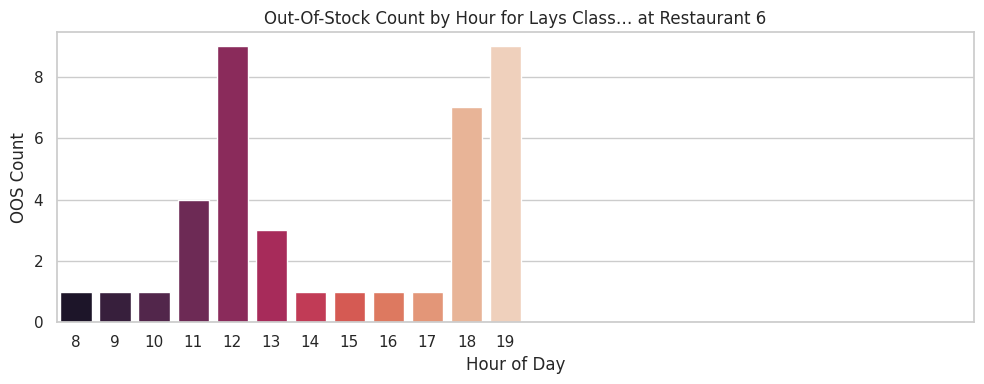

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


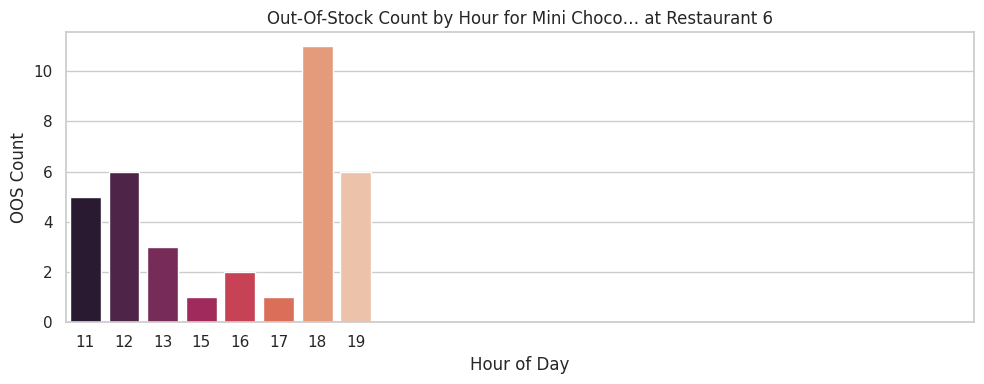

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


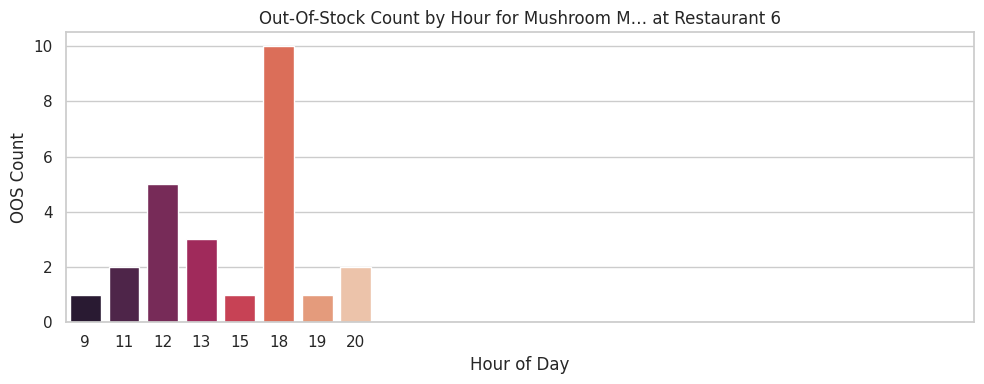

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


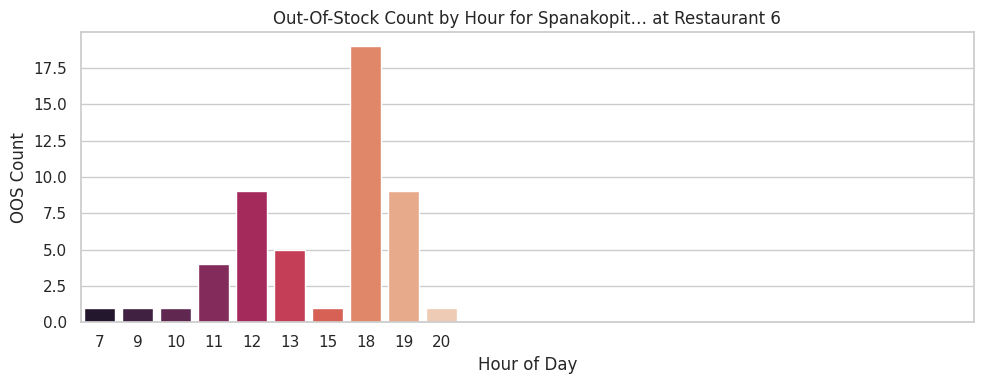

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


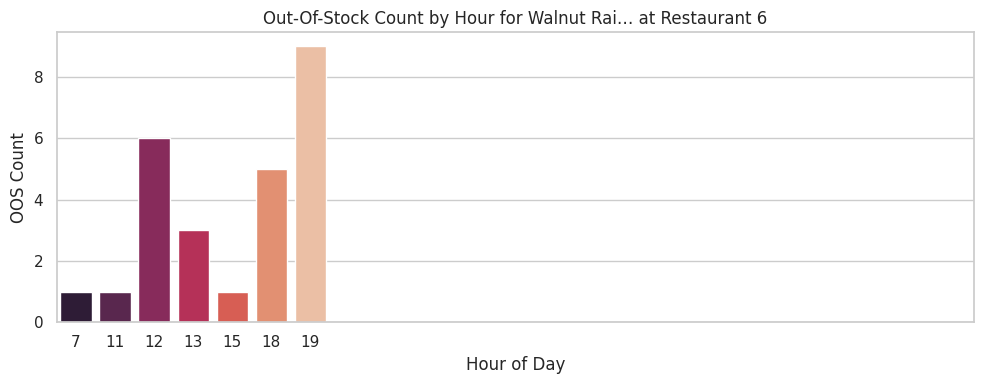

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


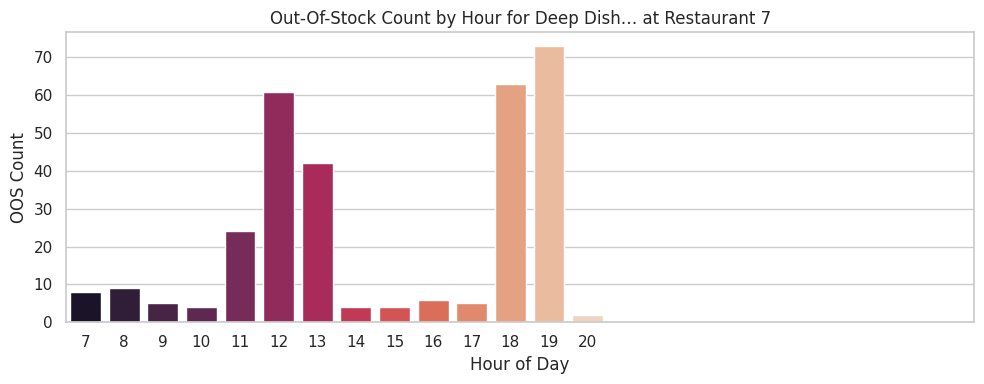

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


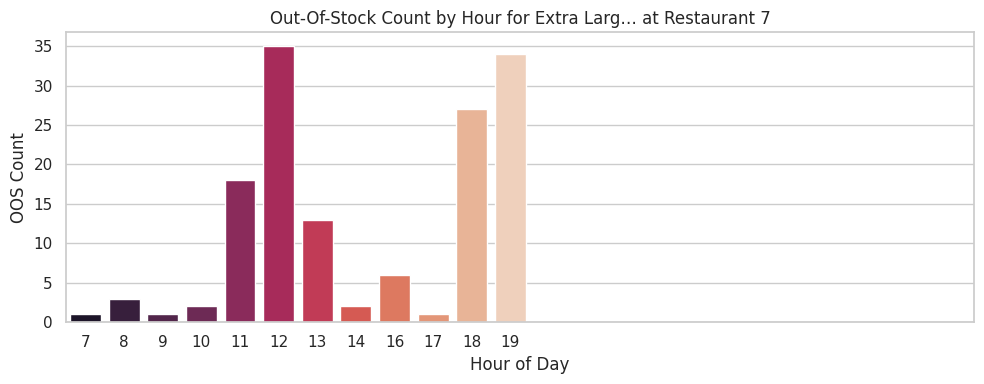

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


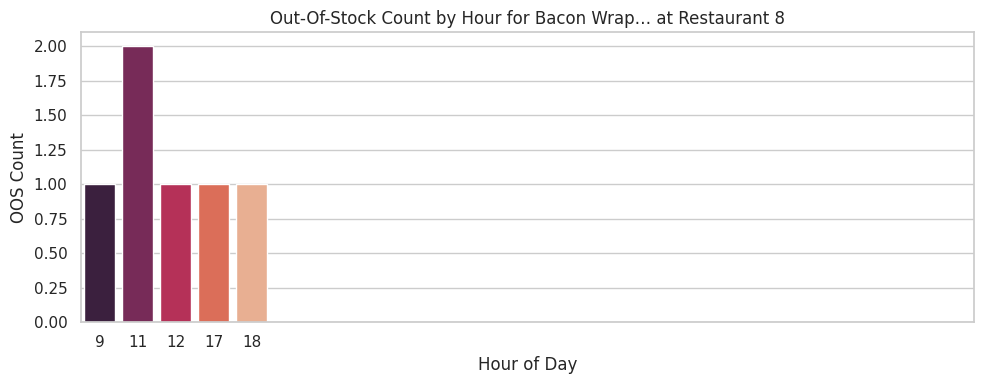

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


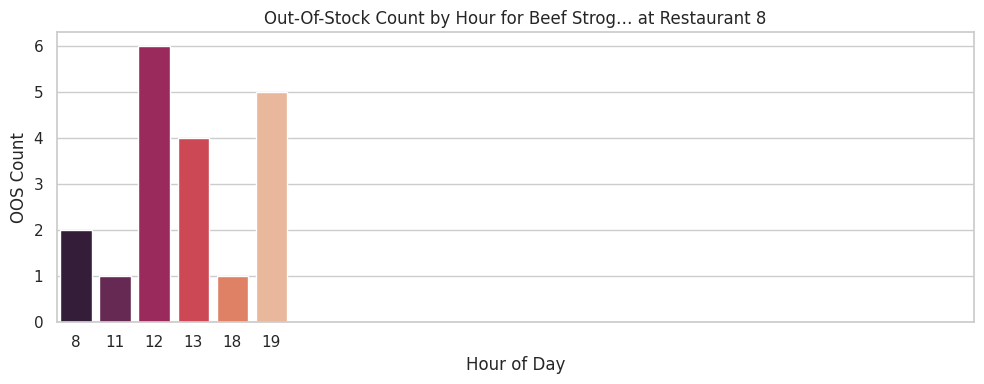

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


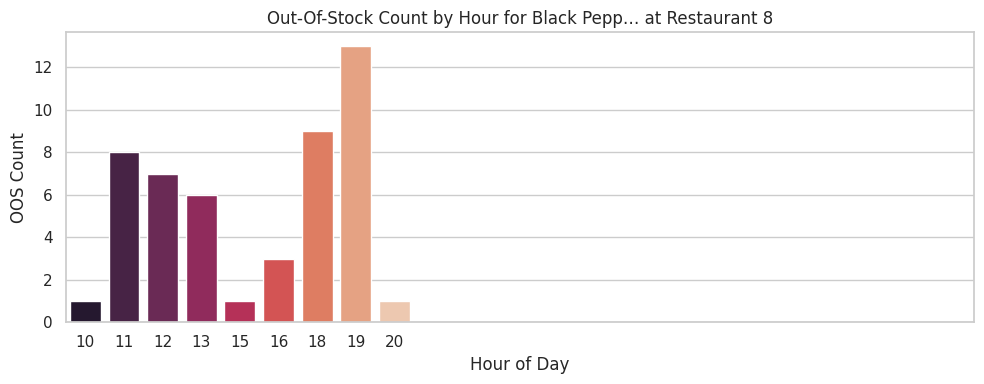

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


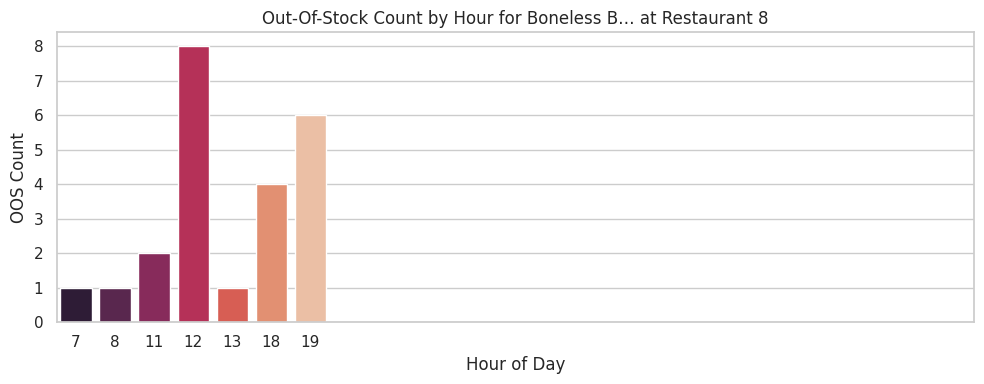

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


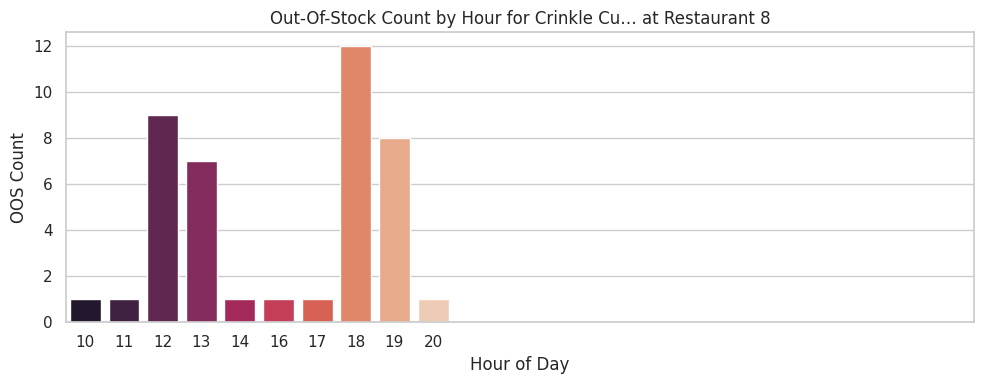

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


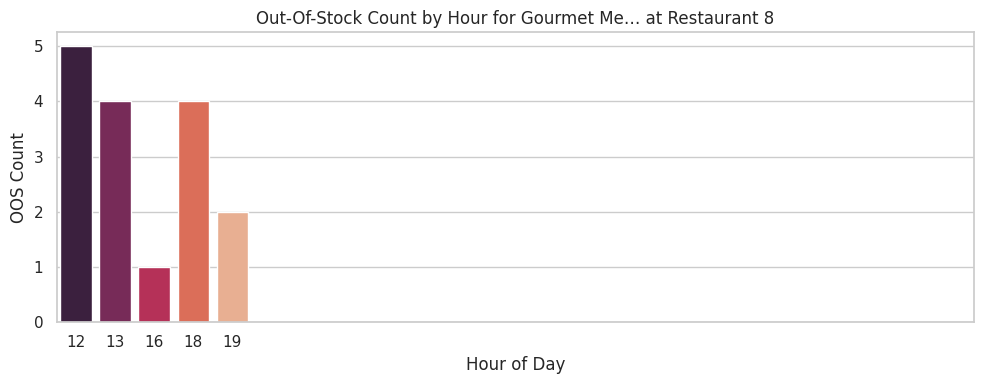

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


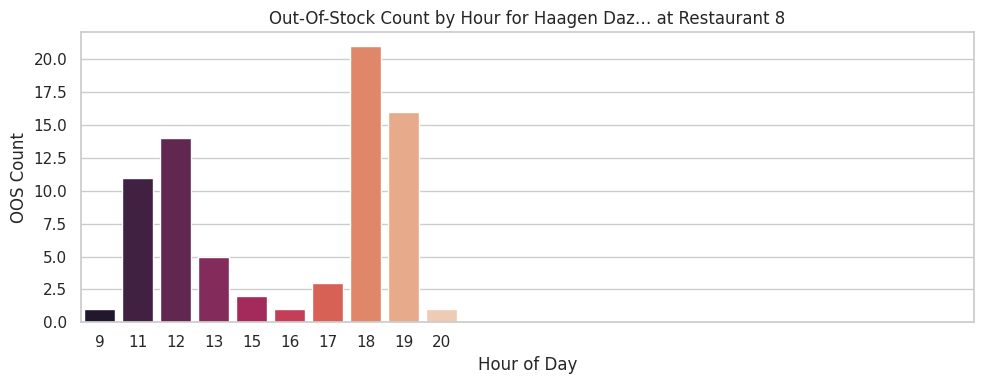

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


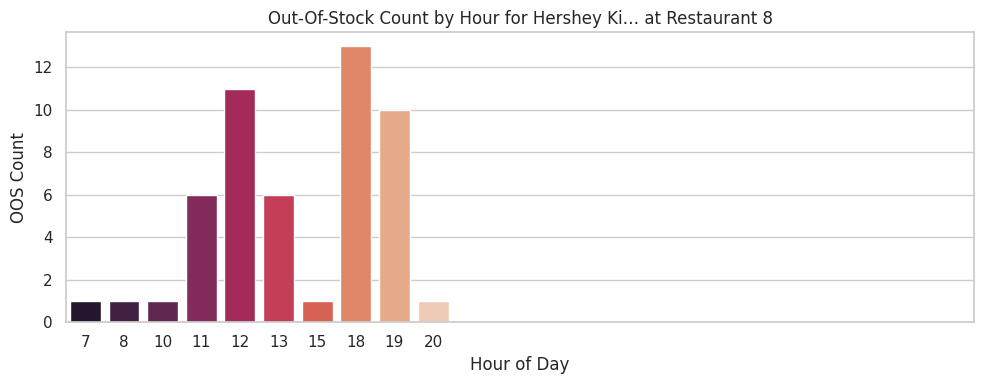

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


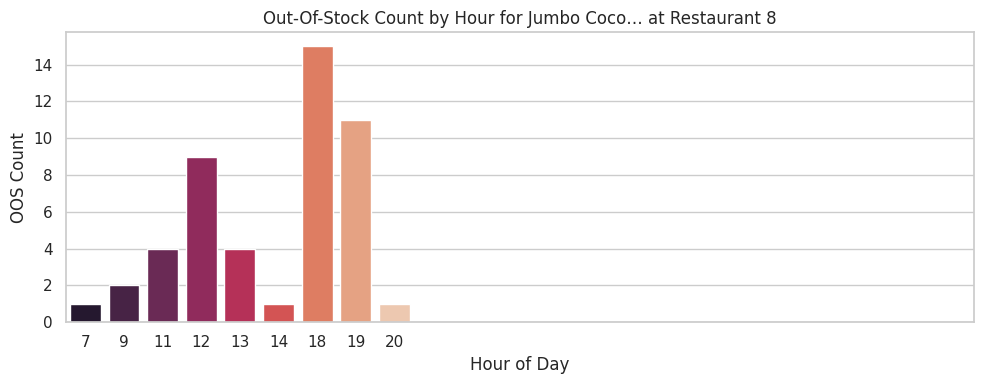

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


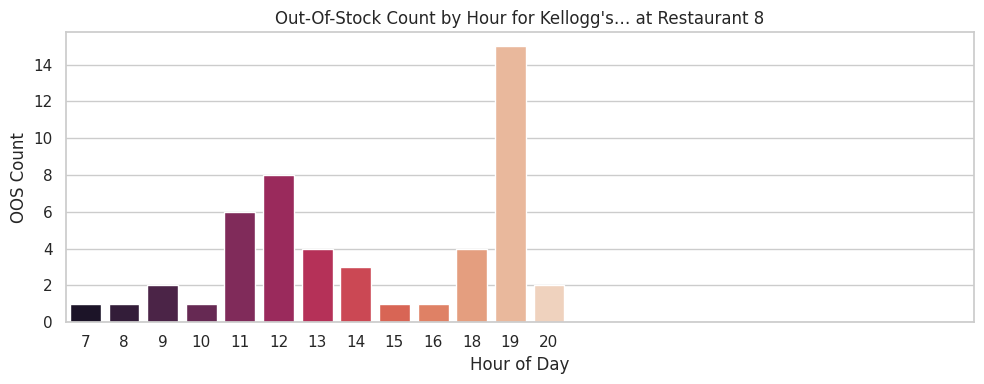

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


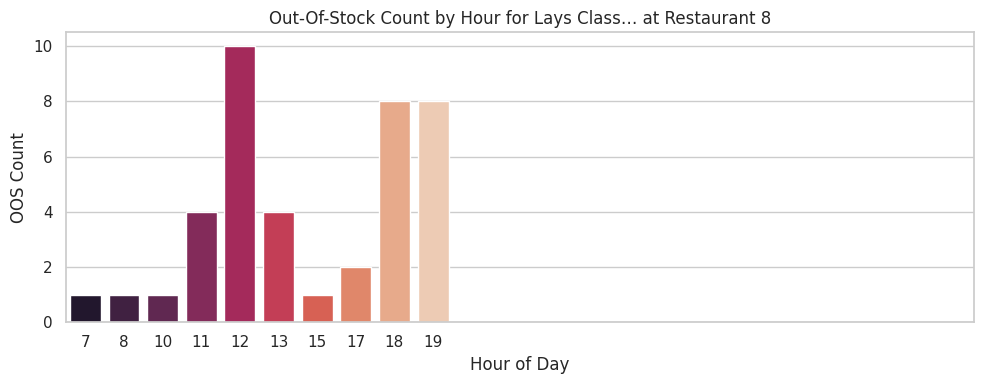

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


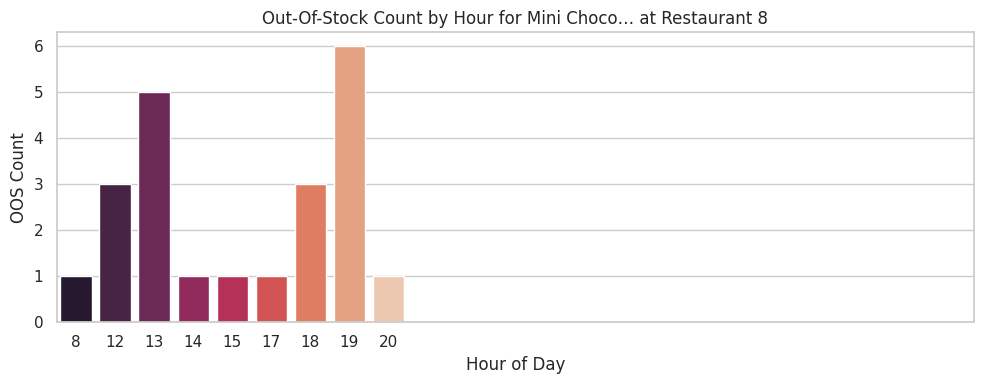

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


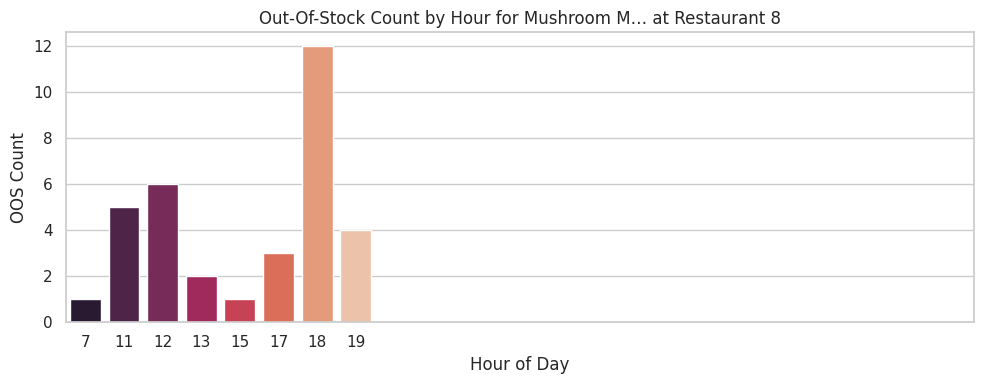

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


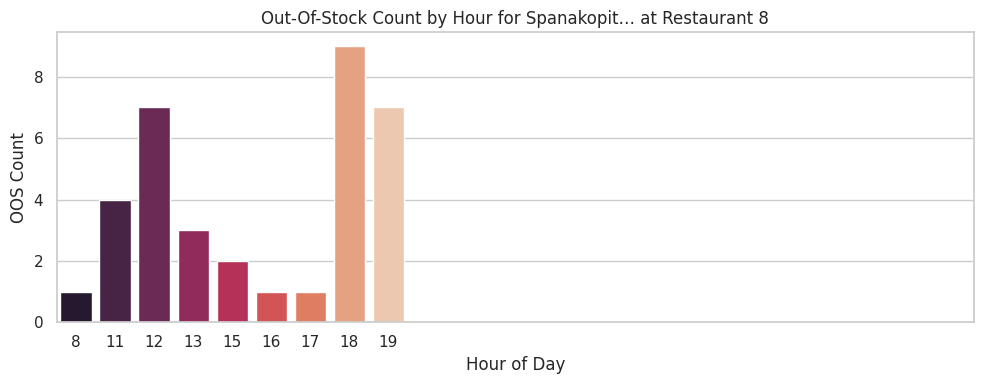

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


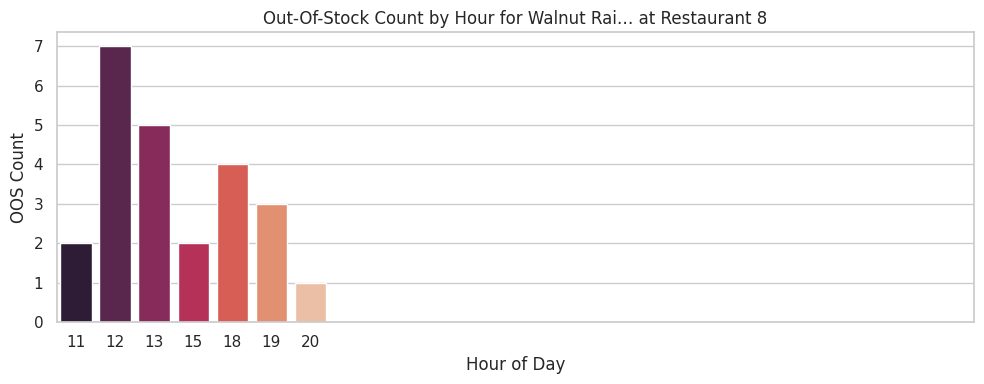

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


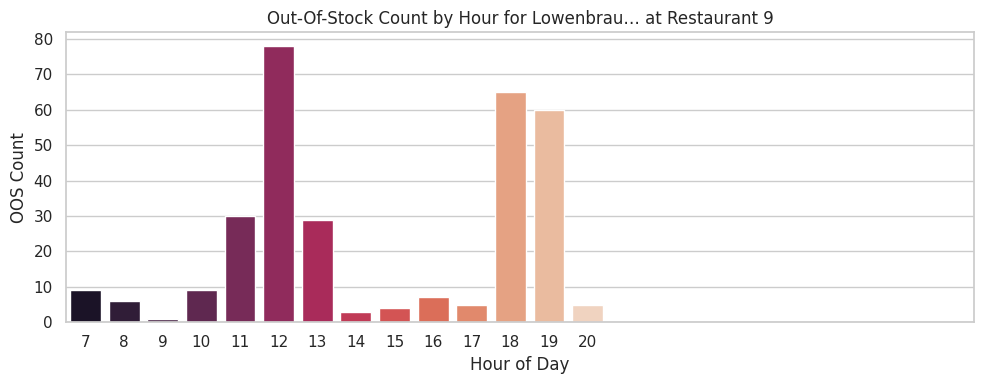

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


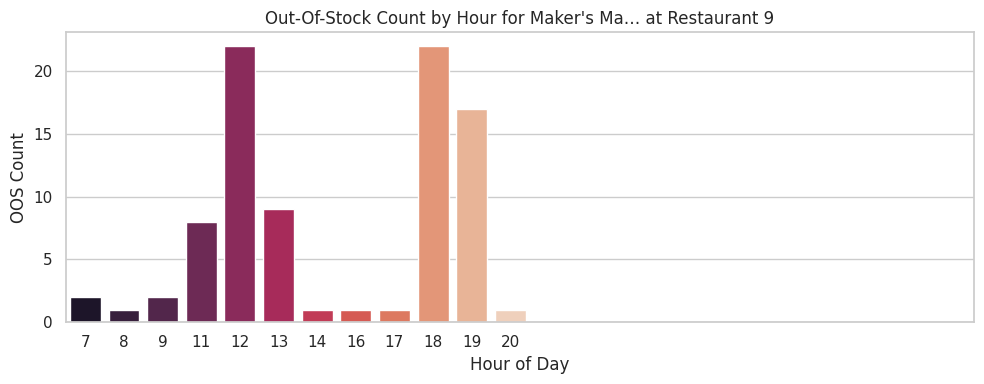

<ipython-input-51-2ce6f06e6b38>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


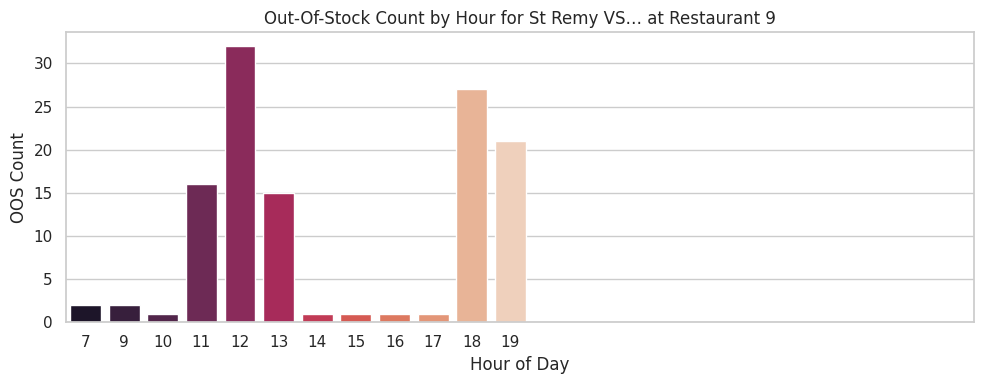

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assume df already exists and has the following columns:
# 'restaurant_alias', 'item_alias', 'hour', and 'scenario'

# 1. Filter the DataFrame to only include OUT_OF_STOCK events.
df_oos = df[df['scenario'] == 'OUT_OF_STOCK']

# 2. Group by restaurant_alias, item_alias, and hour, then count the number of OOS events.
oos_counts = (
    df_oos.groupby(['restaurant_alias', 'item_alias', 'hour'])
    .size()
    .rename('count')
    .reset_index()
)

# 3. Create a pivot table to get a tabular format of counts where rows are restaurant-item pairs and columns are hours.
oos_pivot = oos_counts.pivot_table(
    index=['restaurant_alias', 'item_alias'],
    columns='hour',
    values='count',
    fill_value=0
)

print("Hourly Out-Of-Stock counts for each Restaurant–Item pair:")
print(oos_pivot)

# 4. Optionally, plot the hourly counts for each restaurant–item pair.
# WARNING: If there are many pairs, plotting every pair in a loop may result in many figures.
unique_pairs = oos_counts[['restaurant_alias', 'item_alias']].drop_duplicates()

for idx, pair in unique_pairs.iterrows():
    restaurant = pair['restaurant_alias']
    item = pair['item_alias']
    pair_data = oos_counts[
        (oos_counts['restaurant_alias'] == restaurant) &
        (oos_counts['item_alias'] == item)
    ]

    plt.figure(figsize=(10, 4))
    sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")
    plt.xticks(range(0, 24))  # display all hours from 0 to 23
    plt.title(f'Out-Of-Stock Count by Hour for {item} at {restaurant}')
    plt.xlabel('Hour of Day')
    plt.ylabel('OOS Count')
    plt.tight_layout()
    plt.show()

Total first OOS transitions: 650
First OOS counts aggregated by hour:
  restaurant_alias   item_alias  hour  count
0     Restaurant 1   Lowenbrau…     7      3
1     Restaurant 1   Lowenbrau…     8      2
2     Restaurant 1   Lowenbrau…     9      1
3     Restaurant 1   Lowenbrau…    10      2
4     Restaurant 1  Maker's Ma…     7      1

Pivot table of first OOS counts (rows: restaurant, item; columns: hour):
hour                           7    8    9    10   11   12   13   14   15  \
restaurant_alias item_alias                                                 
Restaurant 1     Lowenbrau…   3.0  2.0  1.0  2.0  0.0  0.0  0.0  0.0  0.0   
                 Maker's Ma…  1.0  1.0  1.0  0.0  3.0  0.0  0.0  0.0  0.0   
                 St Remy VS…  2.0  0.0  2.0  2.0  3.0  0.0  0.0  0.0  0.0   
Restaurant 10    Bacon Wrap…  0.0  0.0  0.0  0.0  5.0  1.0  1.0  1.0  0.0   
                 Beef Strog…  0.0  0.0  1.0  0.0  3.0  3.0  1.0  0.0  0.0   
...                           ...  ...  ...  ..

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


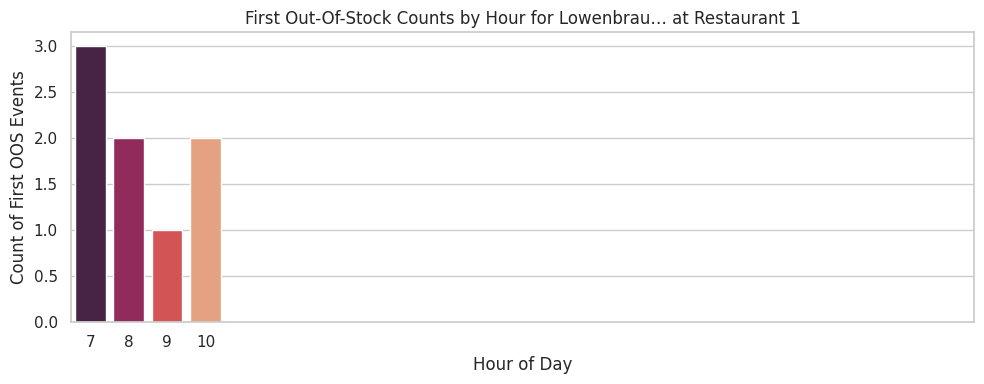

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


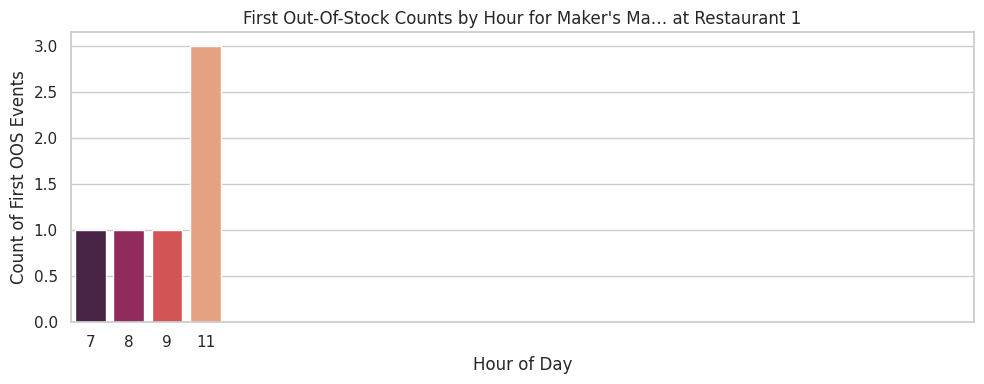

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


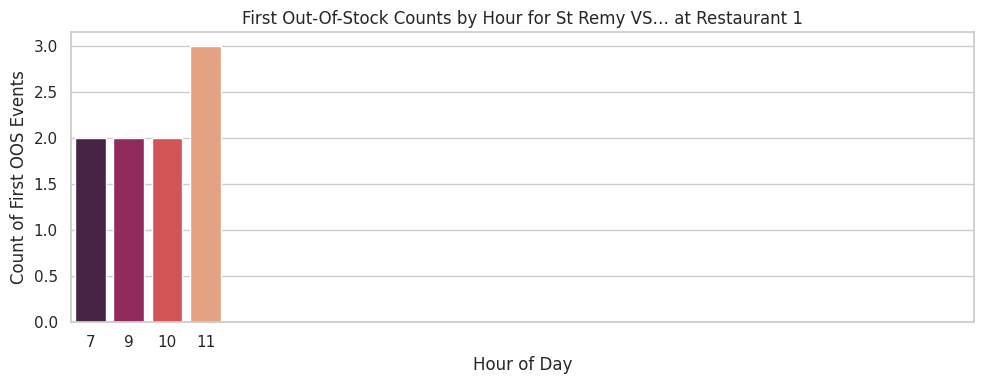

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


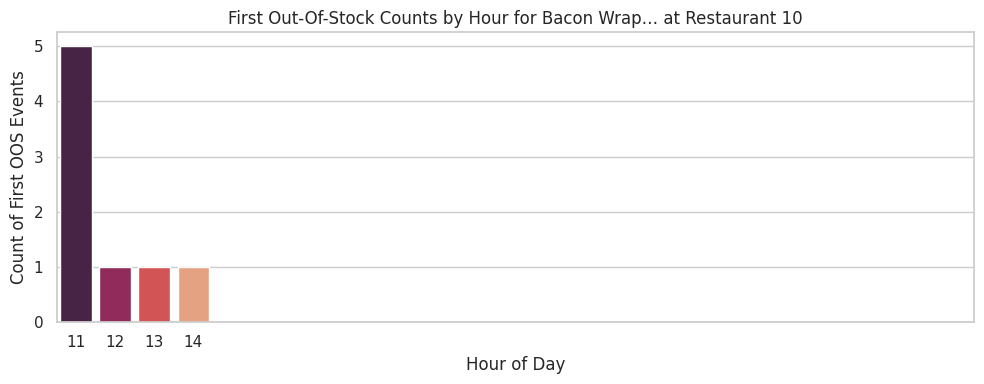

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


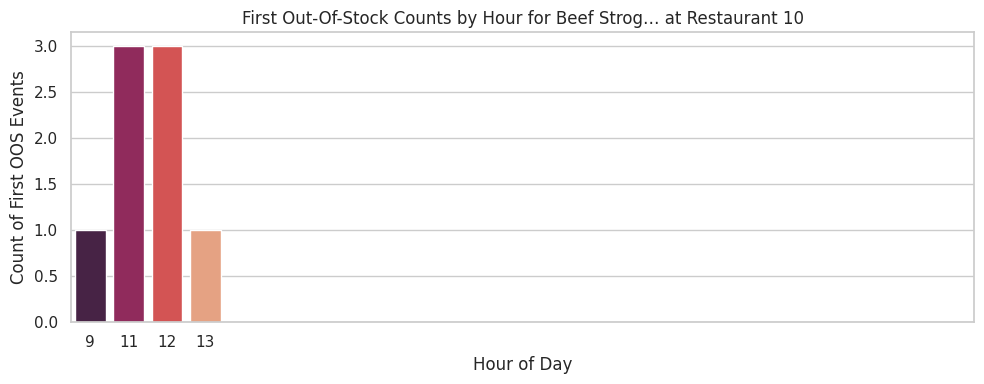

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


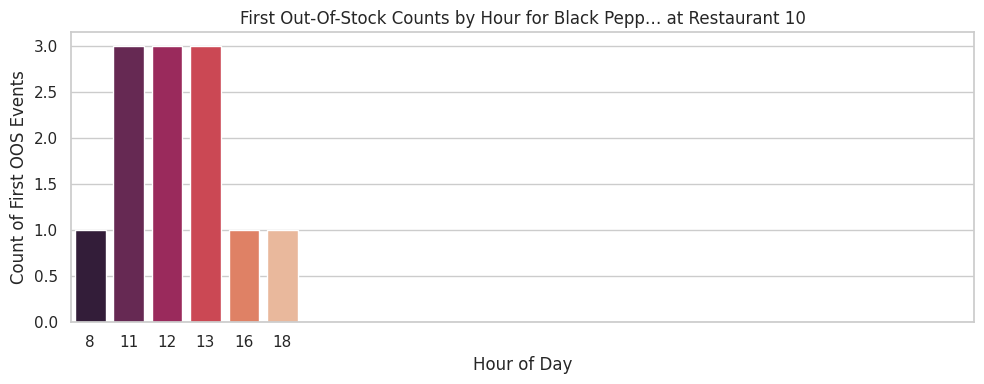

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


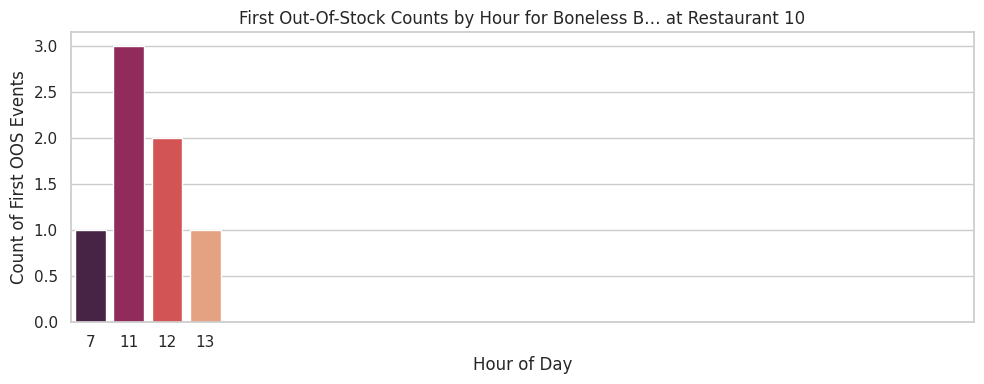

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


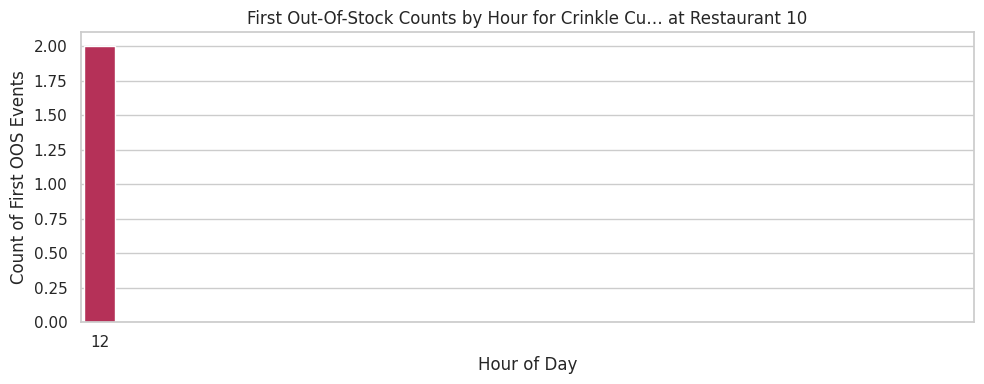

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


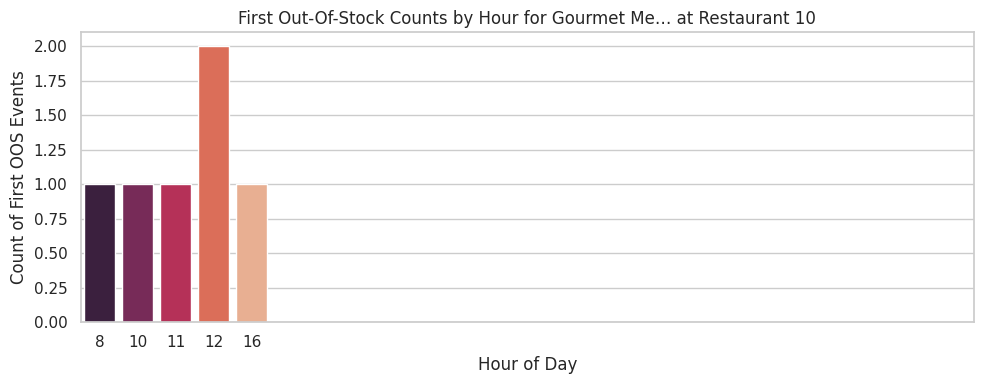

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


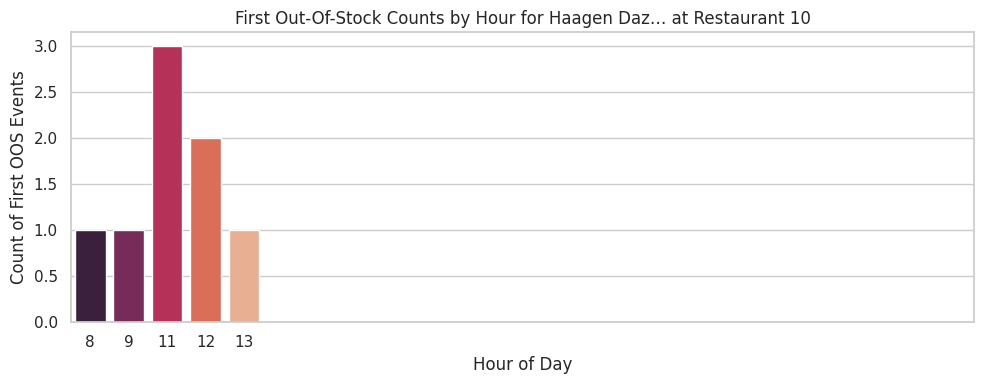

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


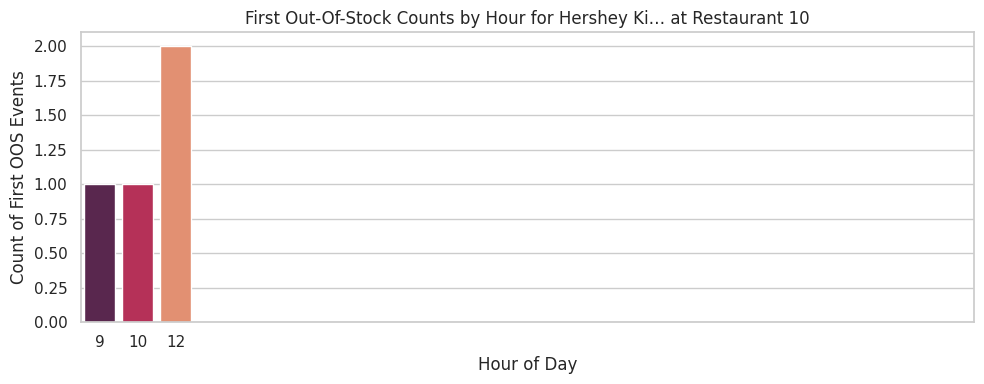

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


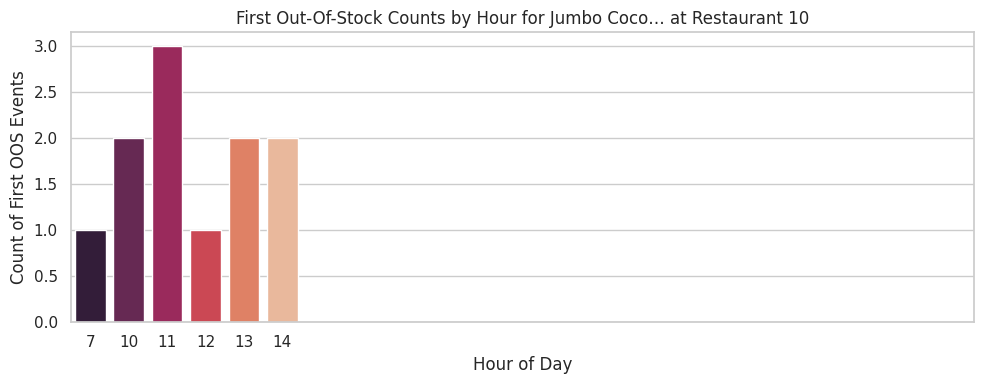

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


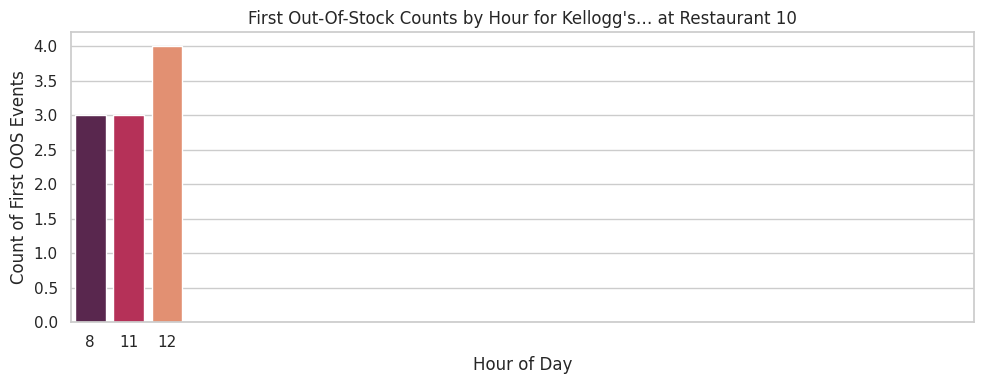

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


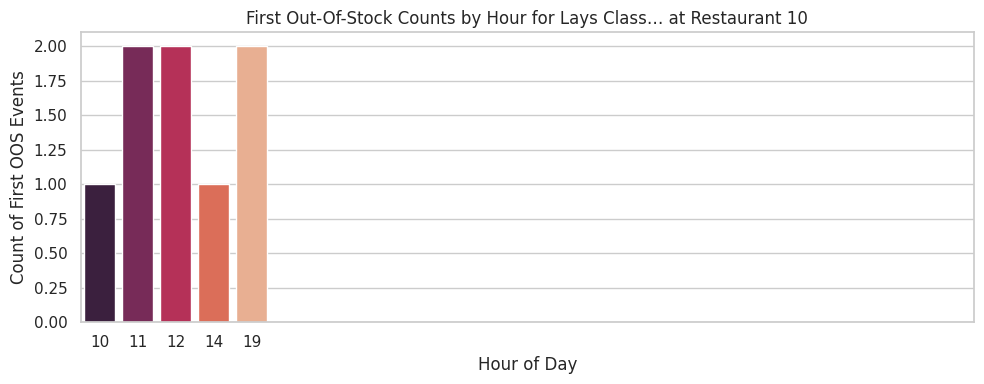

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


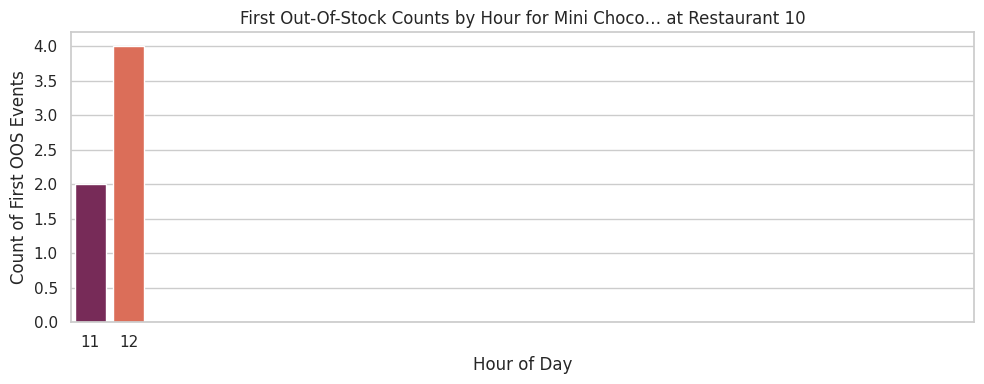

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


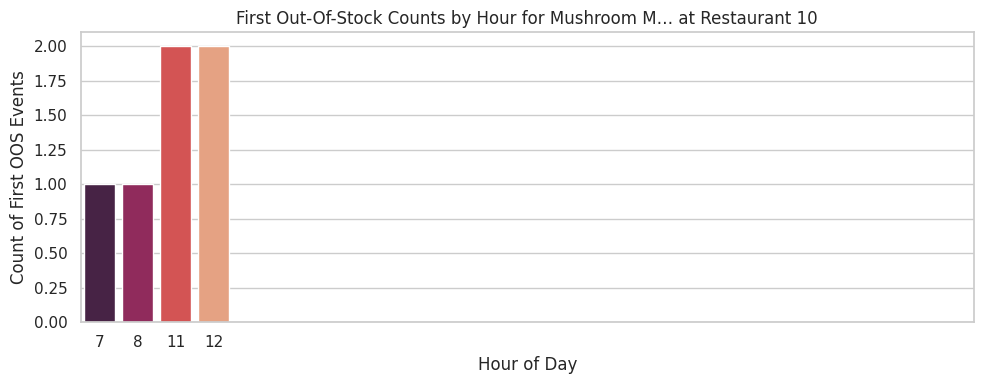

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


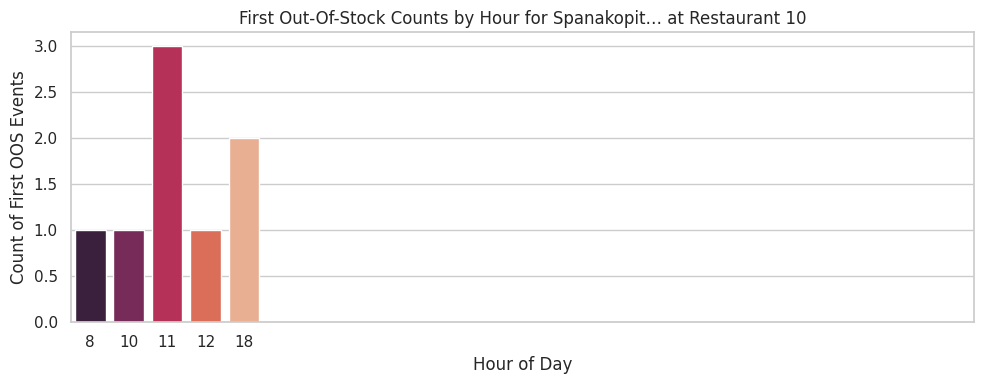

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


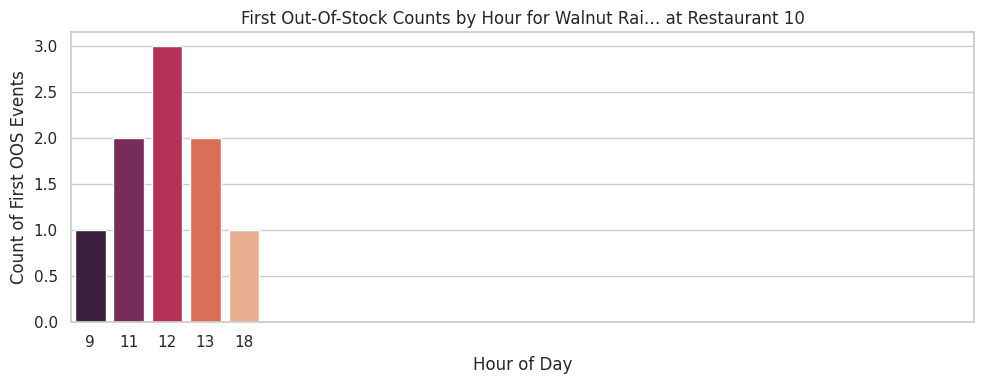

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


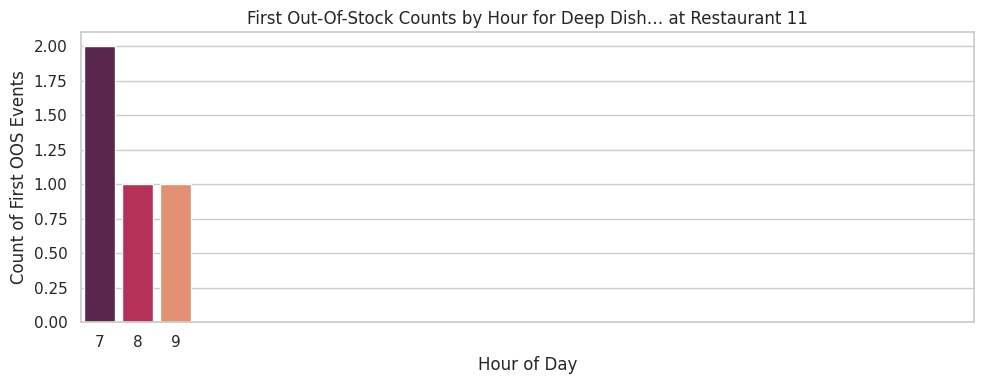

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


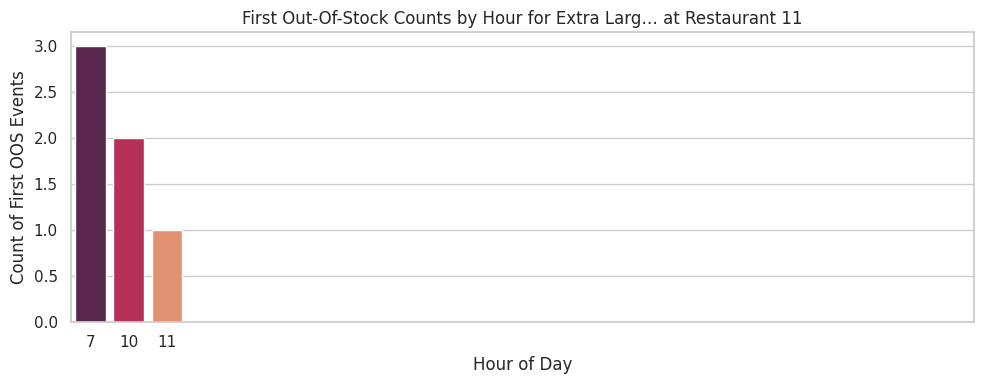

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


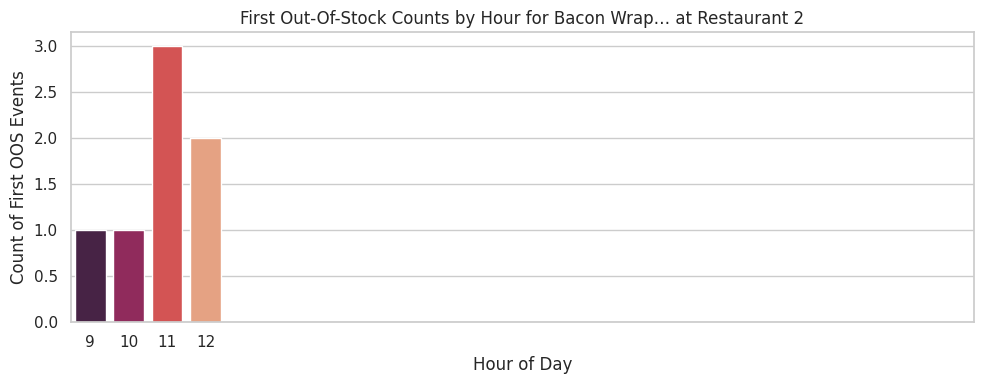

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


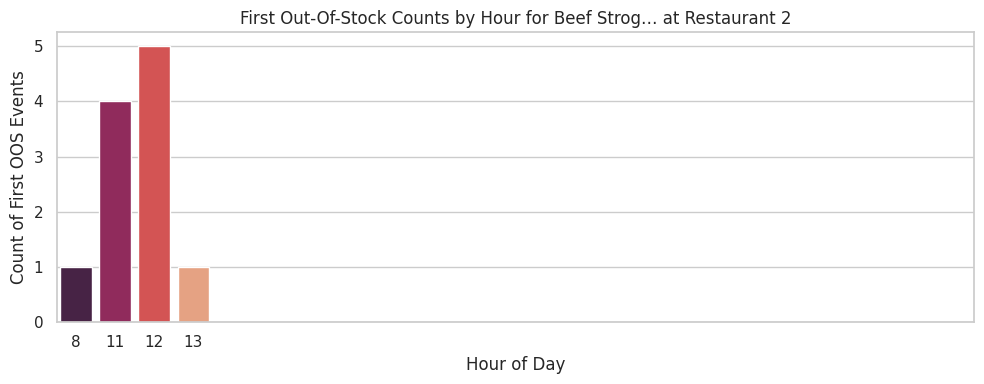

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


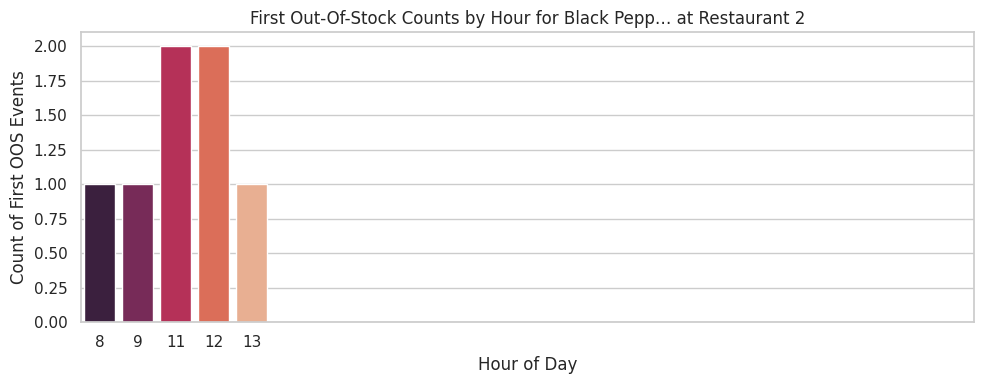

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


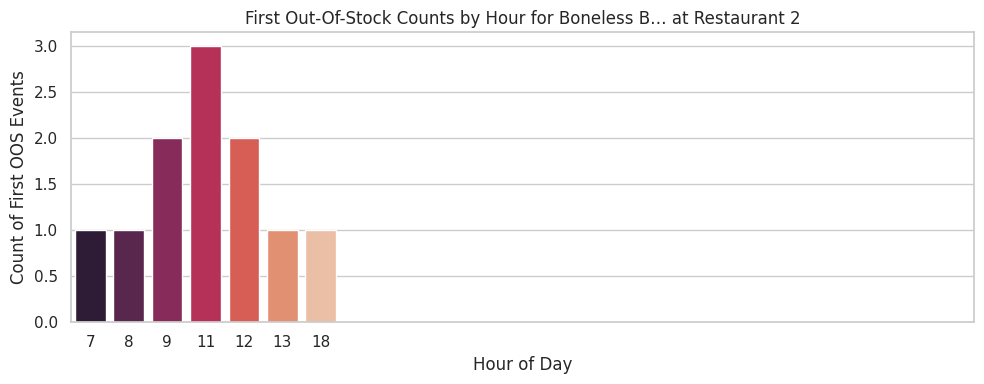

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


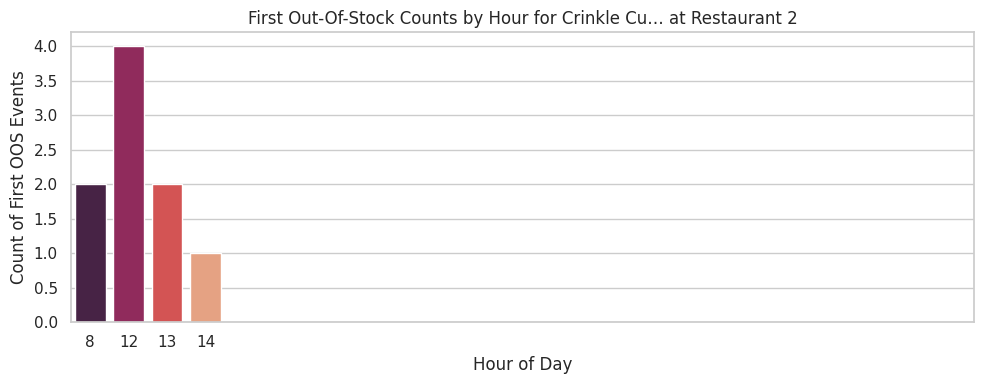

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


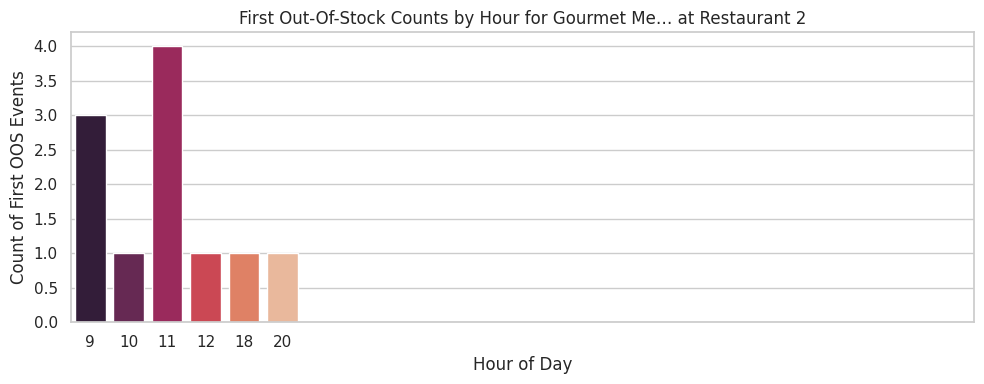

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


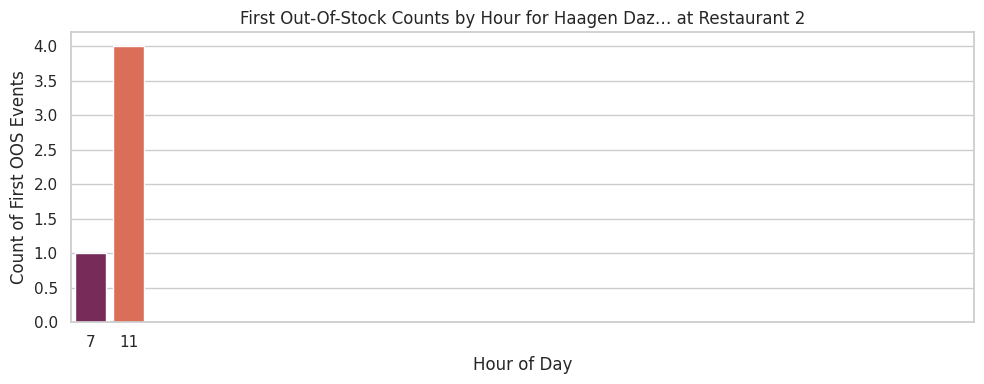

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


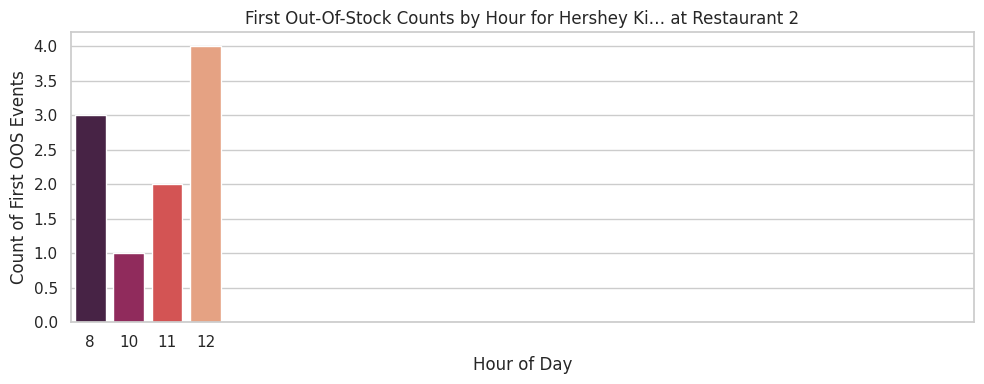

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


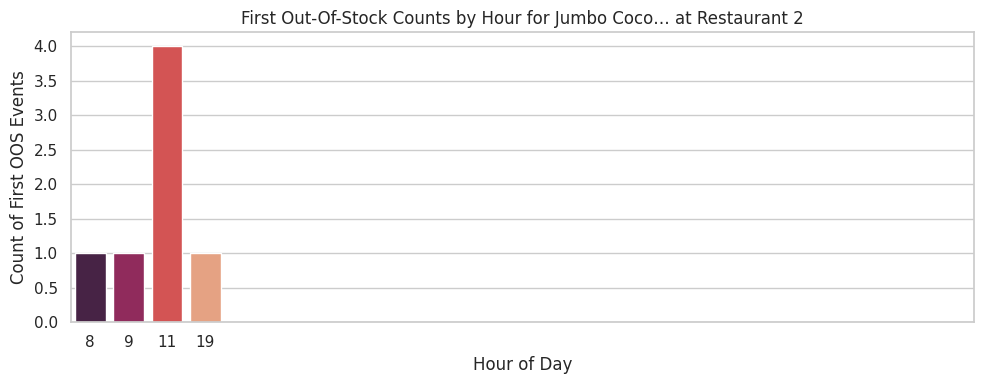

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


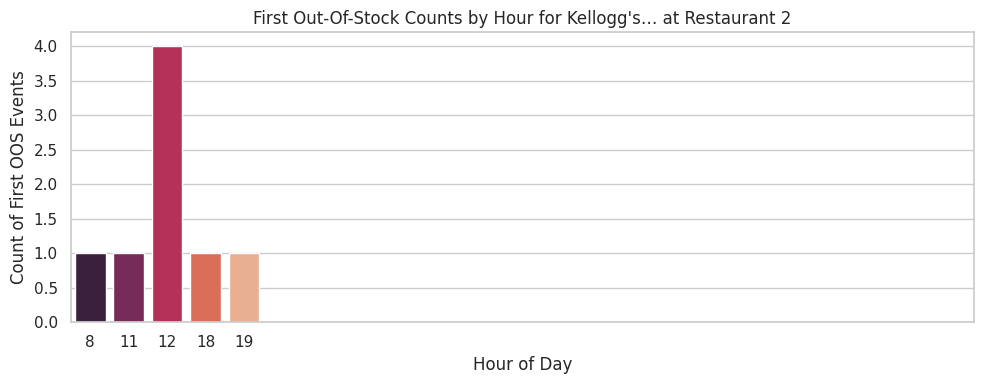

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


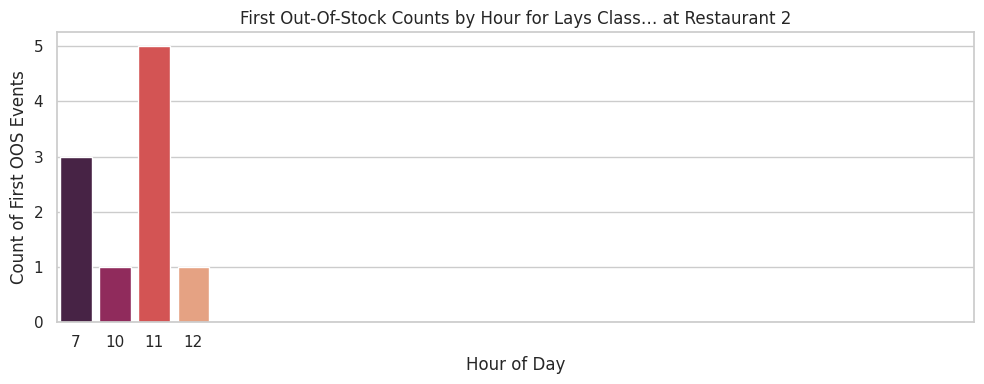

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


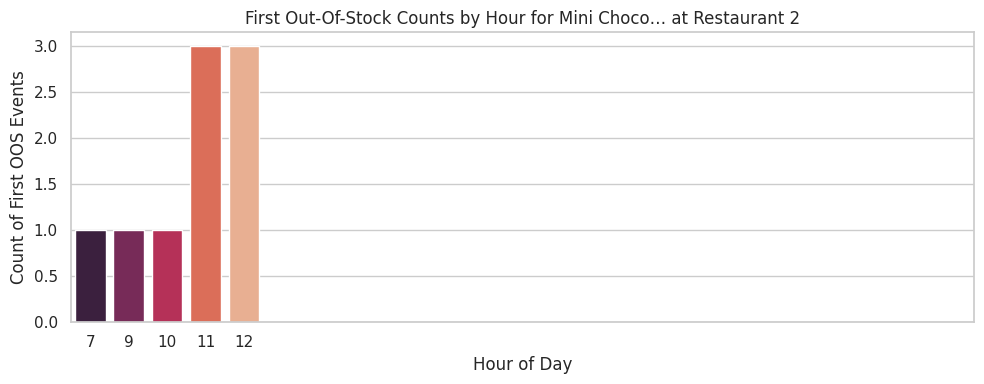

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


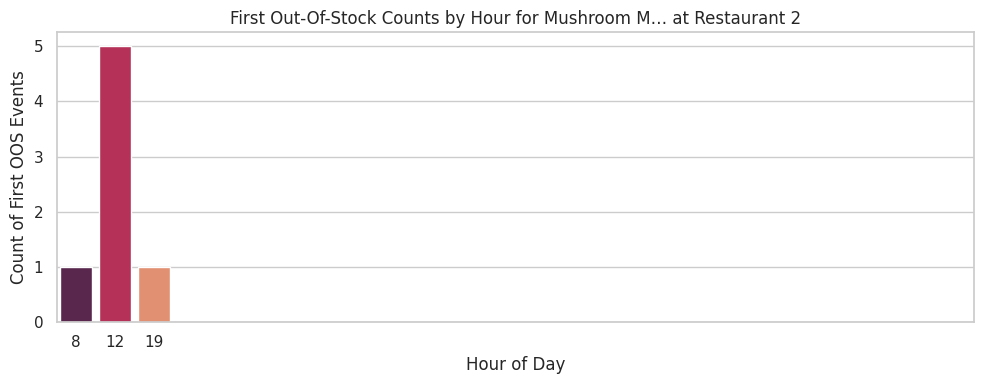

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


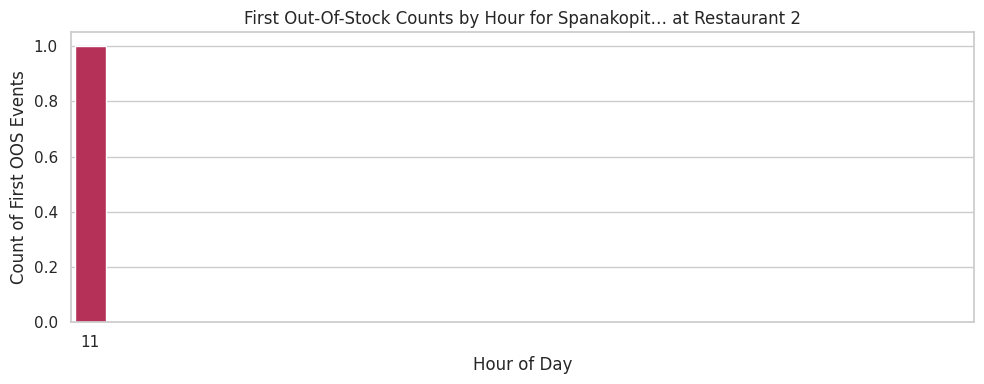

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


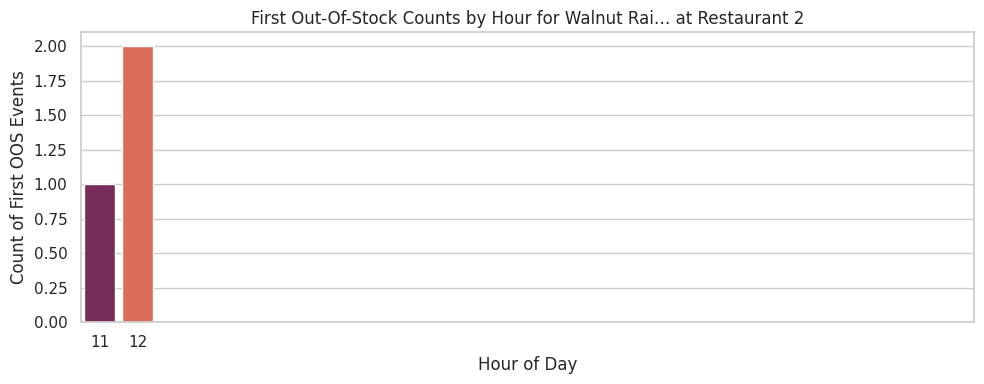

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


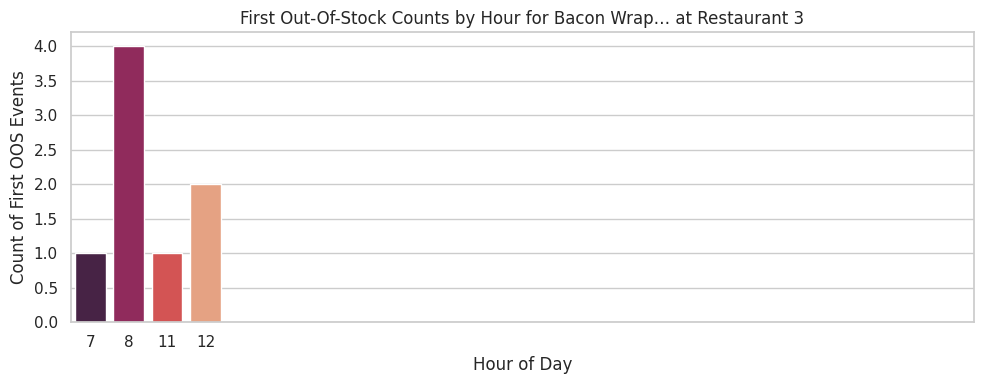

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


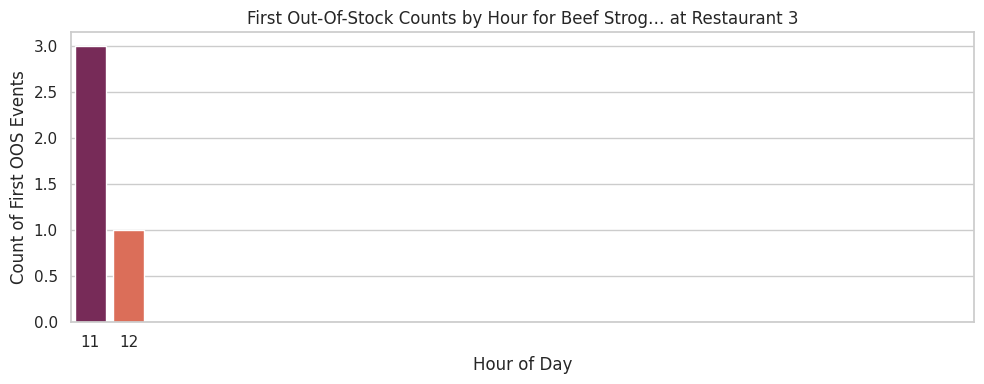

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


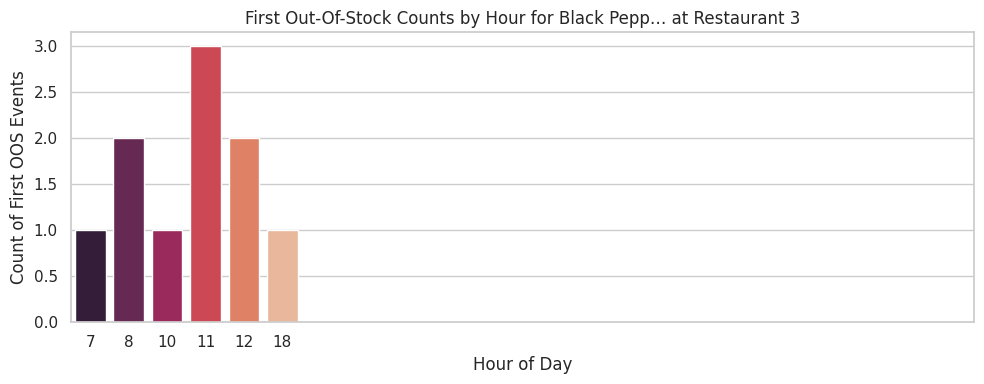

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


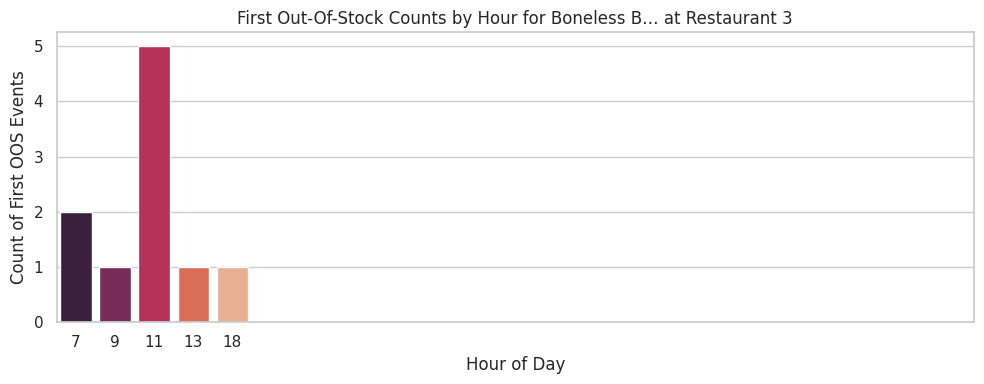

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


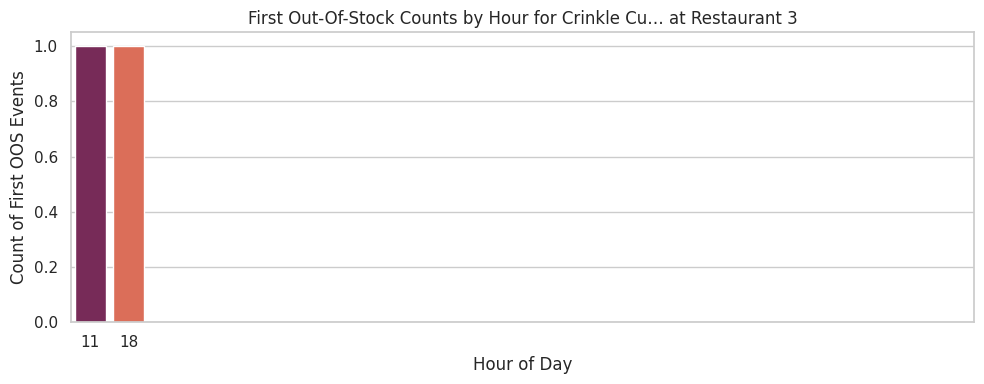

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


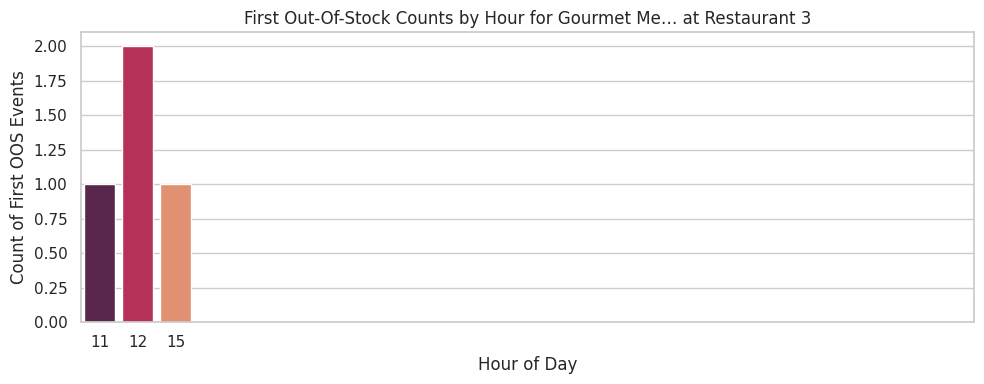

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


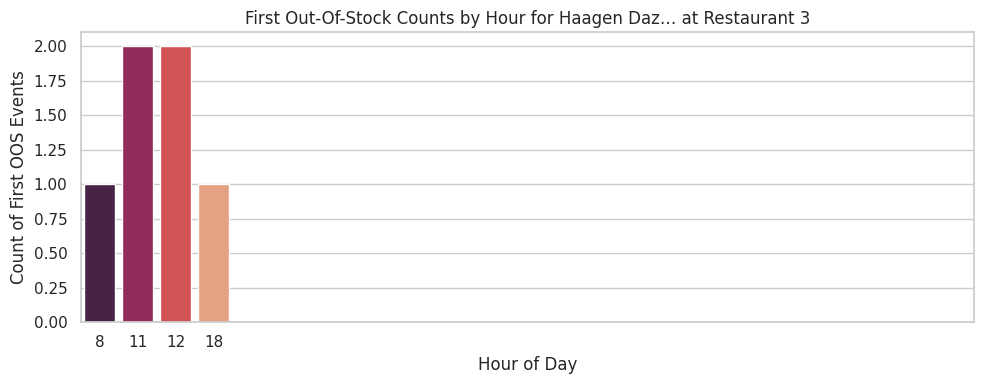

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


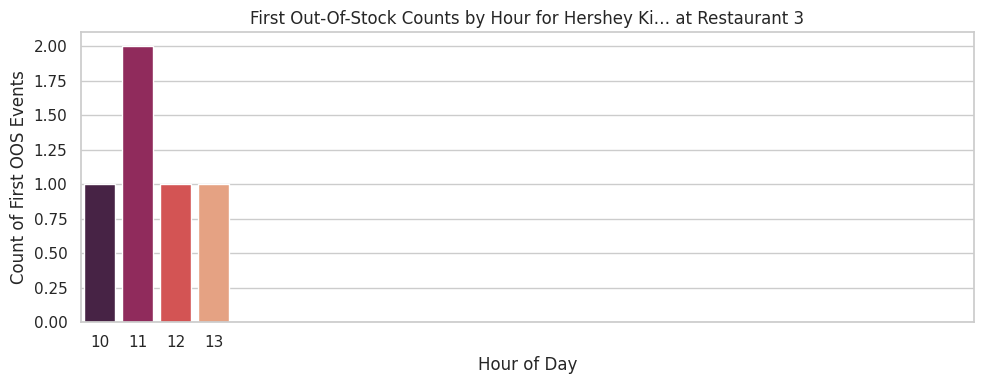

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


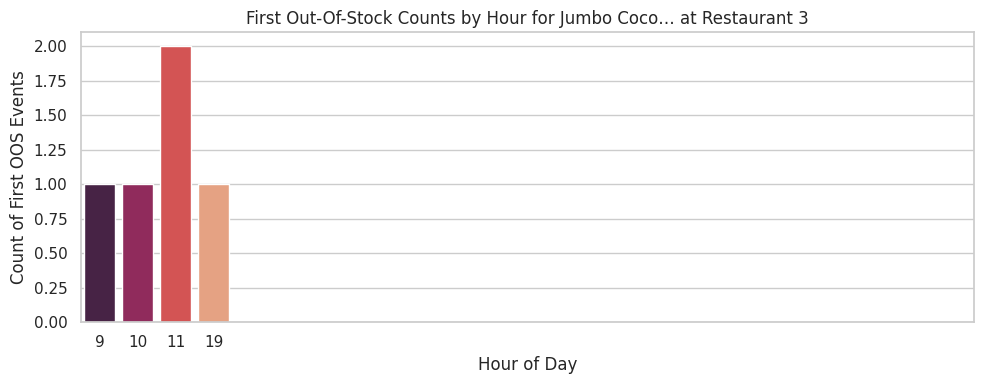

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


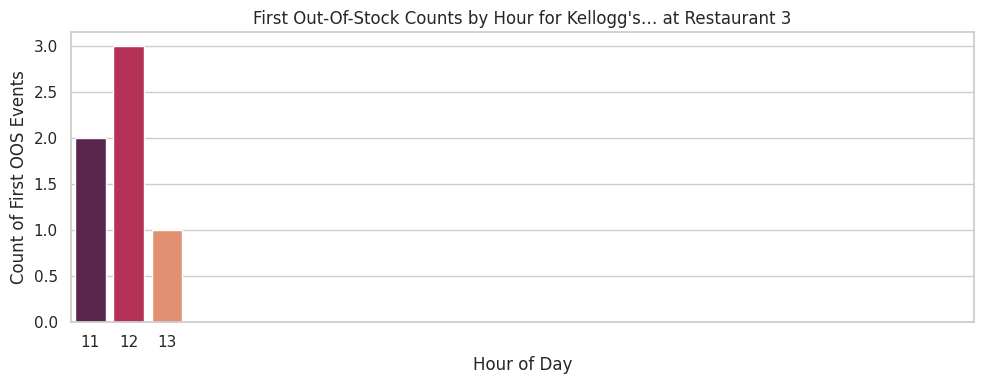

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


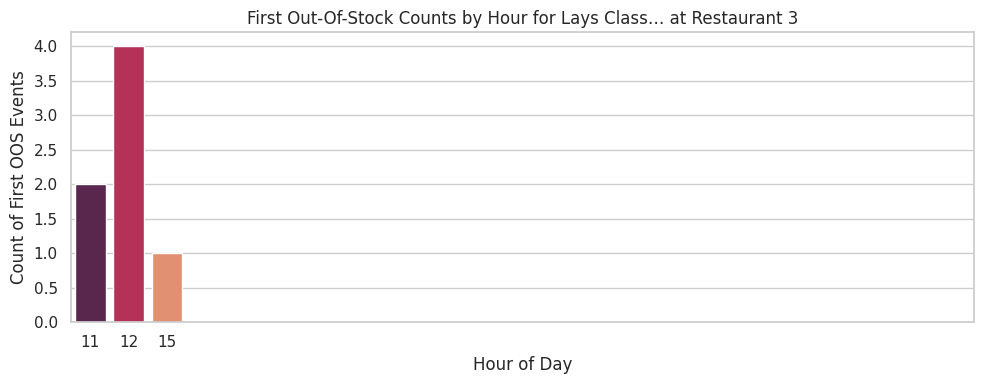

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


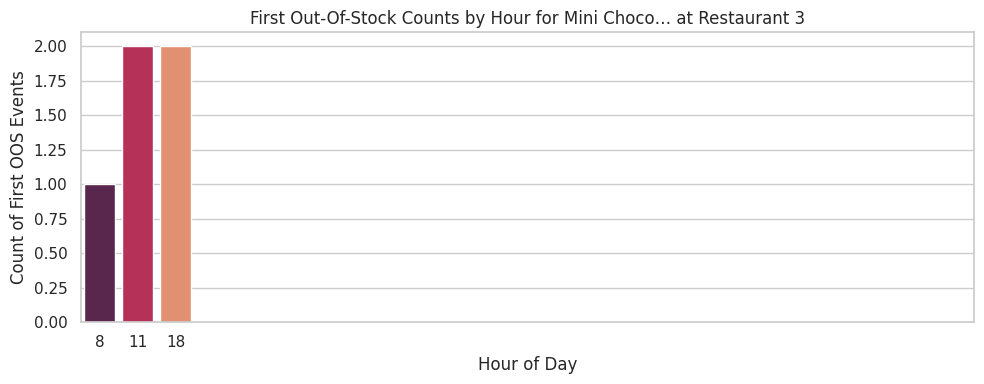

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


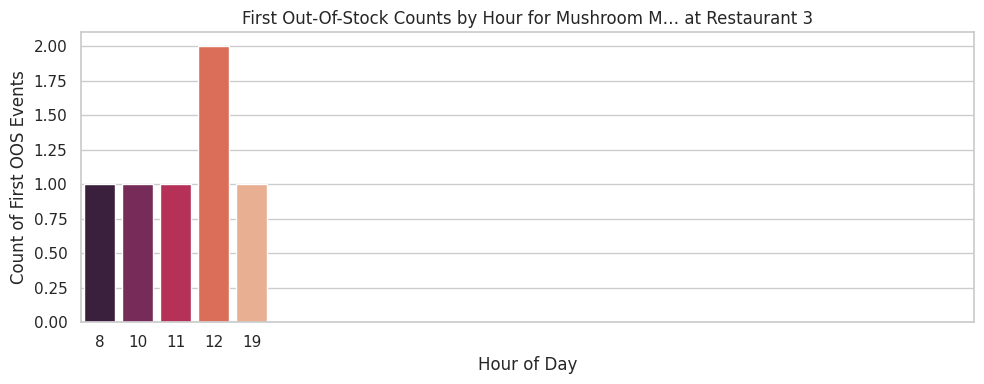

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


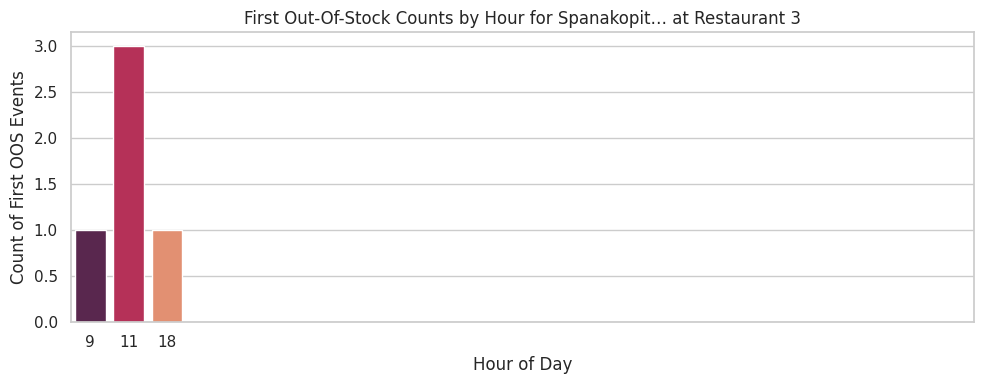

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


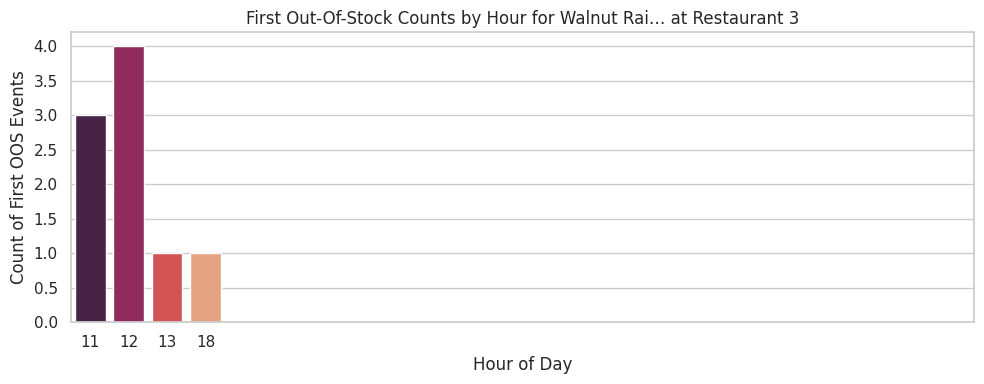

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


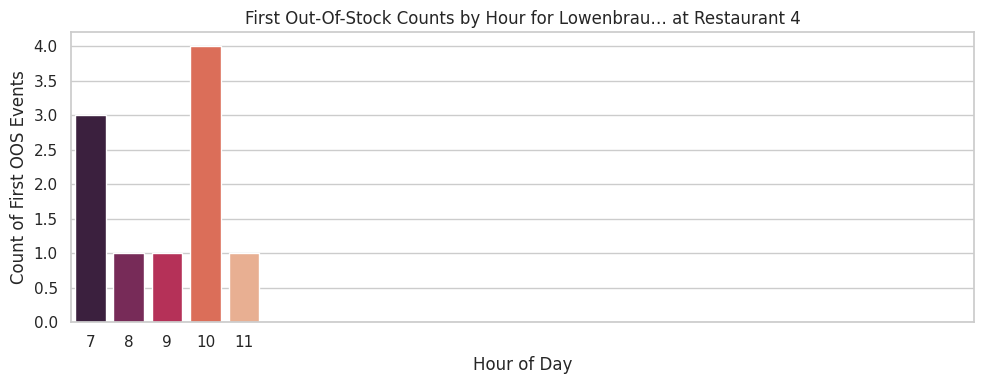

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


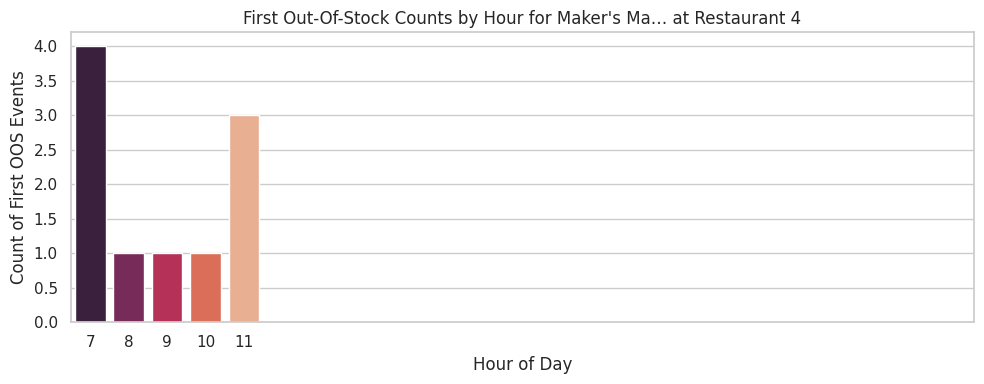

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


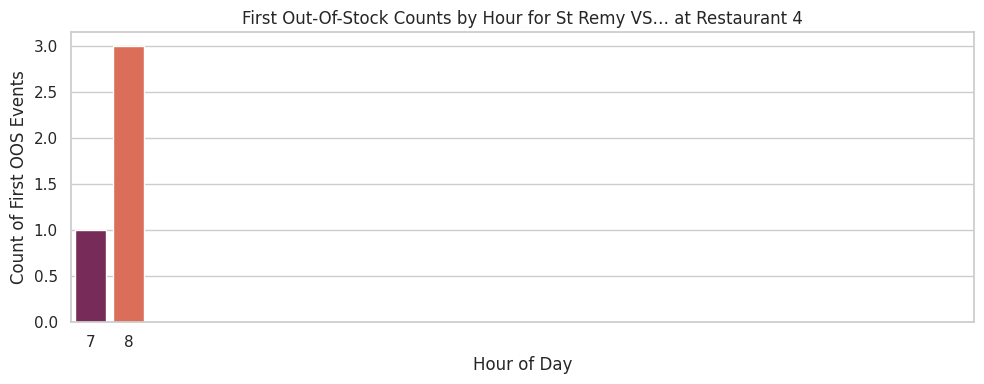

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


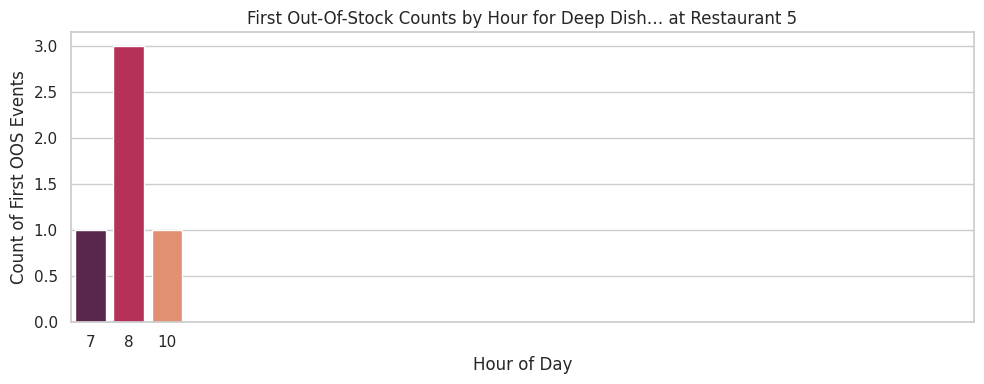

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


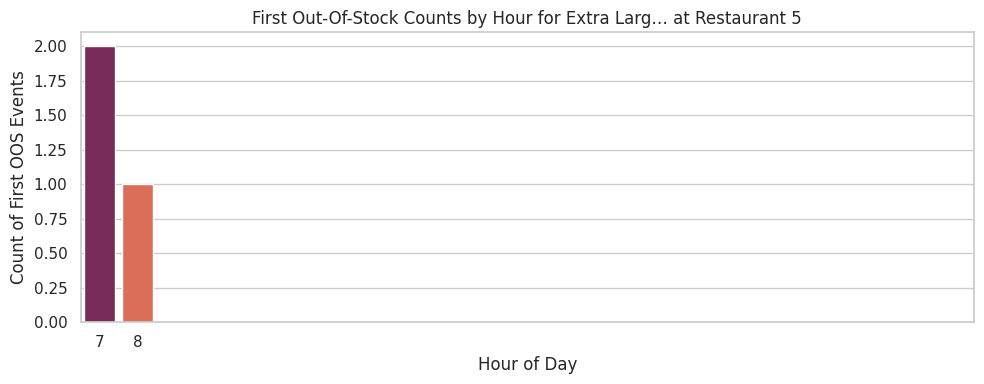

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


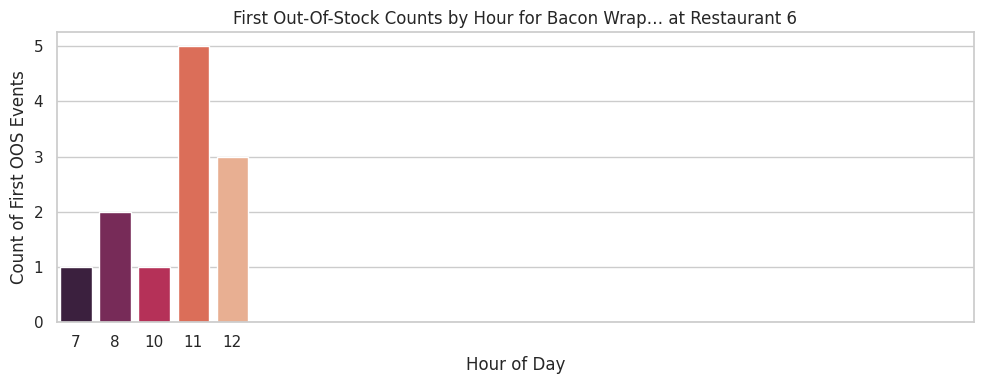

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


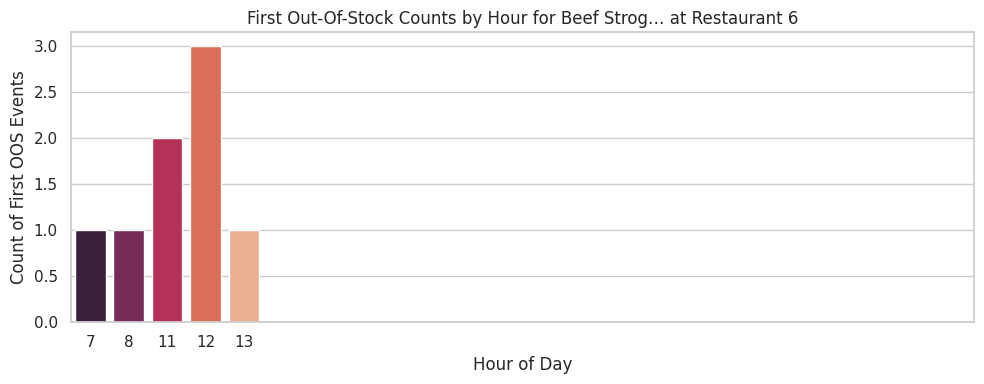

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


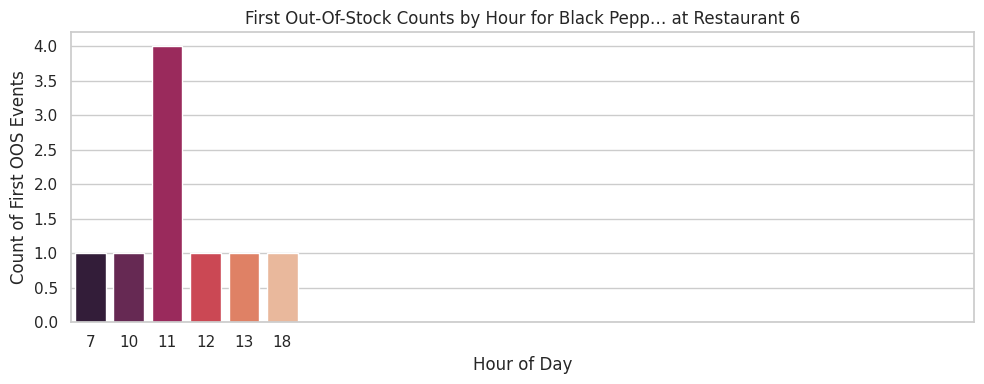

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


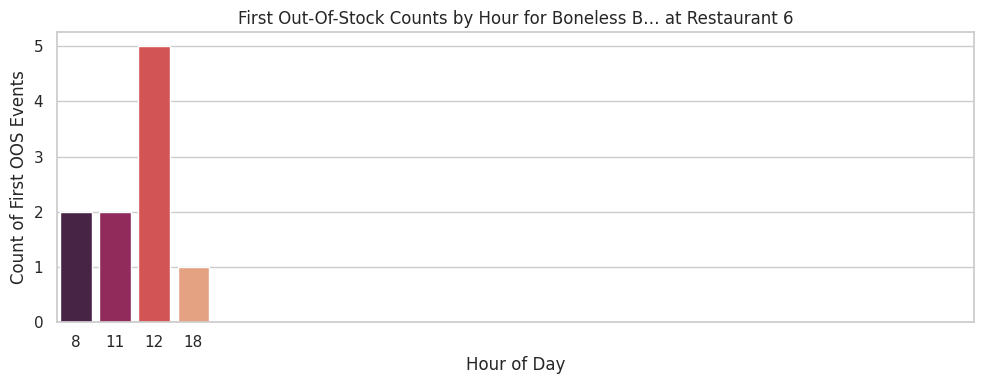

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


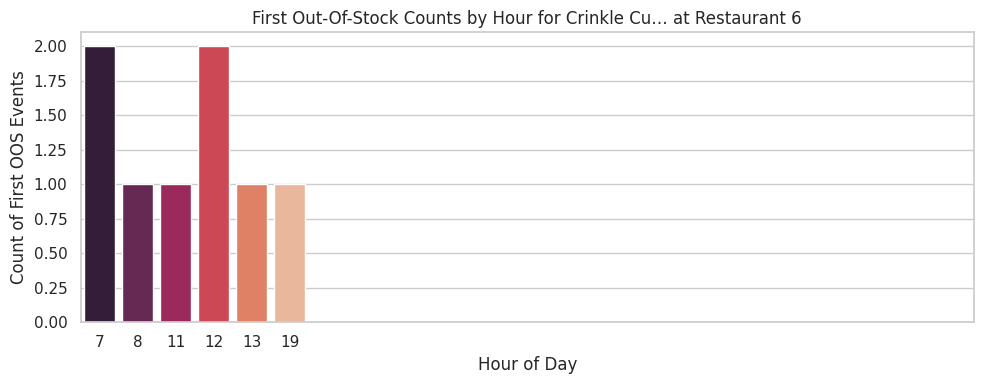

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


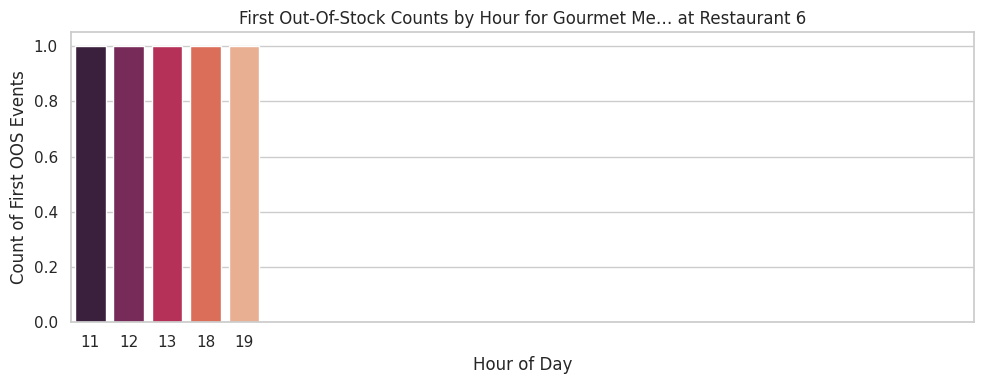

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


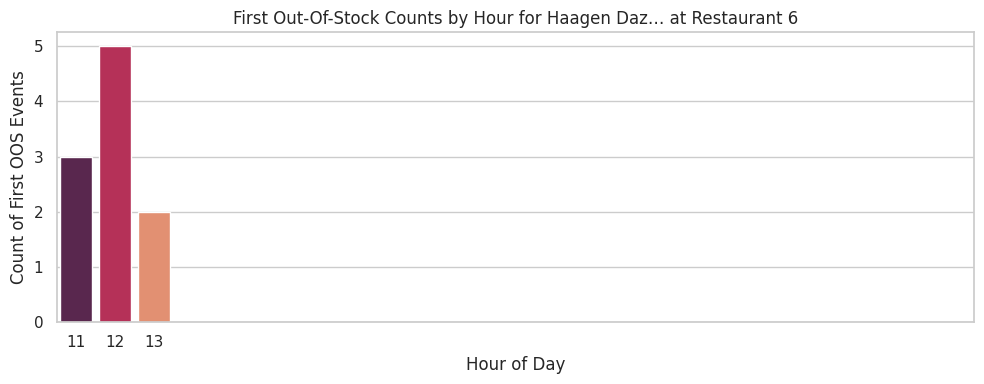

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


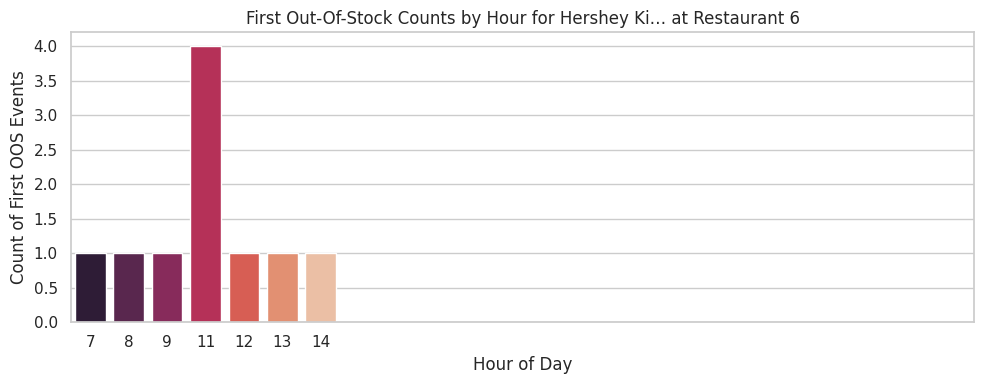

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


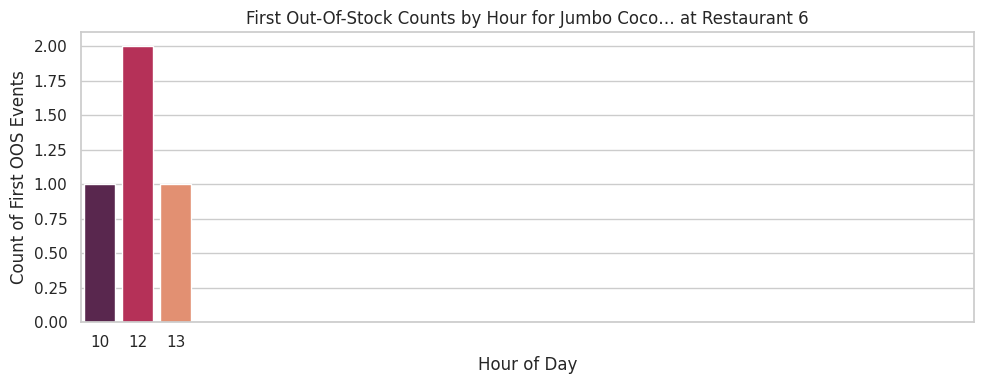

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


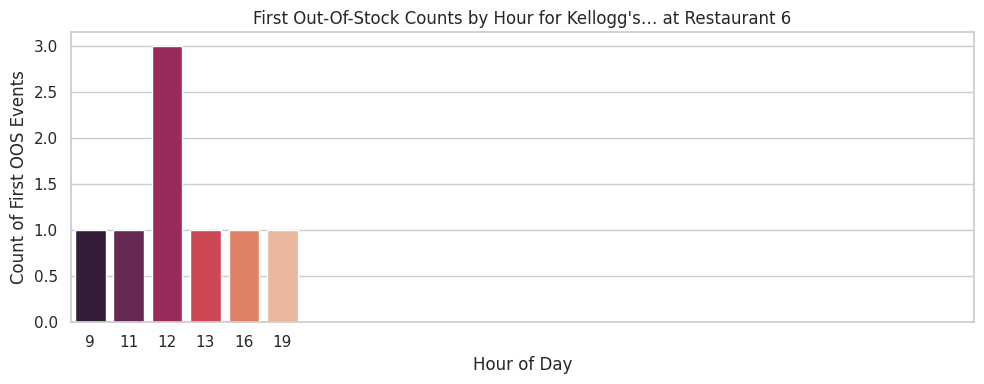

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


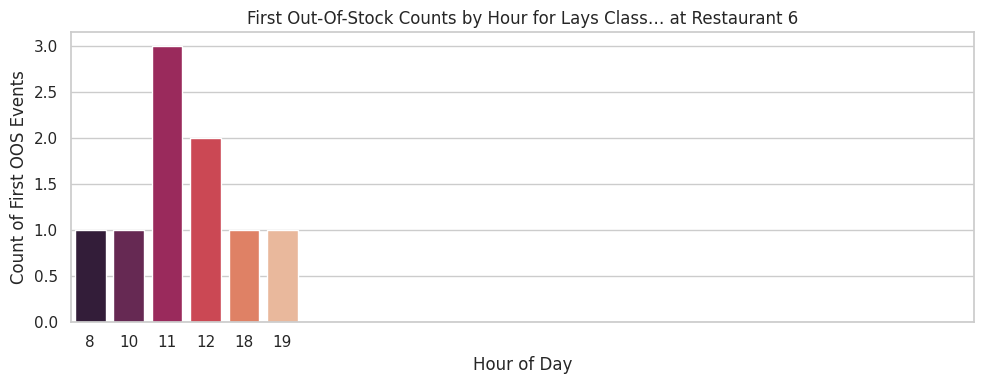

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


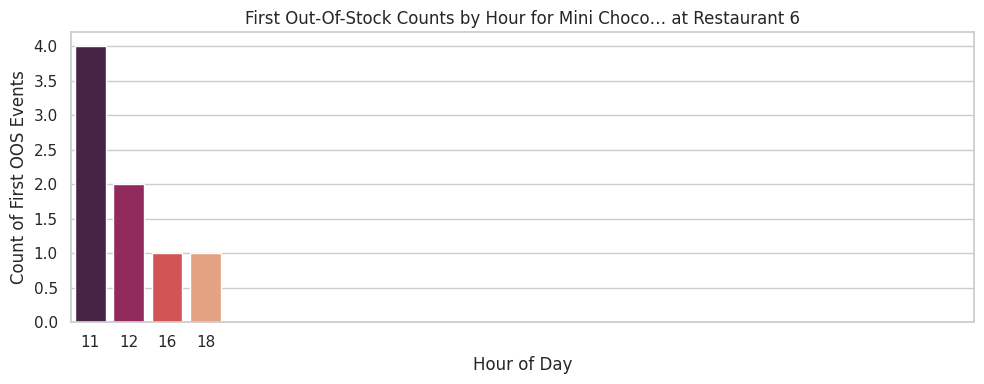

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


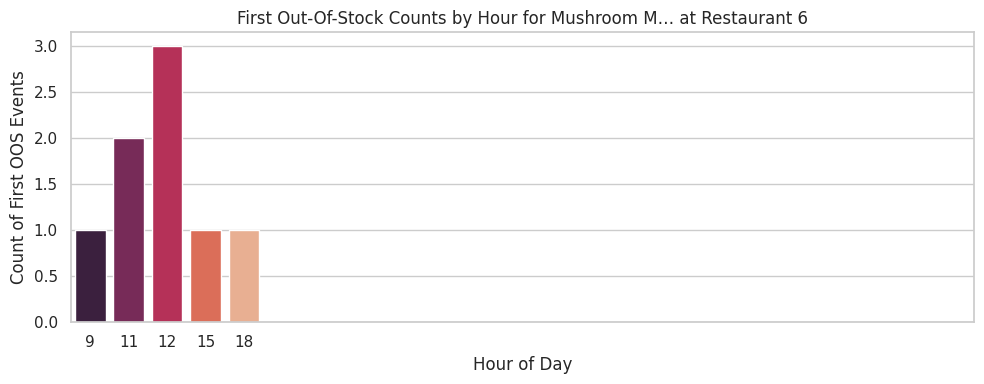

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


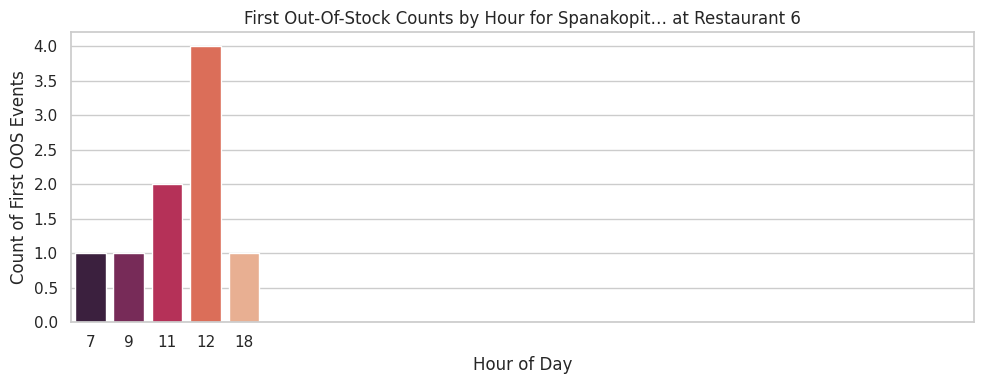

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


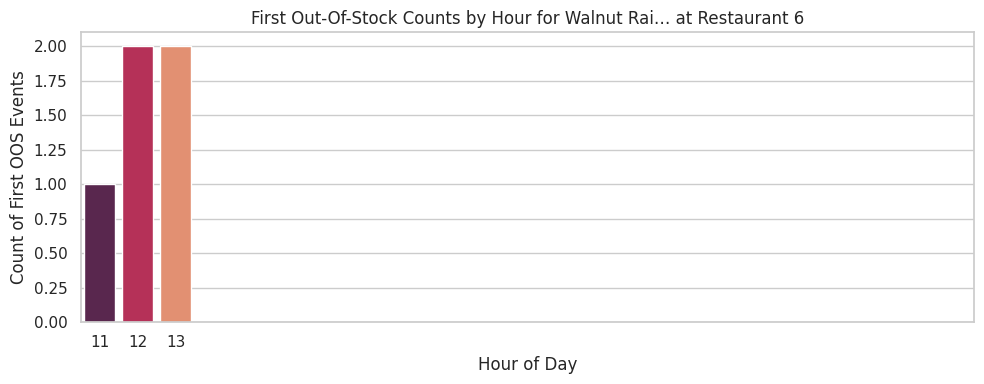

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


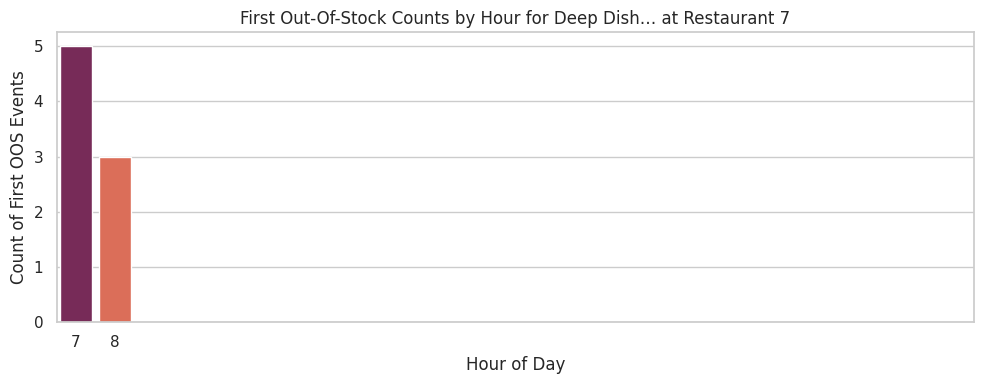

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


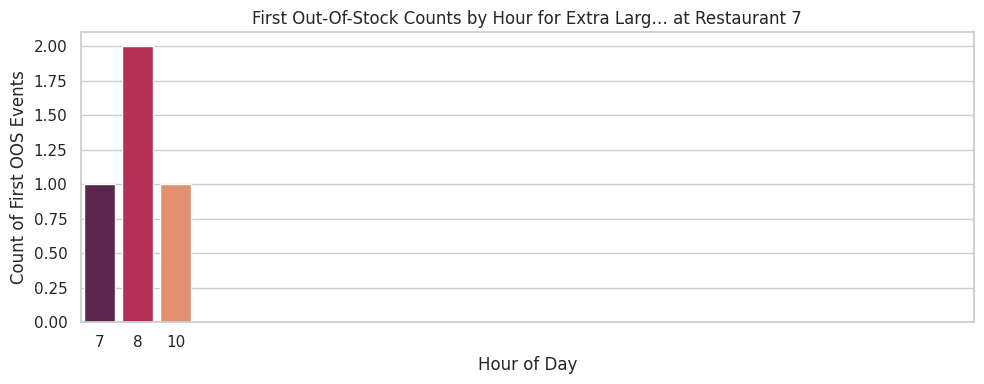

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


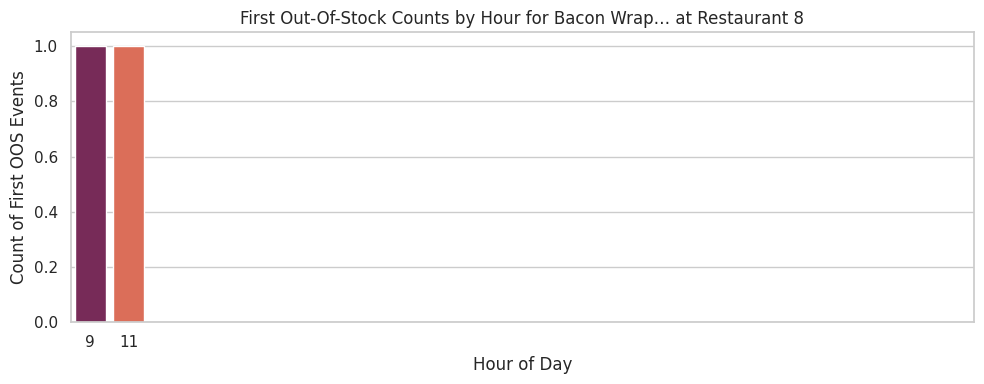

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


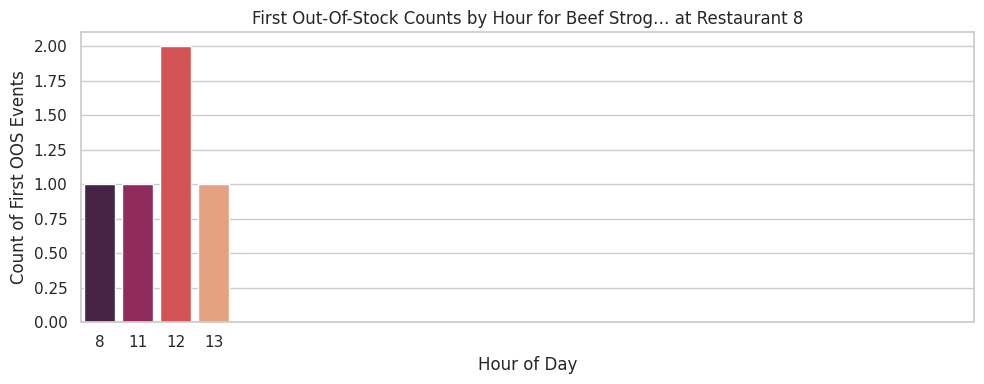

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


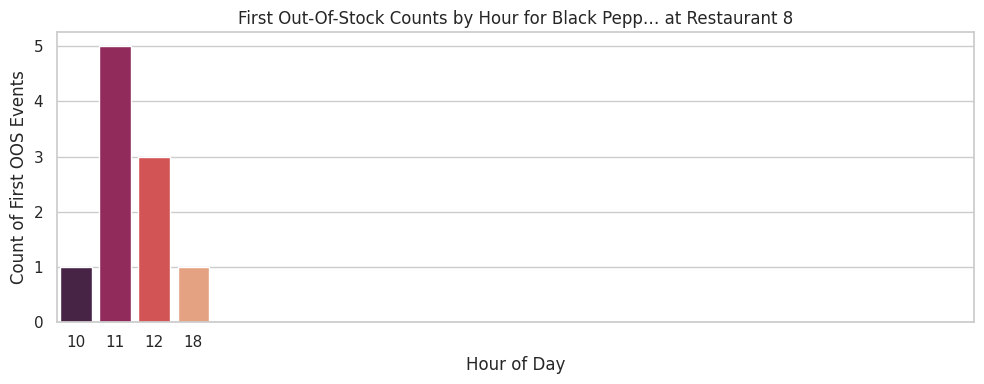

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


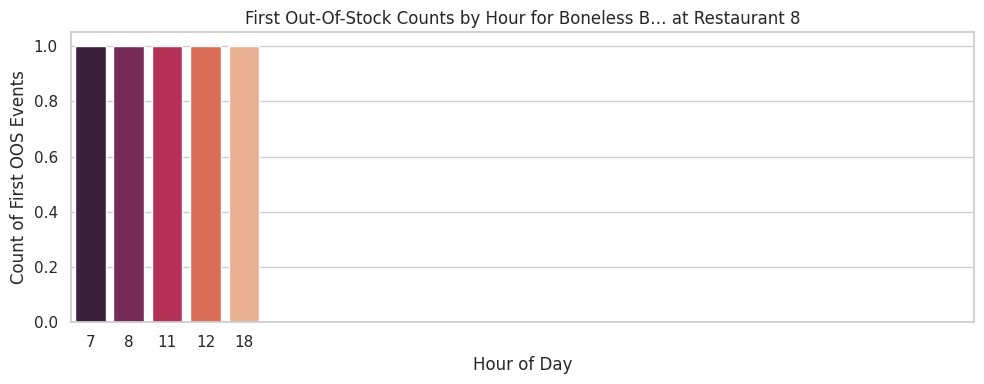

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


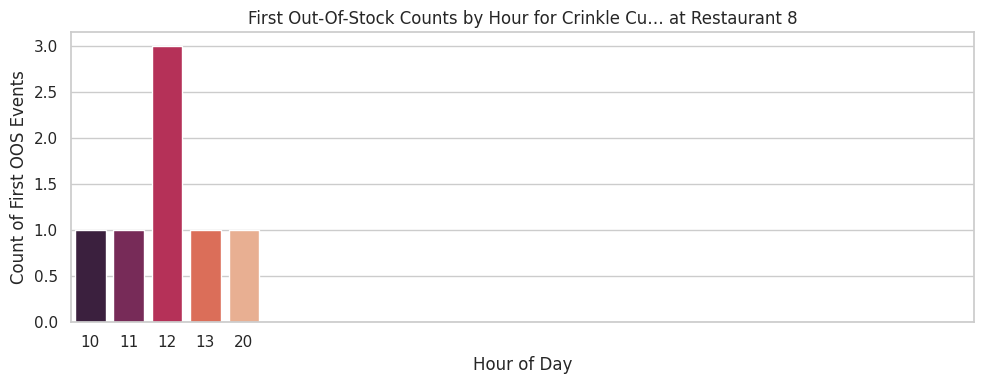

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


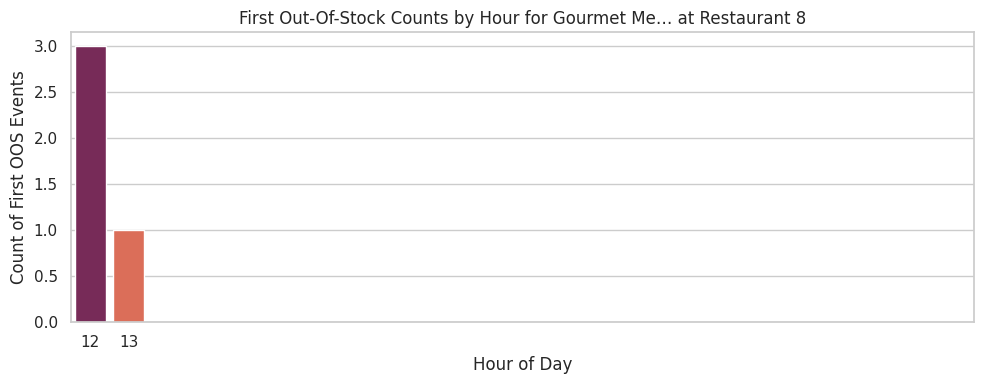

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


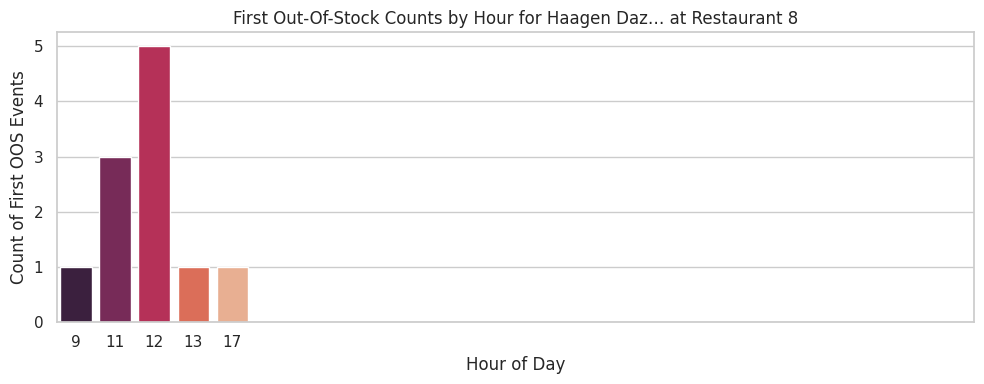

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


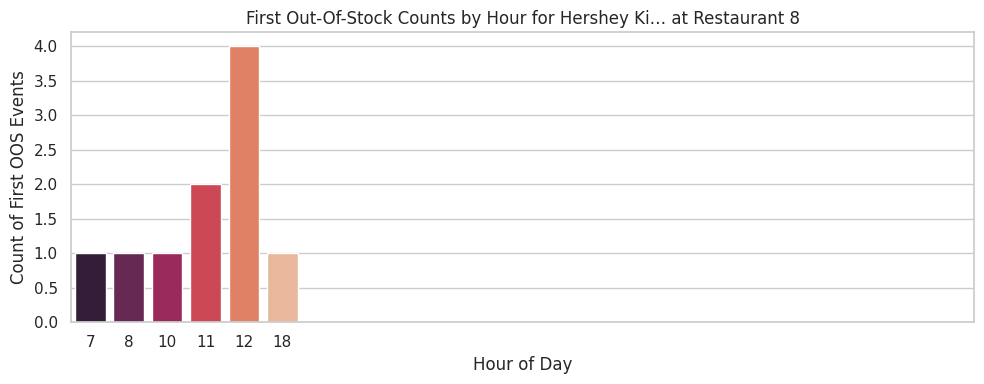

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


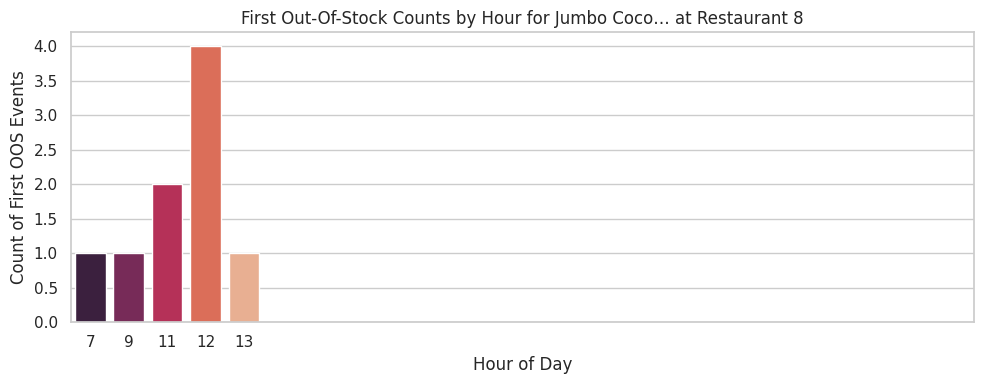

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


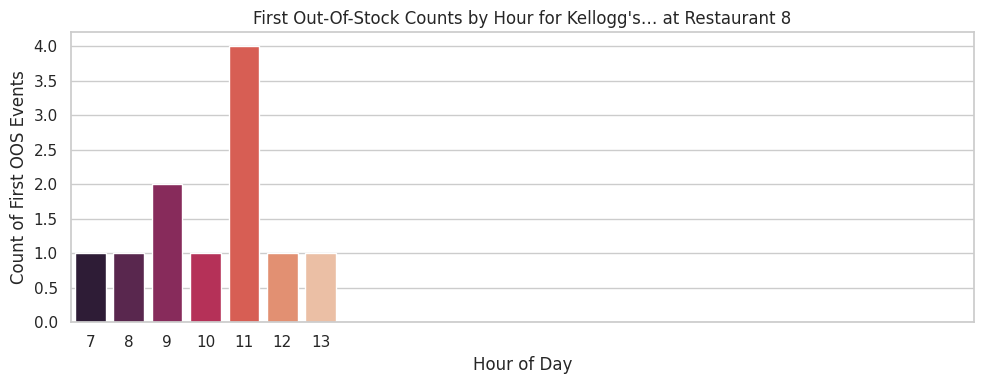

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


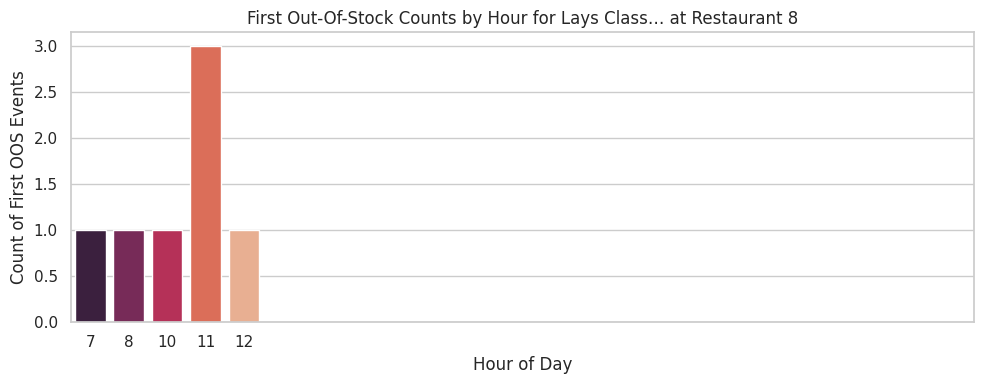

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


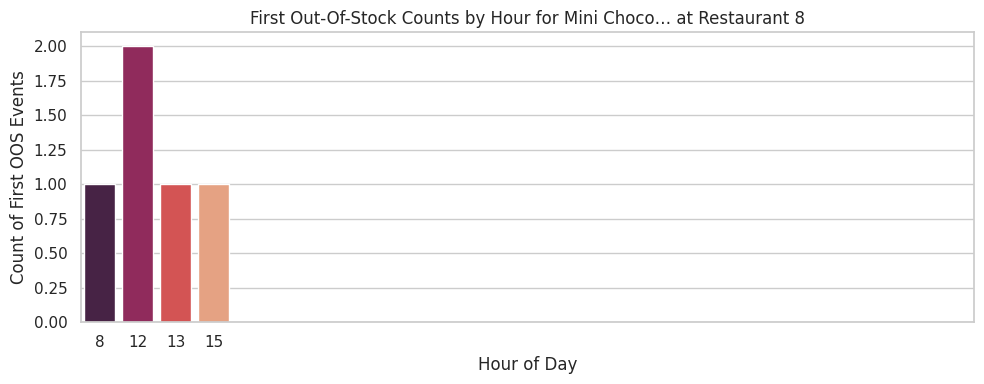

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


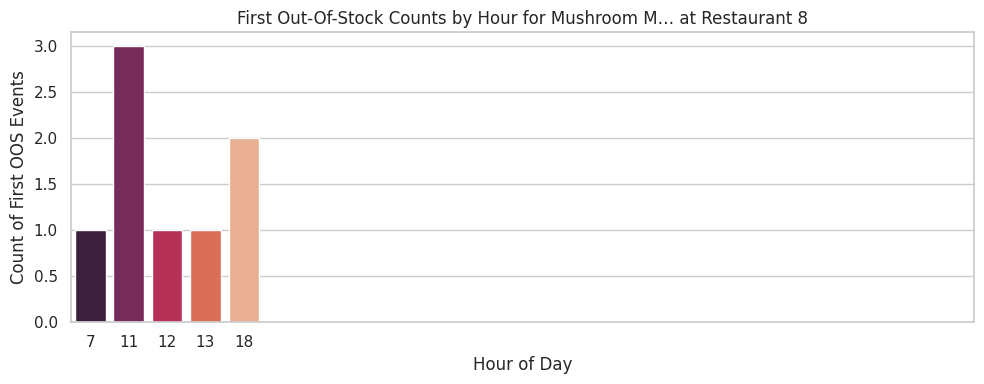

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


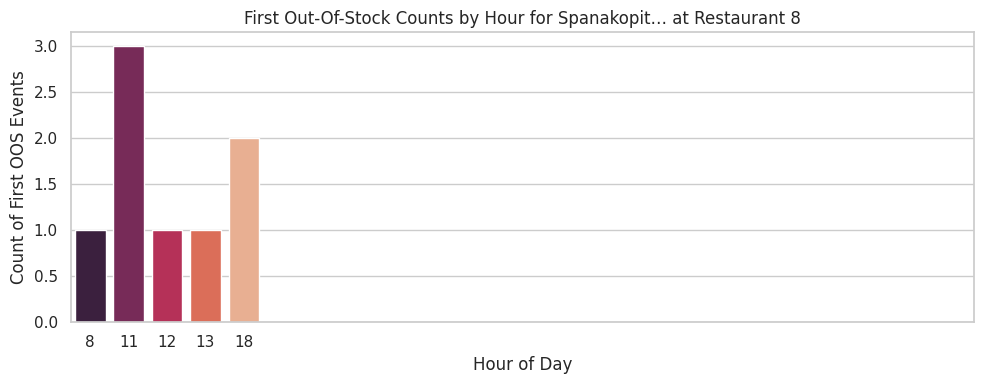

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


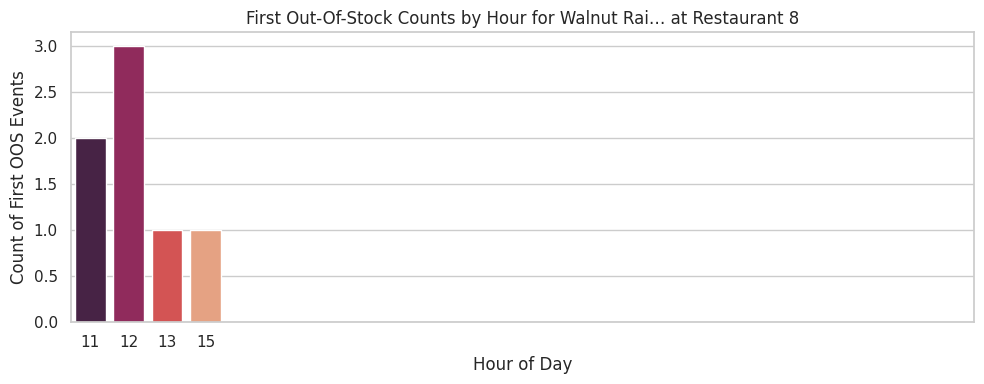

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


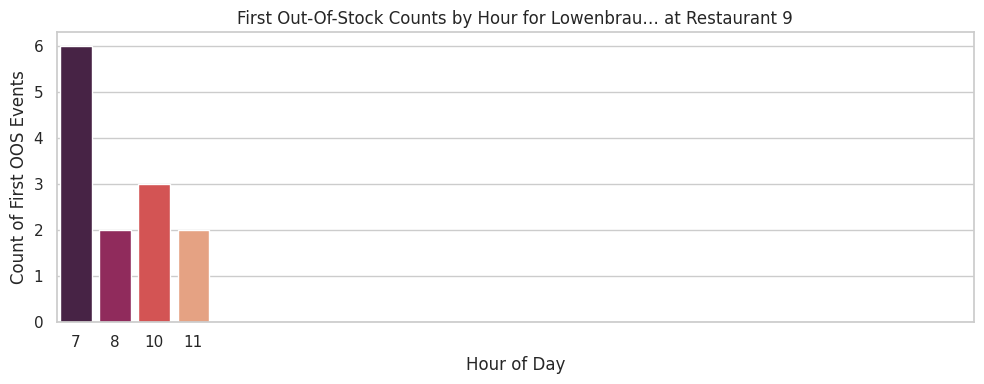

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


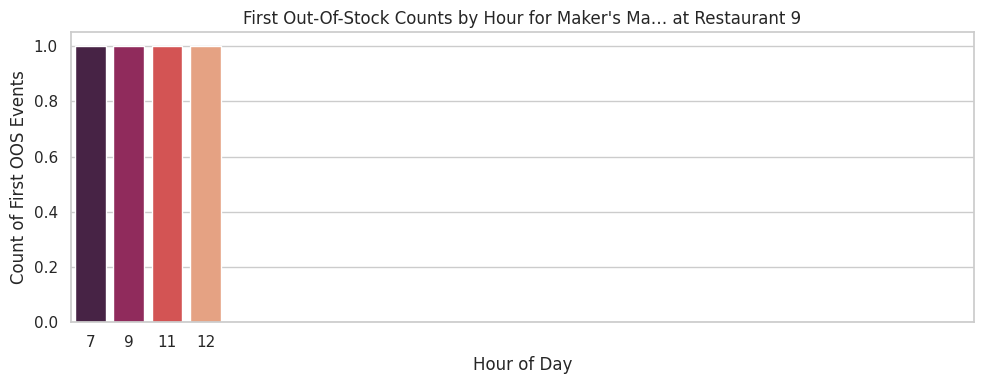

<ipython-input-58-a0d49bd19859>:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")


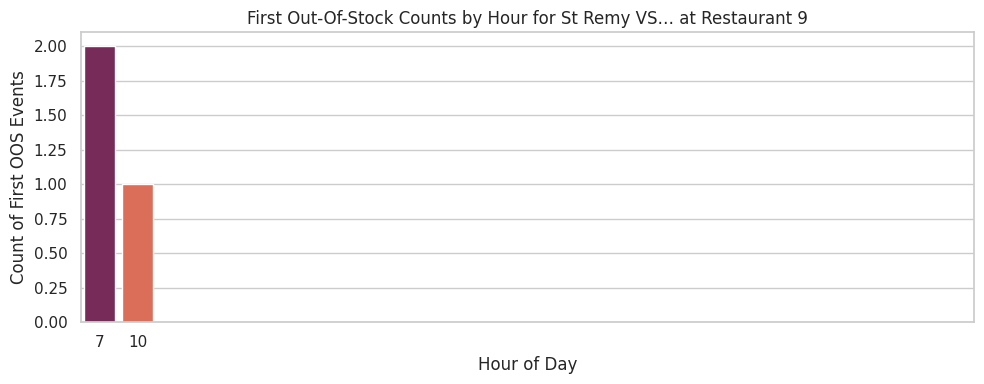

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df already exists with the following relevant columns:
# 'createdTime' (datetime64), 'scenario' (e.g., "In-Stock" or "Out-Of-Stock"),
# 'restaurant_alias', 'item_alias', and 'hour' (derived from createdTime).
# If you haven't already, ensure that df['createdTime'] is a datetime type and that the hour column is created:
# df['hour'] = df['createdTime'].dt.hour

# Step 1. Sort the DataFrame by restaurant, item, and time.
df_sorted = df.sort_values(['restaurant_alias', 'item_alias', 'createdTime'])

# Step 2. Create a new column to hold the previous scenario for each restaurant–item group.
df_sorted['prev_scenario'] = df_sorted.groupby(['restaurant_alias', 'item_alias'])['scenario'].shift(1)

# Step 3. Identify the first Out-Of-Stock event after being DELIVERED.
first_oos = df_sorted[
    (df_sorted['scenario'] == "OUT_OF_STOCK") &
    (df_sorted['prev_scenario'] == "DELIVERED")
].copy()

# Optionally check how many first transitions you have:
print("Total first OOS transitions:", first_oos.shape[0])

# Step 4. Group these first OOS events by restaurant_alias, item_alias, and hour.
first_oos_counts = (
    first_oos.groupby(['restaurant_alias', 'item_alias', 'hour'])
             .size()
             .reset_index(name='count')
)

print("First OOS counts aggregated by hour:")
print(first_oos_counts.head())

# Step 5a. (Pivot View)
# Create a pivot table where rows are restaurant-item pairs and columns are hours.
first_oos_pivot = first_oos_counts.pivot_table(
    index=['restaurant_alias', 'item_alias'],
    columns='hour',
    values='count',
    fill_value=0
)

print("\nPivot table of first OOS counts (rows: restaurant, item; columns: hour):")
print(first_oos_pivot)

# Step 5b. (Optional Visualization)
# For each restaurant–item pair, plot a bar chart of the first OOS count by hour.
unique_pairs = first_oos_counts[['restaurant_alias', 'item_alias']].drop_duplicates()

for idx, pair in unique_pairs.iterrows():
    restaurant = pair['restaurant_alias']
    item = pair['item_alias']

    # Subset to the current pair
    pair_data = first_oos_counts[
        (first_oos_counts['restaurant_alias'] == restaurant) &
        (first_oos_counts['item_alias'] == item)
    ]

    # Create a barplot for the current pair
    plt.figure(figsize=(10, 4))
    sns.barplot(x='hour', y='count', data=pair_data, palette="rocket")
    plt.xticks(range(0, 24))  # Show all 24 hours if data exists throughout the day
    plt.title(f'First Out-Of-Stock Counts by Hour for {item} at {restaurant}')
    plt.xlabel('Hour of Day')
    plt.ylabel('Count of First OOS Events')
    plt.tight_layout()
    plt.show()

<ipython-input-60-228c22741b50>:51: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


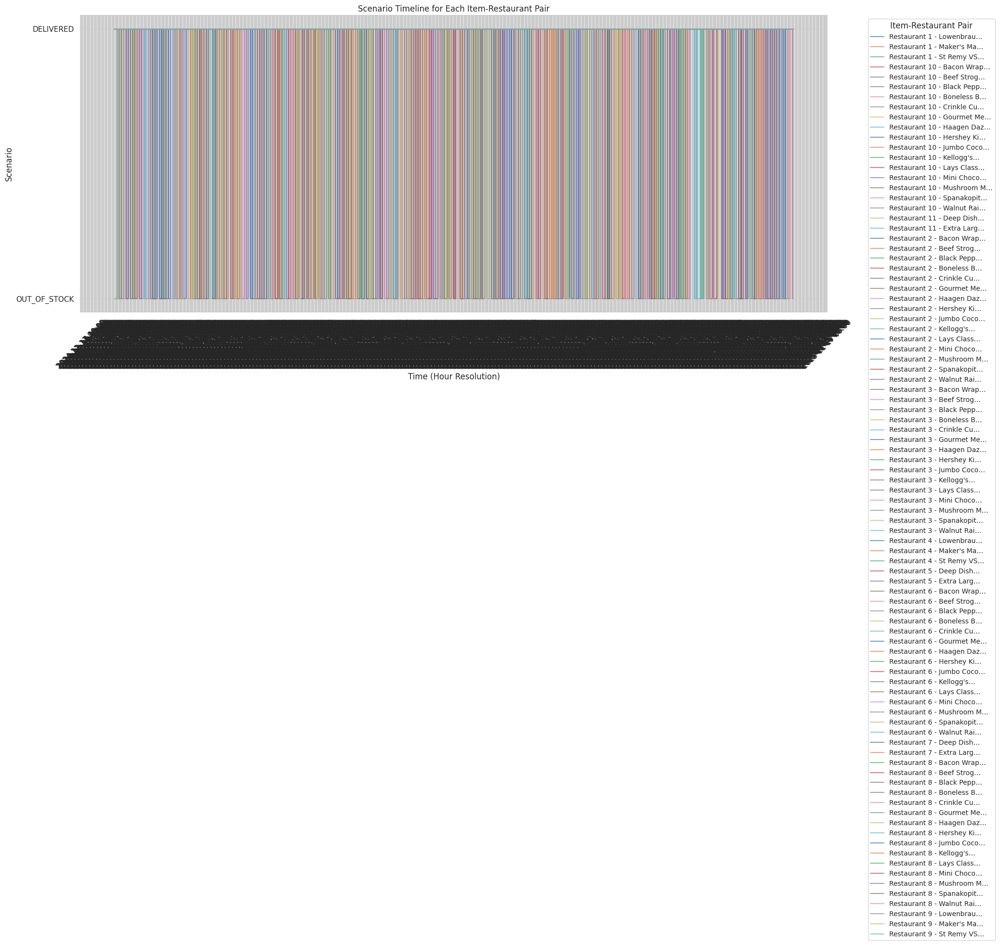

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Ensure createdTime is in datetime format
df['createdTime'] = pd.to_datetime(df['createdTime'])

# Create a combined identifier for the item-restaurant pair.
df['pair'] = df['restaurant_alias'] + " - " + df['item_alias']

# Filter to include only the scenarios we want.
df_pair = df[df['scenario'].isin(["DELIVERED", "OUT_OF_STOCK"])].copy()

# Map scenarios to numeric values (0 for OUT_OF_STOCK, 1 for DELIVERED)
scenario_map = {"OUT_OF_STOCK": 0, "DELIVERED": 1}
df_pair['scenario_numeric'] = df_pair['scenario'].map(scenario_map)

# Sort values by time so that the step plot represents the sequence correctly.
df_pair.sort_values('createdTime', inplace=True)

# Loop over each item-restaurant pair and create a separate plot.
for pair, group in df_pair.groupby('pair'):
    plt.figure(figsize=(20, 8))

    # Create a step plot so transitions are clear
    plt.step(group['createdTime'], group['scenario_numeric'], where='post', label=pair, linewidth=2)

    # Set the labels and title
    plt.xlabel("Time (Hourly)", fontsize=14)
    plt.ylabel("Scenario", fontsize=14)
    plt.title(f"Scenario Timeline for {pair}", fontsize=16)

    # Configure y-axis: mapping numeric values back to scenario labels.
    plt.yticks([0, 1], ['OUT_OF_STOCK', 'DELIVERED'], fontsize=12)

    # Adjust the x-axis: set hourly ticks and rotate labels for clarity.
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.HourLocator(interval=6))  # Tick every 6 hours; adjust as needed.
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
    plt.xticks(rotation=45, fontsize=10)

    plt.legend(loc='upper left')
    plt.tight_layout()
    plt.show()

# Focus on 2 features

* last order of OUT_OF_STOCK
* last order of DELIVERED

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.cloud import bigquery

client = bigquery.Client()
sns.set(style="whitegrid")

query = "SELECT * FROM `just-data-sandbox-oos.feature_engineering_final.features_table_with_total`"
df = client.query(query).to_dataframe()

pd.set_option('display.max_colwidth', 20)
pd.set_option('display.max_columns', None)  # Show all columns
df=df.sort_values(by='createdTime', ascending=True)
df.head()

,unique_id,createdTime,order_item_quantity,restaurant_id,order_item_name,order_item_price_each,order_item_price_sum,total,subtotal,scenario,orderId,time_since_last_out_of_stock,time_since_last_delivered
115308,a2556aa8-d4dc-4f...,2025-01-01 07:01:...,4,11f1f94555e155ad...,Lays Class######...,12.67,50.68,58.28,50.68,DELIVERED,7632ebc729d44c13...,<NA>,<NA>
233190,4c61329b-3fd8-4a...,2025-01-01 07:04:...,3,2792271a088e7881...,Maker's Ma######...,69.56,208.68,239.98,208.68,DELIVERED,1afda0b7579941f3...,<NA>,<NA>
17003,d943c0ce-2be3-43...,2025-01-01 07:08:...,5,007c0cb81363275a...,Deep Dish ######...,45.70,228.50,262.77,228.50,DELIVERED,ca47fa6b523748d9...,<NA>,<NA>
92408,3e72cde7-bafb-43...,2025-01-01 07:15:...,5,0fdea8d9e04c6247...,Lowenbrau ######...,4.40,22.00,25.30,22.00,DELIVERED,e18a3b650c644af5...,<NA>,<NA>
127471,31ba0aa0-bf21-49...,2025-01-01 07:16:...,4,11f1f94555e155ad...,Bacon Wrap######...,57.53,230.12,264.64,230.12,DELIVERED,7f769ed162474536...,<NA>,<NA>


In [21]:
list(df.columns)

['unique_id',
 'createdTime',
 'order_item_quantity',
 'restaurant_id',
 'order_item_name',
 'order_item_price_each',
 'order_item_price_sum',
 'total',
 'subtotal',
 'scenario',
 'orderId',
 'time_since_last_out_of_stock',
 'time_since_last_delivered']

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 236570 entries, 115308 to 176196
Data columns (total 13 columns):
 #   Column                        Non-Null Count   Dtype              
---  ------                        --------------   -----              
 0   unique_id                     236570 non-null  object             
 1   createdTime                   236570 non-null  datetime64[us, UTC]
 2   order_item_quantity           236570 non-null  Int64              
 3   restaurant_id                 236570 non-null  object             
 4   order_item_name               236570 non-null  object             
 5   order_item_price_each         236570 non-null  float64            
 6   order_item_price_sum          236570 non-null  float64            
 7   total                         236570 non-null  float64            
 8   subtotal                      236570 non-null  float64            
 9   scenario                      236570 non-null  object             
 10  orderId             

In [24]:
# Add time features from createdTime
df['year'] = df['createdTime'].dt.year
df['month'] = df['createdTime'].dt.month
df['day'] = df['createdTime'].dt.day  # Day of month
df['weekday'] = df['createdTime'].dt.weekday  # Monday=0, Sunday=6
df['createdTime'] = pd.to_datetime(df['createdTime'])
df['hour'] = df['createdTime'].dt.hour

In [26]:
list(df.columns)

['unique_id',
 'createdTime',
 'order_item_quantity',
 'restaurant_id',
 'order_item_name',
 'order_item_price_each',
 'order_item_price_sum',
 'total',
 'subtotal',
 'scenario',
 'orderId',
 'time_since_last_out_of_stock',
 'time_since_last_delivered',
 'year',
 'month',
 'day',
 'weekday',
 'hour']

In [25]:
# Count missing values in each column
print("Missing Values per Column:")
missing_values = df.isnull().sum()
print(missing_values[missing_values > 0])

Missing Values per Column:
time_since_last_out_of_stock    33673
time_since_last_delivered         120
dtype: int64


In [27]:
df.fillna(0, inplace=True)

In [28]:
# Count missing values in each column
print("Missing Values per Column:")
missing_values = df.isnull().sum()
print(missing_values[missing_values > 0])

Missing Values per Column:
Series([], dtype: int64)


In [29]:
# Samples per Restaurant with Aliases Based on Frequency

# Create an alias mapping using the order from the largest count (largest first)
sorted_restaurants = df['restaurant_id'].value_counts().index
alias_dict = {rid: f"Restaurant {i+1}" for i, rid in enumerate(sorted_restaurants)}

# Map the restaurant_id column to create a new alias column based on sorted order
df['restaurant_alias'] = df['restaurant_id'].map(alias_dict)

# Textual summary: Count the number of samples per restaurant using alias.
print("Samples per Restaurant (Alias based on frequency: largest gets 'Restaurant 1'):")
restaurant_summary = df['restaurant_alias'].value_counts()

# Create a new column 'item_alias' by removing everything after the first '#' occurrence
# and appending an ellipsis ("…") if any '#' were found
df['item_alias'] = df['order_item_name'].apply(
    lambda x: x.split('#')[0].strip() + ("…" if '#' in x else "")
)

# Samples per item using the new alias
print("\nSamples per Item (using item_alias):")
item_summary = df['item_alias'].value_counts()
print(item_summary.to_string())

Samples per Restaurant (Alias based on frequency: largest gets 'Restaurant 1'):

Samples per Item (using item_alias):
item_alias
Extra Larg…    32247
Deep Dish…     31932
Maker's Ma…    21732
Lowenbrau…     21612
St Remy VS…    21549
Lays Class…     7274
Boneless B…     7236
Mushroom M…     7225
Haagen Daz…     7206
Black Pepp…     7201
Spanakopit…     7191
Bacon Wrap…     7175
Walnut Rai…     7152
Gourmet Me…     7151
Beef Strog…     7138
Crinkle Cu…     7126
Hershey Ki…     7117
Kellogg's…      7114
Jumbo Coco…     7100
Mini Choco…     7092


In [30]:
# list(df.columns)

['unique_id',
 'createdTime',
 'order_item_quantity',
 'restaurant_id',
 'order_item_name',
 'order_item_price_each',
 'order_item_price_sum',
 'total',
 'subtotal',
 'scenario',
 'orderId',
 'time_since_last_out_of_stock',
 'time_since_last_delivered',
 'year',
 'month',
 'day',
 'weekday',
 'hour',
 'restaurant_alias',
 'item_alias']

In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 236570 entries, 115308 to 176196
Data columns (total 20 columns):
 #   Column                        Non-Null Count   Dtype              
---  ------                        --------------   -----              
 0   unique_id                     236570 non-null  object             
 1   createdTime                   236570 non-null  datetime64[us, UTC]
 2   order_item_quantity           236570 non-null  Int64              
 3   restaurant_id                 236570 non-null  object             
 4   order_item_name               236570 non-null  object             
 5   order_item_price_each         236570 non-null  float64            
 6   order_item_price_sum          236570 non-null  float64            
 7   total                         236570 non-null  float64            
 8   subtotal                      236570 non-null  float64            
 9   scenario                      236570 non-null  object             
 10  orderId             

## EDA

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [33]:
print("\nSummary Statistics:")
print(df.describe())


Summary Statistics:
       order_item_quantity  order_item_price_each  order_item_price_sum  \
count             236570.0        236570.000000          236570.000000    
mean              2.999856            39.385160             118.074115    
std               1.414285            22.638891              93.369599    
min                    1.0             4.400000               4.400000    
25%                    2.0            18.840000              43.620000    
50%                    3.0            42.900000              91.400000    
75%                    4.0            67.190000             182.800000    
max                    5.0            71.210000             356.050000    

               total       subtotal  time_since_last_out_of_stock  \
count  236570.000000  236570.000000             236570.0            
mean      135.784606     118.074115           762.311438            
std       107.375058      93.369599           883.504039            
min         5.060000       

## Distribution of Numerical Variables


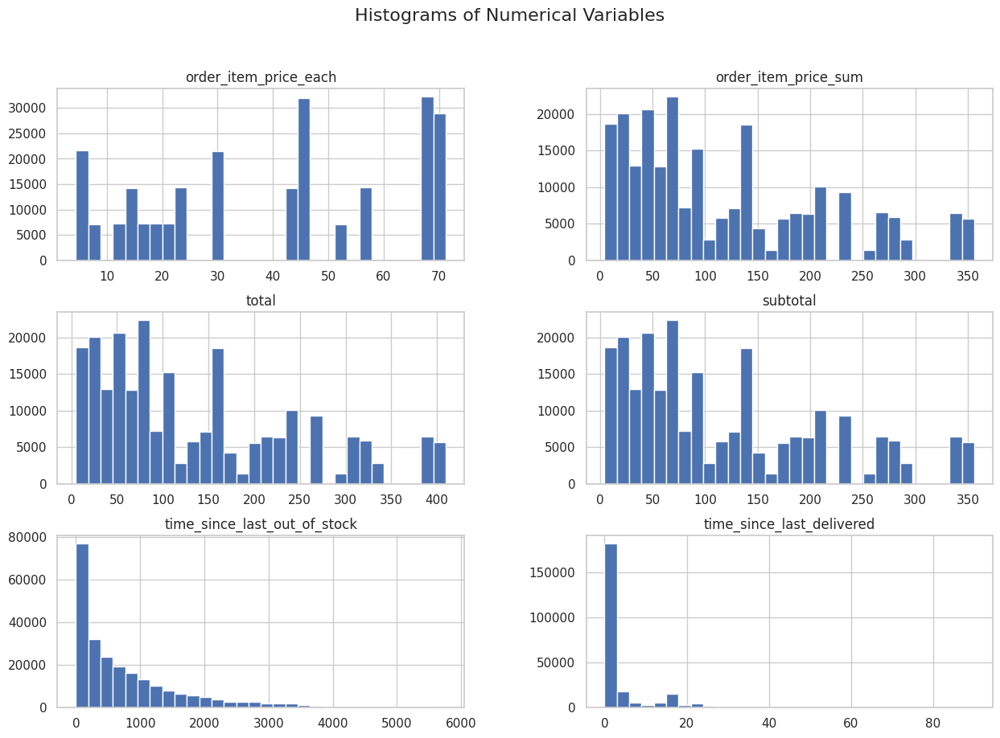

In [34]:
numerical_cols = ['order_item_price_each', 'order_item_price_sum', 'total', 'subtotal',
                  'time_since_last_out_of_stock', 'time_since_last_delivered']

# Plot histograms for numerical columns
df[numerical_cols].hist(bins=30, figsize=(15, 10))
plt.suptitle("Histograms of Numerical Variables", fontsize=16)
plt.show()

### Time-Related Analysis

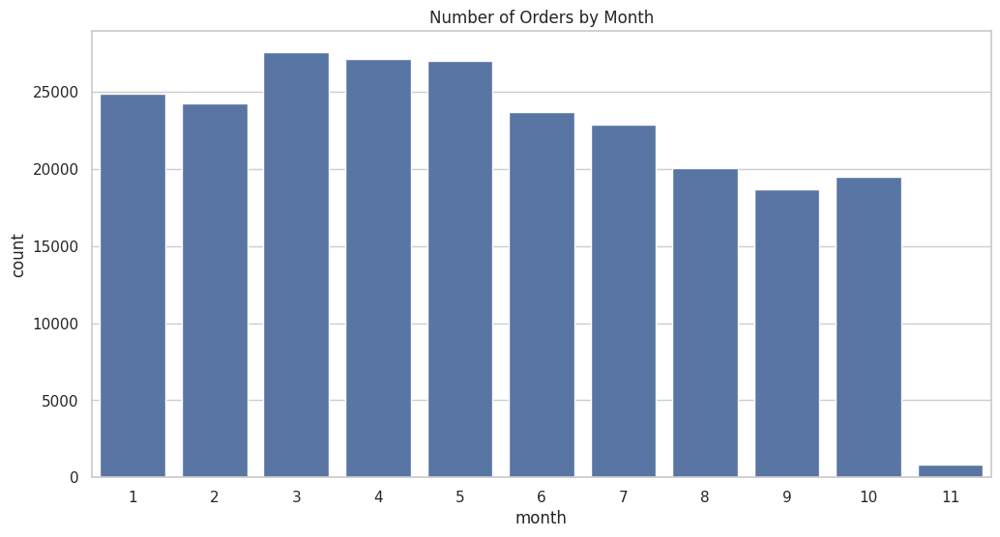

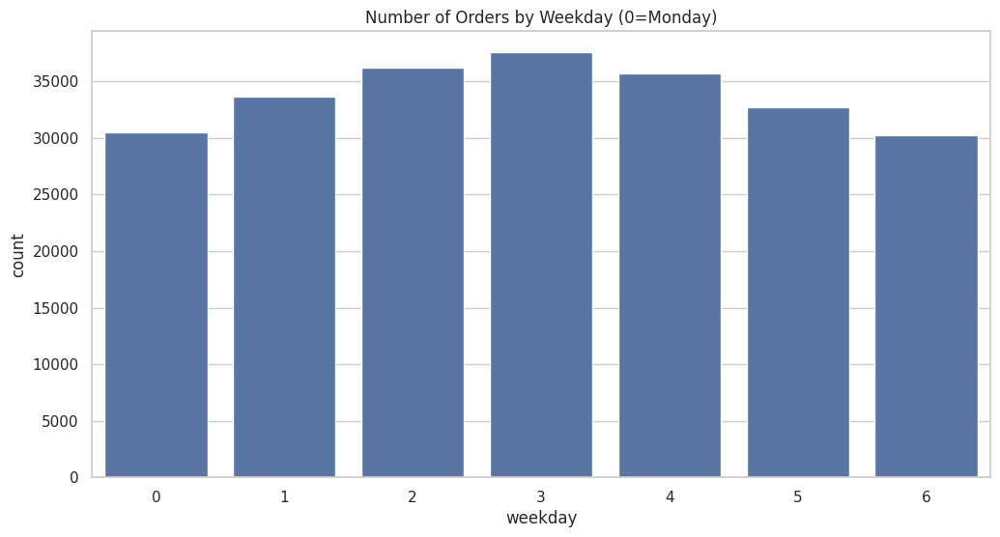

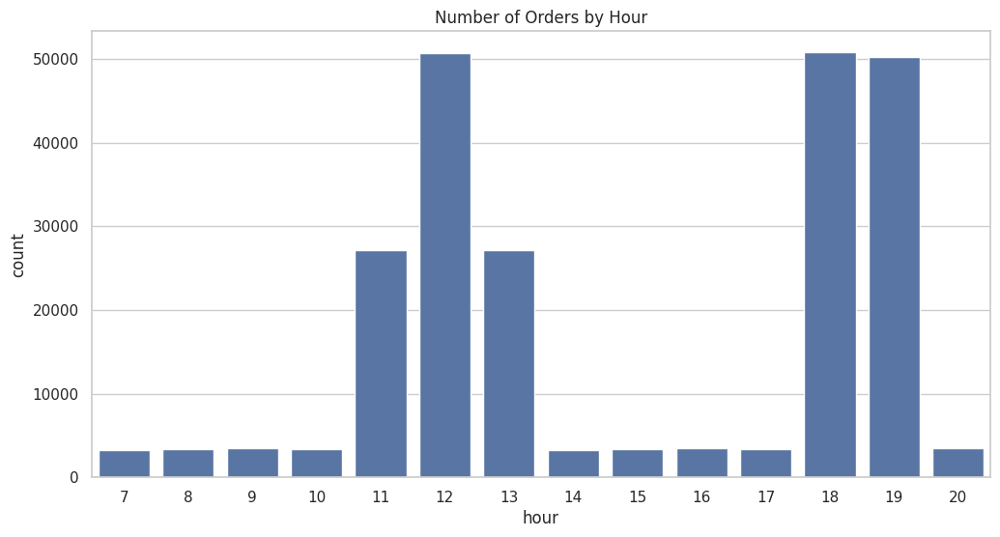

In [36]:
# Distribution by Month, Weekday, and Hour

plt.figure(figsize=(12, 6))
sns.countplot(x='month', data=df)
plt.title("Number of Orders by Month")
plt.show()

plt.figure(figsize=(12, 6))
sns.countplot(x='weekday', data=df)
plt.title("Number of Orders by Weekday (0=Monday)")
plt.show()

plt.figure(figsize=(12, 6))
sns.countplot(x='hour', data=df)
plt.title("Number of Orders by Hour")
plt.show()

### Order Items Analysis

Top 10 Ordered Items:
 item_alias
Extra Larg…    32247
Deep Dish…     31932
Maker's Ma…    21732
Lowenbrau…     21612
St Remy VS…    21549
Lays Class…     7274
Boneless B…     7236
Mushroom M…     7225
Haagen Daz…     7206
Black Pepp…     7201
Name: count, dtype: int64


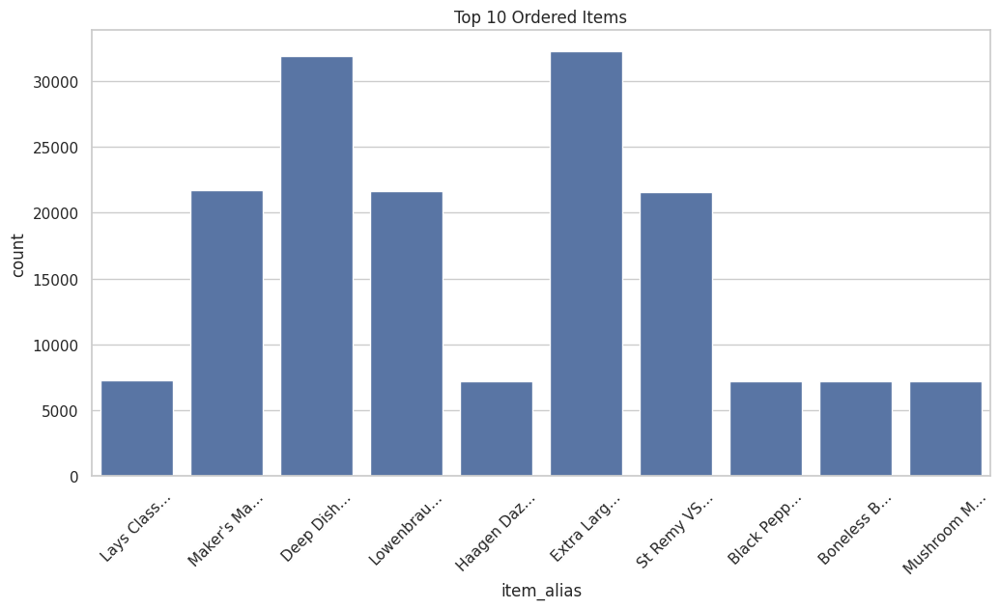

In [39]:
# Top 10 Ordered Items by their count
top_items = df['item_alias'].value_counts().nlargest(10)
print("Top 10 Ordered Items:\n", top_items)

plt.figure(figsize=(12, 6))
sns.countplot(x='item_alias', data=df[df['item_alias'].isin(top_items.index)])
plt.title("Top 10 Ordered Items")
plt.xticks(rotation=45)
plt.show()

### Restaurant Analysis

Top 10 Restaurants by orders:
 restaurant_alias
Restaurant 1     21970
Restaurant 2     21749
Restaurant 3     21626
Restaurant 4     21618
Restaurant 5     21586
Restaurant 6     21529
Restaurant 7     21501
Restaurant 8     21332
Restaurant 9     21305
Restaurant 10    21262
Name: count, dtype: int64


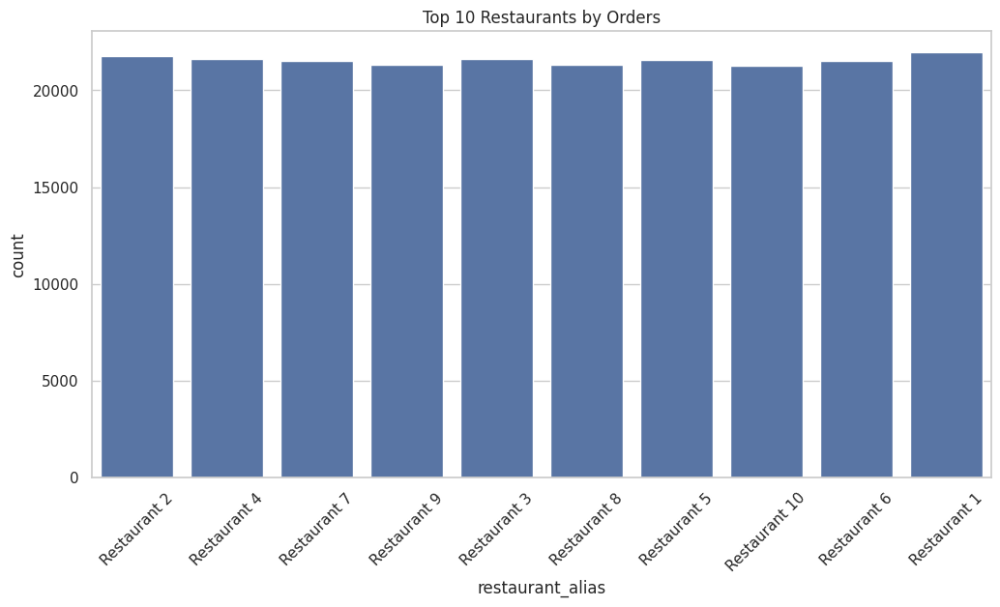

In [40]:
# Top 10 Restaurants by number of orders (or frequency)
top_restaurants = df['restaurant_alias'].value_counts().nlargest(10)
print("Top 10 Restaurants by orders:\n", top_restaurants)

plt.figure(figsize=(12, 6))
sns.countplot(x='restaurant_alias', data=df[df['restaurant_alias'].isin(top_restaurants.index)])
plt.title("Top 10 Restaurants by Orders")
plt.xticks(rotation=45)
plt.show()

### Price Distribution Analysis

<ipython-input-41-27c7b7ed79ba>:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df['order_item_price_each'], shade=True)


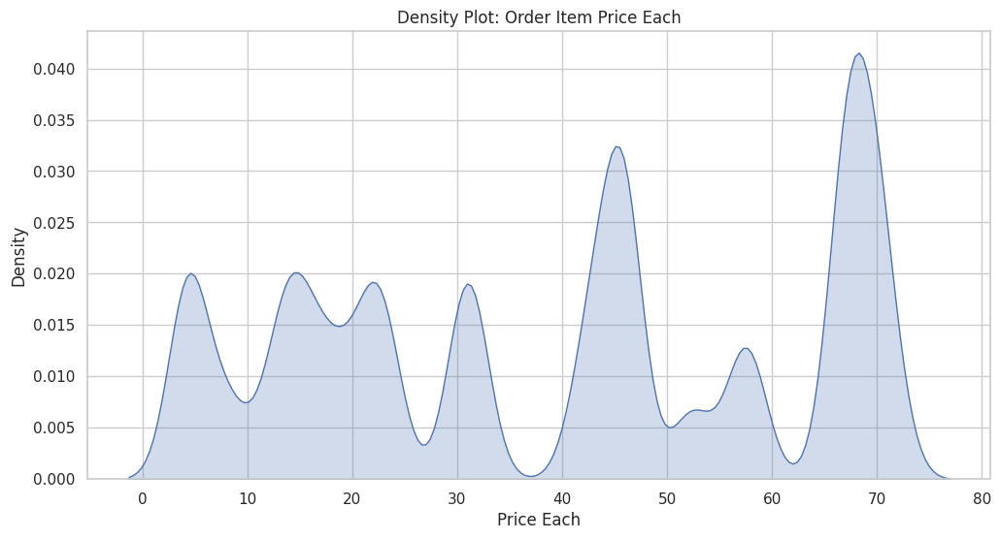

<ipython-input-41-27c7b7ed79ba>:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df['order_item_price_sum'], shade=True)


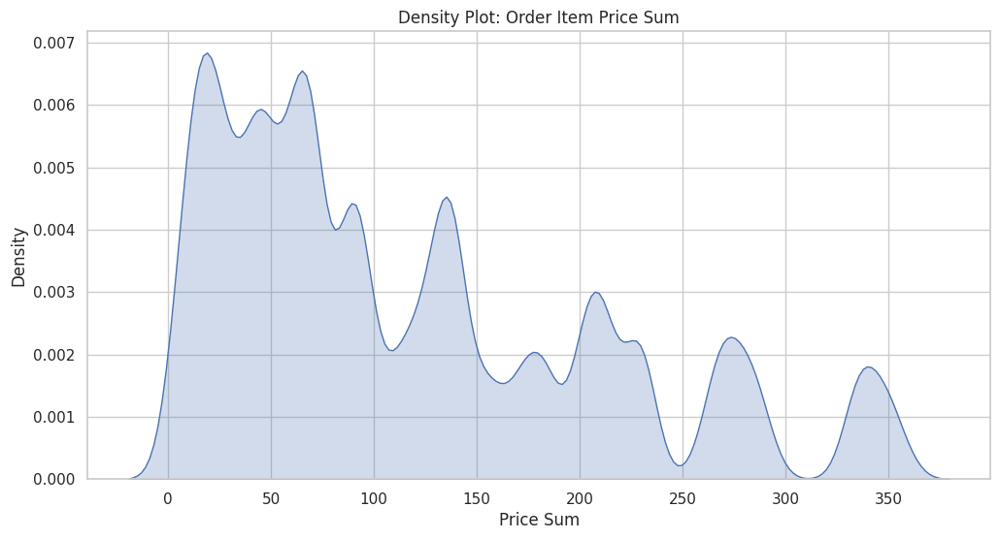

<ipython-input-41-27c7b7ed79ba>:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df['total'], shade=True, label='Total')
<ipython-input-41-27c7b7ed79ba>:16: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df['subtotal'], shade=True, label='Subtotal')


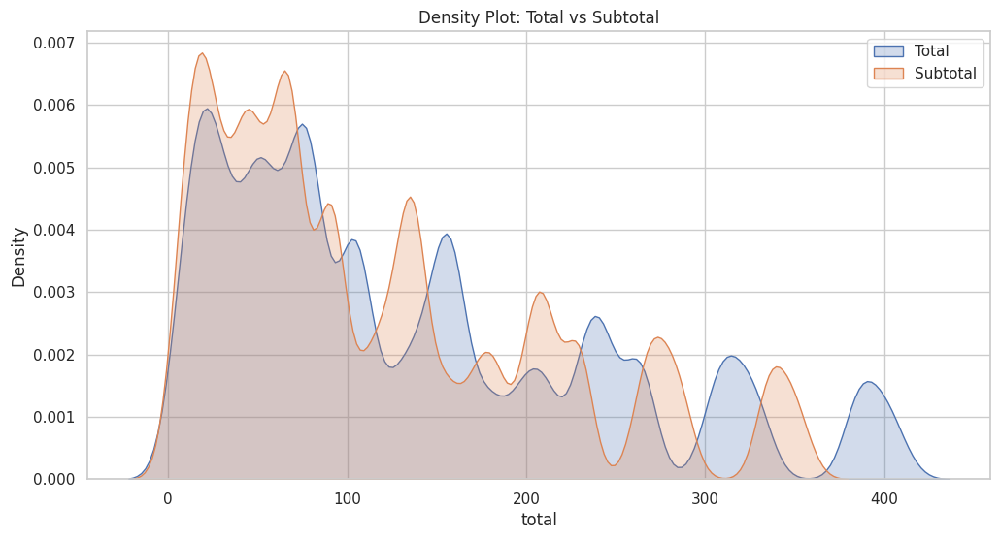

In [41]:
plt.figure(figsize=(12,6))
sns.kdeplot(df['order_item_price_each'], shade=True)
plt.title("Density Plot: Order Item Price Each")
plt.xlabel("Price Each")
plt.show()

plt.figure(figsize=(12,6))
sns.kdeplot(df['order_item_price_sum'], shade=True)
plt.title("Density Plot: Order Item Price Sum")
plt.xlabel("Price Sum")
plt.show()

# Compare total and subtotal distributions
plt.figure(figsize=(12,6))
sns.kdeplot(df['total'], shade=True, label='Total')
sns.kdeplot(df['subtotal'], shade=True, label='Subtotal')
plt.title("Density Plot: Total vs Subtotal")
plt.legend()
plt.show()

### Relationship Analysis

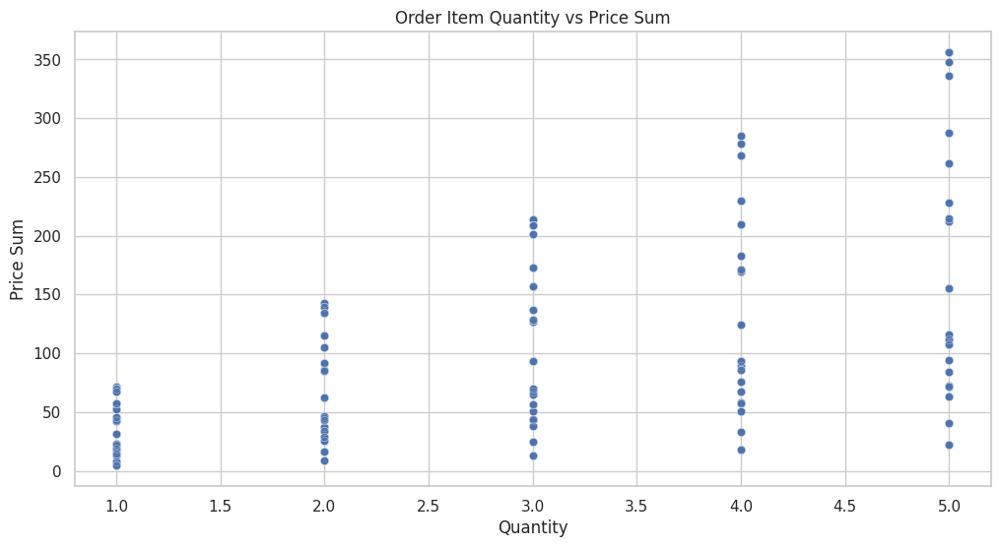

In [42]:
# Scatter plot of Quantity vs Price Sum
plt.figure(figsize=(12, 6))
sns.scatterplot(x='order_item_quantity', y='order_item_price_sum', data=df, alpha=0.3)
plt.title("Order Item Quantity vs Price Sum")
plt.xlabel("Quantity")
plt.ylabel("Price Sum")
plt.show()

### Time Gap Analysis

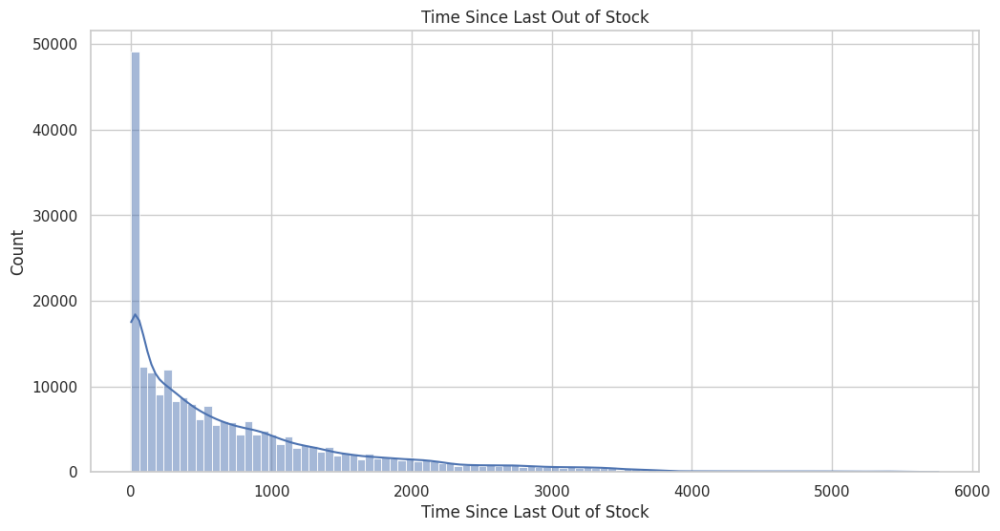

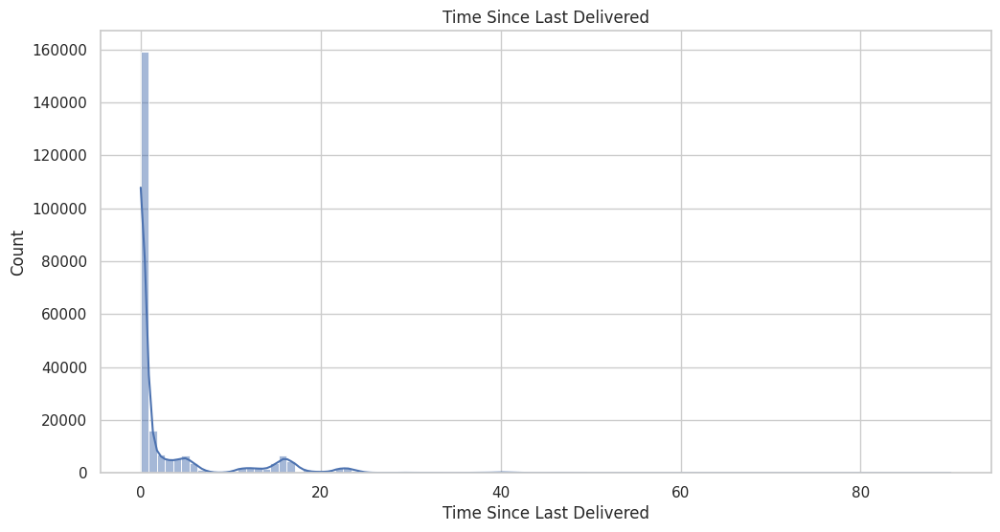

In [43]:
# Analyze distributions of time gaps (e.g., since last out of stock/delivered)
plt.figure(figsize=(12, 6))
sns.histplot(df['time_since_last_out_of_stock'], bins=100, kde=True)
plt.title("Time Since Last Out of Stock")
plt.xlabel("Time Since Last Out of Stock")
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(df['time_since_last_delivered'], bins=100, kde=True)
plt.title("Time Since Last Delivered")
plt.xlabel("Time Since Last Delivered")
plt.show()

### 2D Crosstab Heatmap

restaurant_alias vs. item_alias

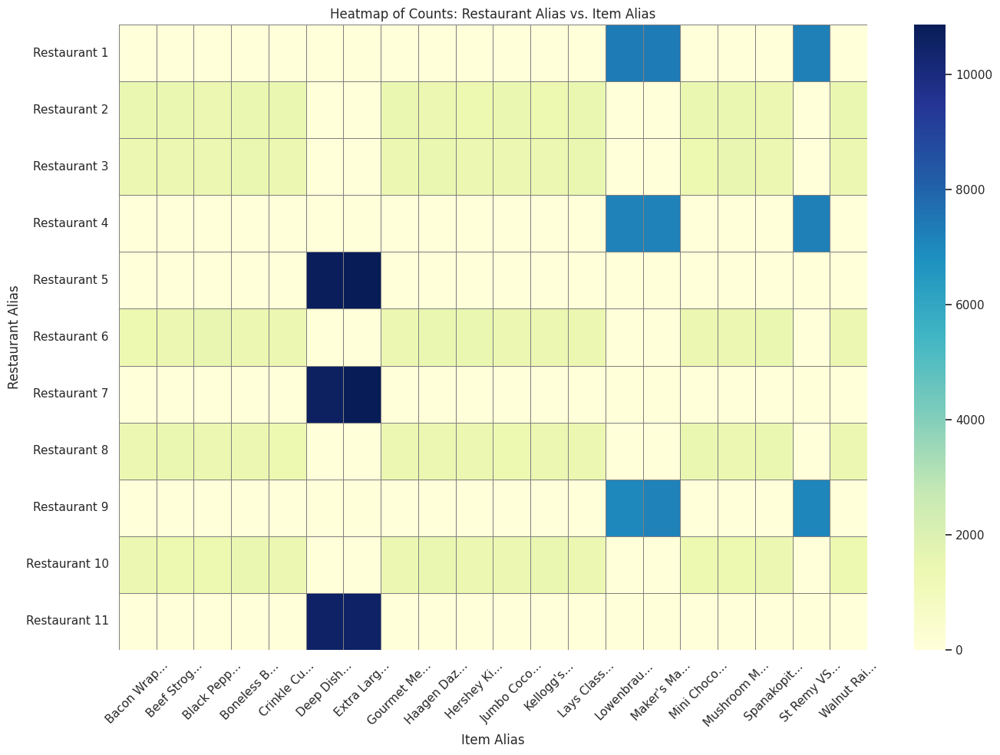

In [44]:
# Create a contingency table (frequency table) between restaurant_alias and item_alias:
crosstab = pd.crosstab(df['restaurant_alias'], df['item_alias'])

# Sort restaurant aliases in natural numeric order
sorted_rest_aliases = sorted(crosstab.index, key=lambda x: int(x.split()[1]))
crosstab = crosstab.reindex(sorted_rest_aliases)

plt.figure(figsize=(14, 10))
sns.heatmap(crosstab, cmap="YlGnBu", linewidths=.5, linecolor='gray')
plt.xlabel("Item Alias")
plt.ylabel("Restaurant Alias")
plt.title("Heatmap of Counts: Restaurant Alias vs. Item Alias")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Extended feature analysis

for the columns "time_since_last_out_of_stock" and "time_since_last_delivered"

In [47]:
# Summary statistics for the features
print("Summary Statistics for 'time_since_last_out_of_stock'(by hour):")
print(df['time_since_last_out_of_stock'].describe())

print("\nSummary Statistics for 'time_since_last_delivered'(by hour):")
print(df['time_since_last_delivered'].describe())

Summary Statistics for 'time_since_last_out_of_stock'(by hour):
count      236570.0
mean     762.311438
std      883.504039
min             0.0
25%           110.0
50%           455.0
75%          1096.0
max          5759.0
Name: time_since_last_out_of_stock, dtype: Float64

Summary Statistics for 'time_since_last_delivered'(by hour):
count    236570.0
mean     2.952166
std      6.406847
min           0.0
25%           0.0
50%           0.0
75%           2.0
max          90.0
Name: time_since_last_delivered, dtype: Float64


#### Distribution Visualization


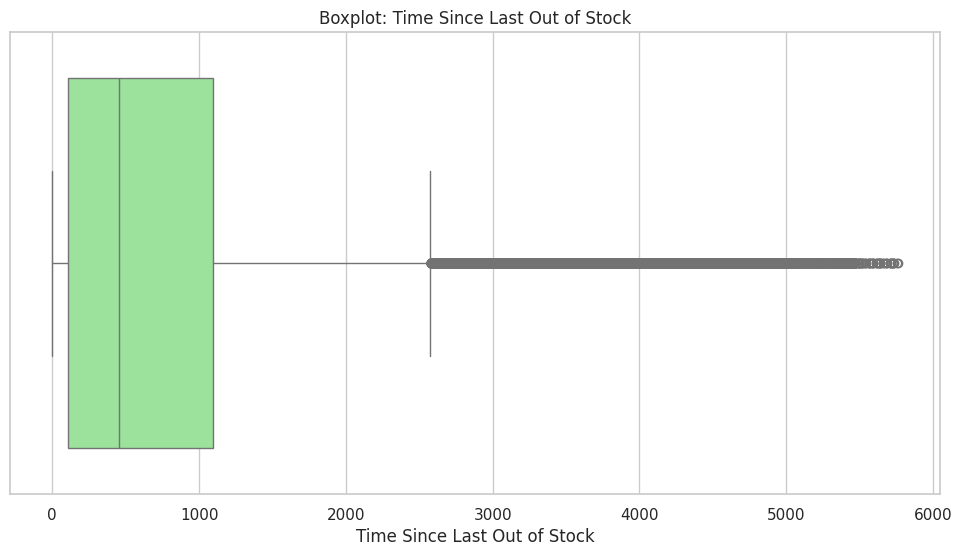

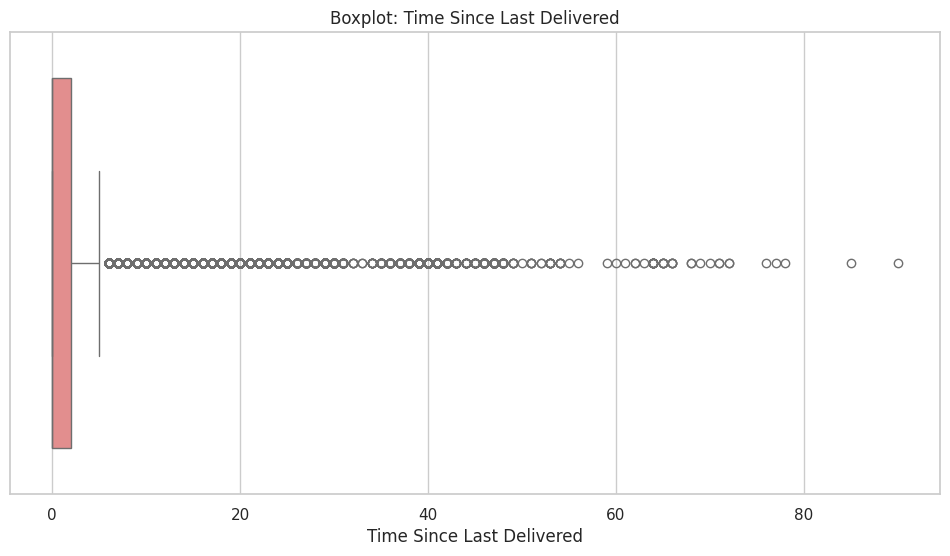

In [49]:
# Boxplots to spot outliers
plt.figure(figsize=(12, 6))
sns.boxplot(x='time_since_last_out_of_stock', data=df, color='lightgreen')
plt.title("Boxplot: Time Since Last Out of Stock")
plt.xlabel("Time Since Last Out of Stock")
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='time_since_last_delivered', data=df, color='lightcoral')
plt.title("Boxplot: Time Since Last Delivered")
plt.xlabel("Time Since Last Delivered")
plt.show()

#### Time-based Analysis

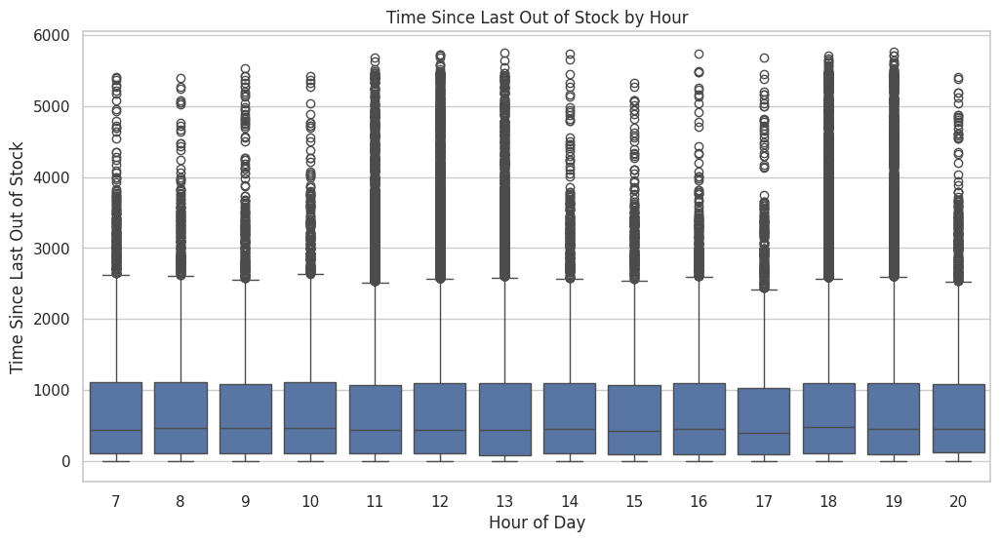

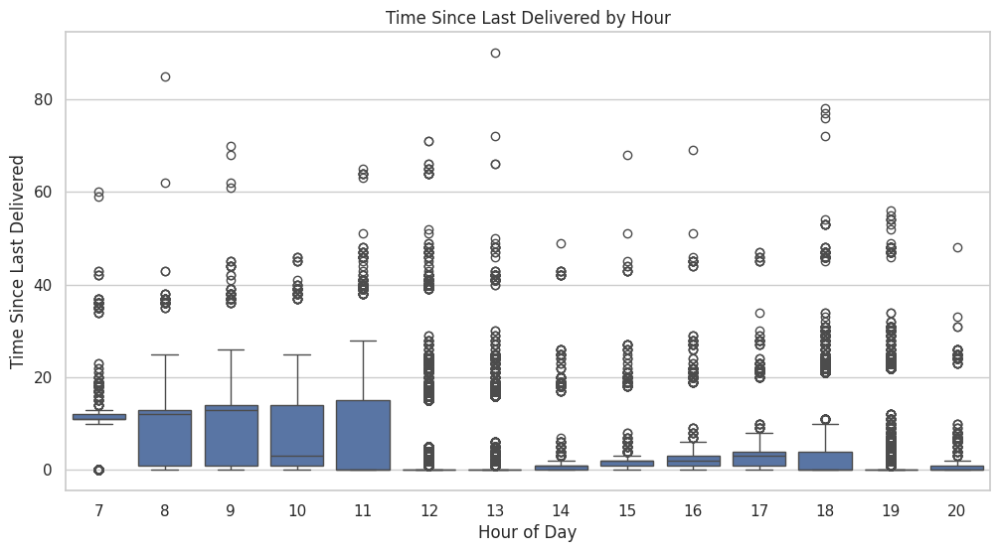

In [51]:
# How do these features vary by hour (assuming business hours may be important)?
plt.figure(figsize=(12, 6))
sns.boxplot(x='hour', y='time_since_last_out_of_stock', data=df)
plt.title("Time Since Last Out of Stock by Hour")
plt.xlabel("Hour of Day")
plt.ylabel("Time Since Last Out of Stock")
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='hour', y='time_since_last_delivered', data=df)
plt.title("Time Since Last Delivered by Hour")
plt.xlabel("Hour of Day")
plt.ylabel("Time Since Last Delivered")
plt.show()

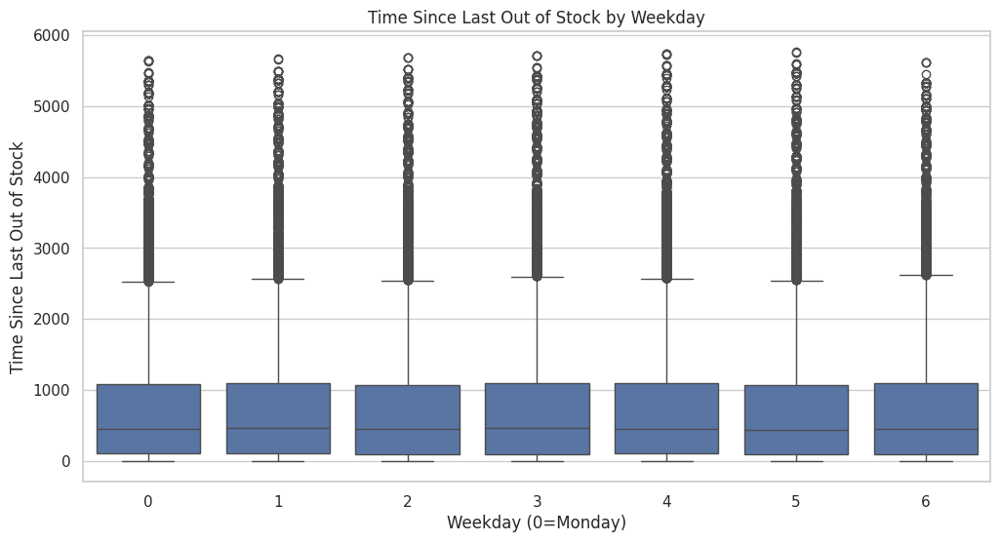

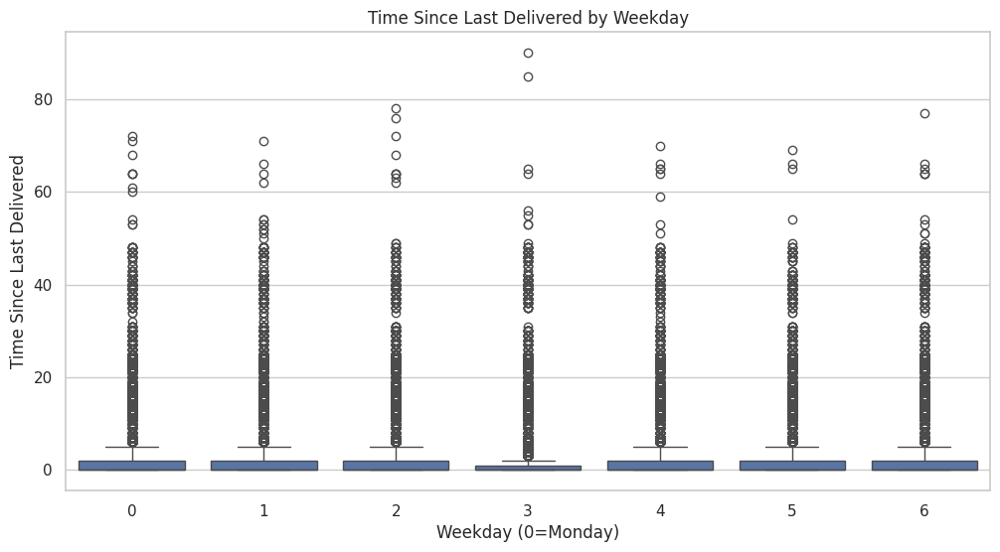

In [52]:
# Additionally, analyze by weekday to see potential differences on weekends vs weekdays
plt.figure(figsize=(12, 6))
sns.boxplot(x='weekday', y='time_since_last_out_of_stock', data=df)
plt.title("Time Since Last Out of Stock by Weekday")
plt.xlabel("Weekday (0=Monday)")
plt.ylabel("Time Since Last Out of Stock")
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='weekday', y='time_since_last_delivered', data=df)
plt.title("Time Since Last Delivered by Weekday")
plt.xlabel("Weekday (0=Monday)")
plt.ylabel("Time Since Last Delivered")
plt.show()

#### Comparing Zero vs Non-zero Gaps


Counts for time_since_last_out_of_stock = 0 vs non-zero:
is_out_of_stock_zero
False    199074
True      37496
Name: count, dtype: Int64

Counts for time_since_last_delivered = 0 vs non-zero:
is_delivered_zero
True     159047
False     77523
Name: count, dtype: Int64


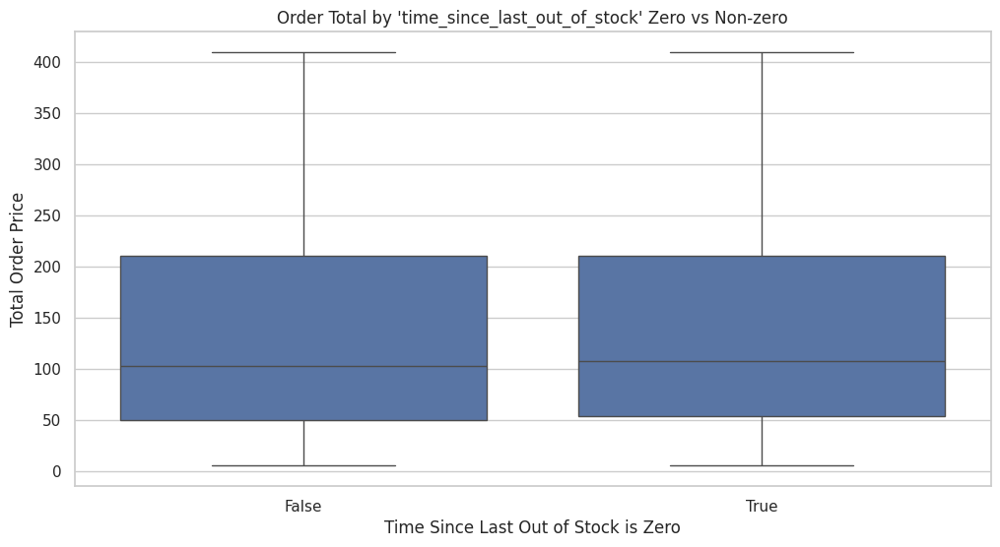

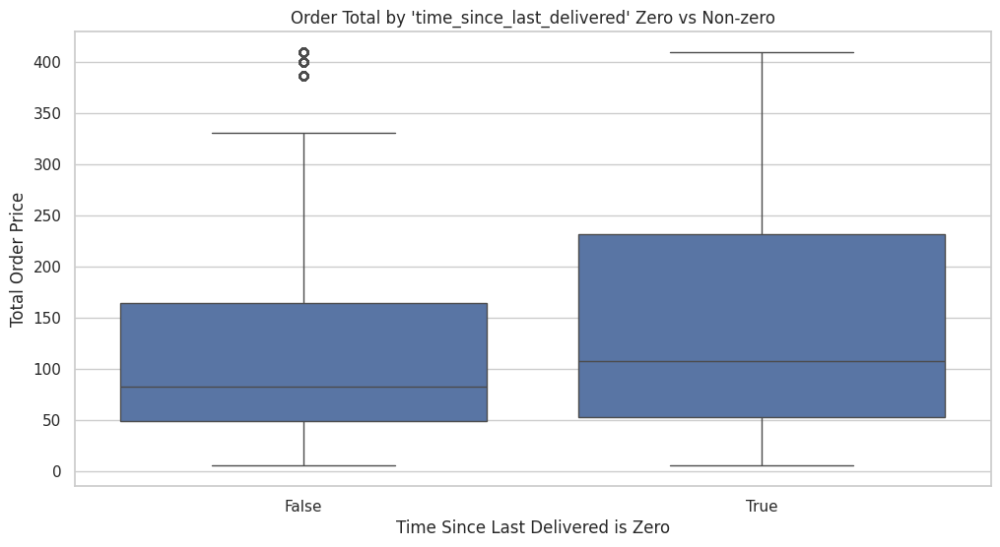

In [53]:
# Create flags indicating zero or non-zero values for a potential feature
df['is_out_of_stock_zero'] = (df['time_since_last_out_of_stock'] == 0)
df['is_delivered_zero'] = (df['time_since_last_delivered'] == 0)

print("\nCounts for time_since_last_out_of_stock = 0 vs non-zero:")
print(df['is_out_of_stock_zero'].value_counts())

print("\nCounts for time_since_last_delivered = 0 vs non-zero:")
print(df['is_delivered_zero'].value_counts())

# Visualize the comparison on order totals
plt.figure(figsize=(12, 6))
sns.boxplot(x='is_out_of_stock_zero', y='total', data=df)
plt.title("Order Total by 'time_since_last_out_of_stock' Zero vs Non-zero")
plt.xlabel("Time Since Last Out of Stock is Zero")
plt.ylabel("Total Order Price")
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='is_delivered_zero', y='total', data=df)
plt.title("Order Total by 'time_since_last_delivered' Zero vs Non-zero")
plt.xlabel("Time Since Last Delivered is Zero")
plt.ylabel("Total Order Price")
plt.show()

#### Compare by Scenario

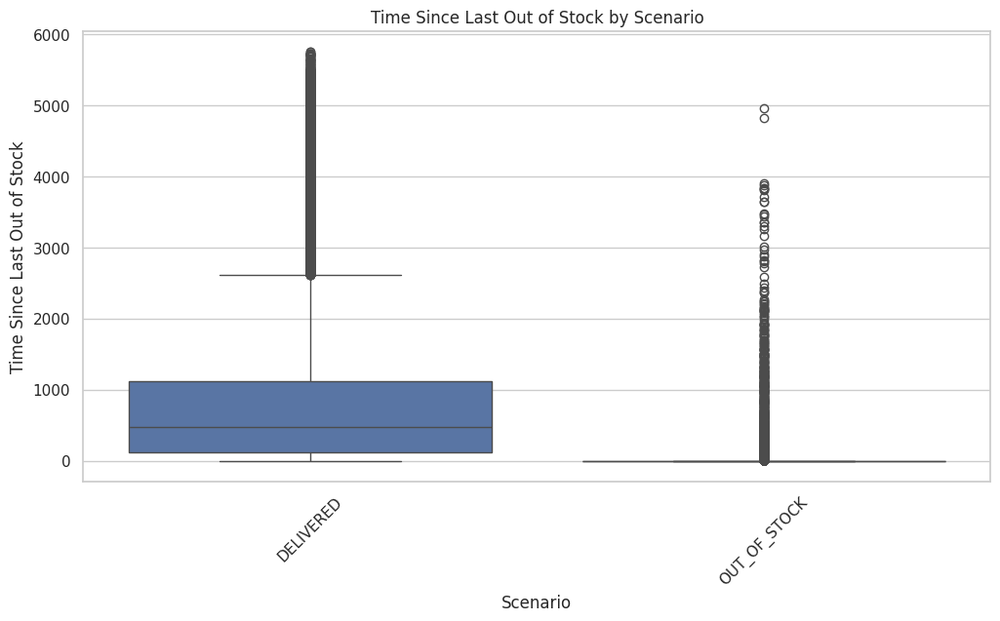

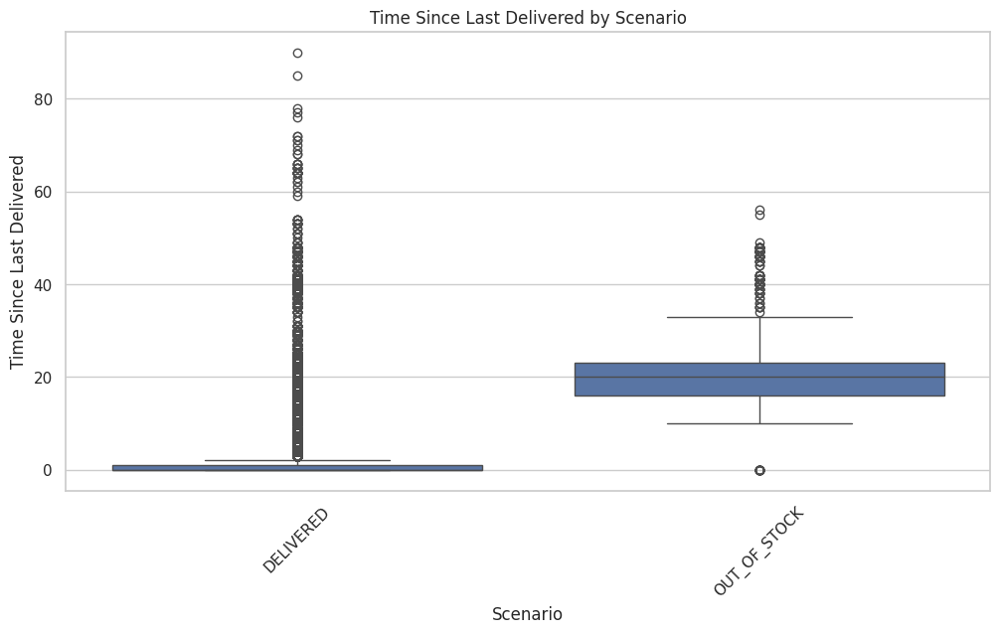

In [54]:
# See if the time gap characteristics differ
if 'scenario' in df.columns:
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='scenario', y='time_since_last_out_of_stock', data=df)
    plt.title("Time Since Last Out of Stock by Scenario")
    plt.xlabel("Scenario")
    plt.ylabel("Time Since Last Out of Stock")
    plt.xticks(rotation=45)
    plt.show()

    plt.figure(figsize=(12, 6))
    sns.boxplot(x='scenario', y='time_since_last_delivered', data=df)
    plt.title("Time Since Last Delivered by Scenario")
    plt.xlabel("Scenario")
    plt.ylabel("Time Since Last Delivered")
    plt.xticks(rotation=45)
    plt.show()

### Velocity exploration

In this context, sales velocity refers to how quickly orders (or state changes) occur. In other words, low time gaps between consecutive events indicate a higher velocity (i.e. more rapid sales or events), and high time gaps signal lower velocity.

In [59]:
# Create a "velocity" measure as the inverse of time gap,
# avoiding division by zero by first replacing zeros with a small number.
df['velocity_oos'] = 1 / df['time_since_last_out_of_stock'].astype(float).replace(0, 1e-3)
df['velocity_delivered'] = 1 / df['time_since_last_delivered'].astype(float).replace(0, 1e-3)

# It may also be interesting to aggregate these velocities by a time period or grouping variable (e.g., restaurant).
# For instance, we can compute average velocity per restaurant:
restaurant_velocity = df.groupby('restaurant_id').agg({
    'velocity_oos': 'mean',
    'velocity_delivered': 'mean',
    'time_since_last_out_of_stock': 'mean',
    'time_since_last_delivered': 'mean'
}).reset_index()

print("Restaurant-level Velocity Overview:")
print(restaurant_velocity.head())

Restaurant-level Velocity Overview:
         restaurant_id  velocity_oos  velocity_delivered  \
0  007c0cb81363275a...    144.882003          872.577091   
1  0510445023c51252...    150.239846          879.149821   
2  0a4f2a2791f5dc27...    185.477875          466.223967   
3  0d376da691776b59...    150.275732          456.757045   
4  0fdea8d9e04c6247...     56.659066          822.889820   

   time_since_last_out_of_stock  time_since_last_delivered  
0           790.952607                      0.927306        
1           991.566386                      0.721486        
2           752.049662                      5.140988        
3           641.158687                      5.212116        
4          1141.595212                      1.225393        


#### Sales Velocity Density Plots

<ipython-input-61-5a26cf3d1c7d>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df['velocity_oos'], shade=True, color='blue', label="OOS Velocity")
<ipython-input-61-5a26cf3d1c7d>:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df['velocity_delivered'], shade=True, color='red', label="Delivered Velocity")


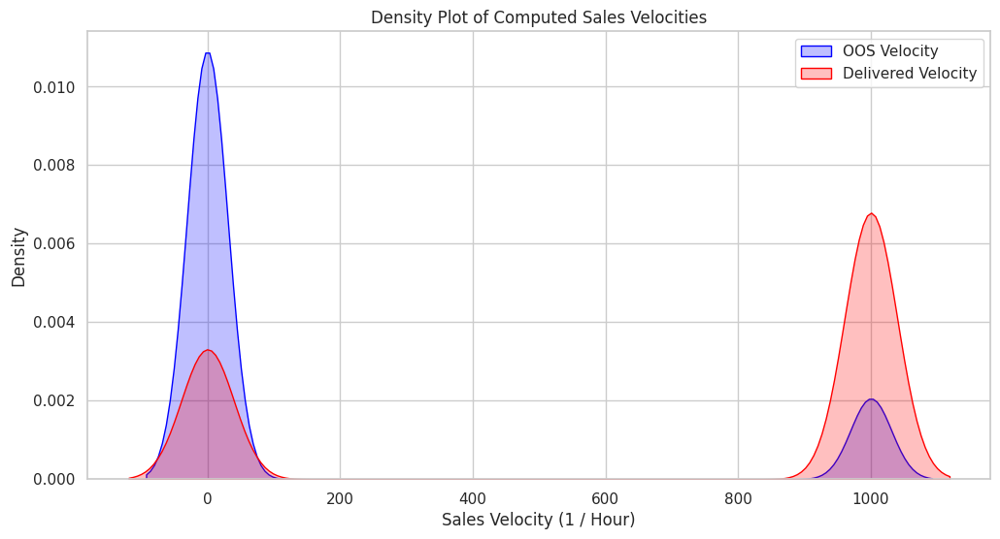

In [61]:
# Plot density plot of computed velocities, which are higher when sales/events occur rapidly.
plt.figure(figsize=(12, 6))
sns.kdeplot(df['velocity_oos'], shade=True, color='blue', label="OOS Velocity")
sns.kdeplot(df['velocity_delivered'], shade=True, color='red', label="Delivered Velocity")
plt.title("Density Plot of Computed Sales Velocities")
plt.xlabel("Sales Velocity (1 / Hour)")
plt.legend()
plt.show()

#### Time of Week Trends in Velocity

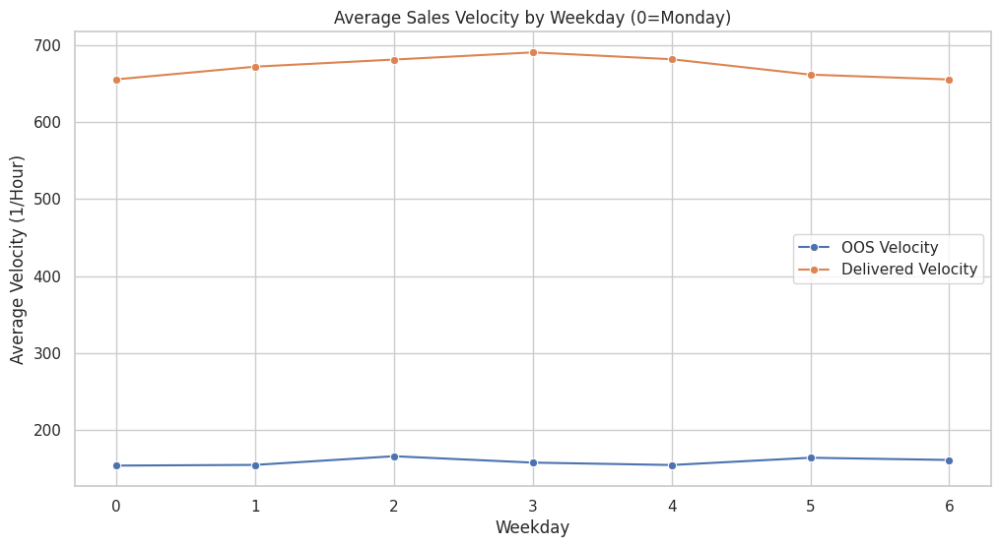

In [67]:
velocity_by_weekday = df.groupby('weekday').agg({
    'velocity_oos': 'mean',
    'velocity_delivered': 'mean'
}).reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(x='weekday', y='velocity_oos', data=velocity_by_weekday, marker='o', label="OOS Velocity")
sns.lineplot(x='weekday', y='velocity_delivered', data=velocity_by_weekday, marker='o', label="Delivered Velocity")

plt.title("Average Sales Velocity by Weekday (0=Monday)")
plt.xlabel("Weekday")
plt.ylabel("Average Velocity (1/Hour)")
plt.legend()
plt.show()

#### Relationship between Velocity and Order Values

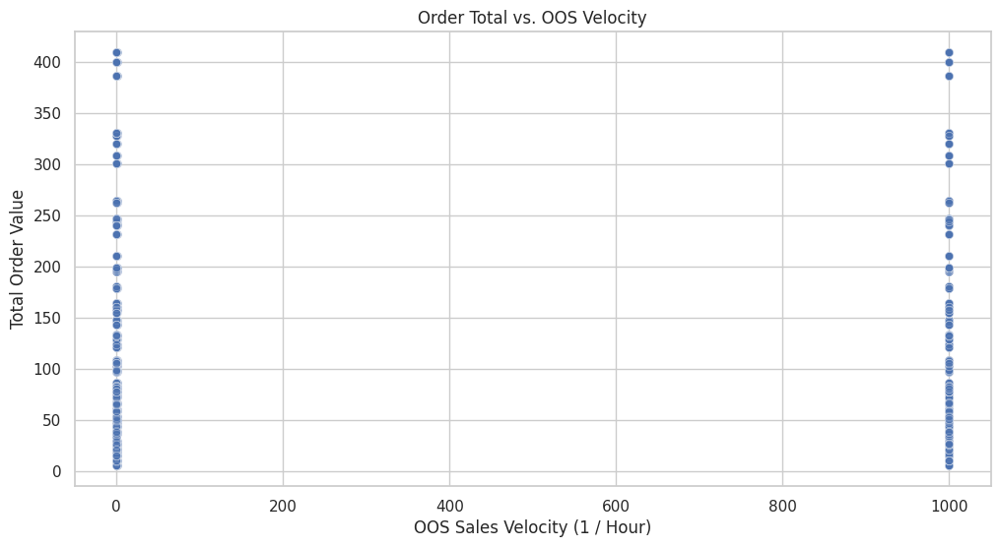

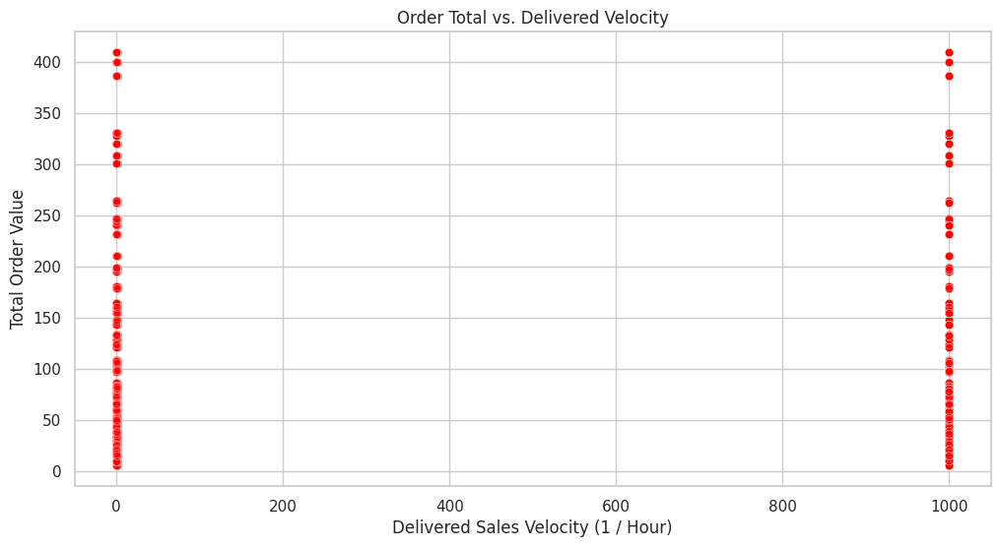

In [68]:
# Compare if rapid events have different order values.
plt.figure(figsize=(12, 6))
sns.scatterplot(x='velocity_oos', y='total', data=df, alpha=0.3)
plt.title("Order Total vs. OOS Velocity")
plt.xlabel("OOS Sales Velocity (1 / Hour)")
plt.ylabel("Total Order Value")
plt.show()

plt.figure(figsize=(12, 6))
sns.scatterplot(x='velocity_delivered', y='total', data=df, alpha=0.3, color='red')
plt.title("Order Total vs. Delivered Velocity")
plt.xlabel("Delivered Sales Velocity (1 / Hour)")
plt.ylabel("Total Order Value")
plt.show()

Interpretation and Further Considerations

Lower values in time_gap columns indicate events are happening quickly, which means higher sales velocity.

The inverse transformation (1/time) thus gives a direct measure of how fast the sequence of events is.

Points to consider:
* Compare the distributions: do deliveries happen faster than out-of-stock events, or vice versa?
* Are there certain hours or days where sales events occur more rapidly, possibly indicating peak business times?
* Do higher velocities correlate with higher order values (or other measures of business performance)?

With these insights, you could:
* Identify best-performing restaurants or products in terms of sales velocity.
* Explore if rapid sales (high velocity) lead to stockouts or operational bottlenecks.
* Investigate adjustments in inventory management or pricing strategies based on velocity patterns.

#### Duration of out of stock

In [69]:
import pandas as pd

         restaurant_id      order_item_name  avg_oos_duration  \
0  007c0cb81363275a...  Deep Dish ######...         472.06697   
1  007c0cb81363275a...  Extra Larg######...        1130.75427   
2  0510445023c51252...  Deep Dish ######...        673.769369   
3  0510445023c51252...  Extra Larg######...       1328.892491   
4  0a4f2a2791f5dc27...  Bacon Wrap######...        740.167634   

   min_oos_duration  max_oos_duration  num_restock_events  
0                 0              2256               10333  
1                 0              3431               10715  
2                 0              2232               10584  
3                 0              3455               10734  
4                 0              2039                1378  


In [80]:
# Filter rows where the current event is 'DELIVERED' and where a previous out-of-stock event exists (non-null)
df_delivered = df[(df['scenario'] == 'DELIVERED') & (df['time_since_last_out_of_stock'].notnull())]

# Group by restaurant and item, then aggregate out-of-stock duration
agg_oos = df_delivered.groupby(['restaurant_alias', 'item_alias'])['time_since_last_out_of_stock'].agg(
    avg_oos_duration='mean',
    min_oos_duration='min',
    max_oos_duration='max',
    num_restock_events='count'
).reset_index()

# Sort by restaurant_alias in numerical order.
# We use the key parameter to convert the alias to numeric values on the fly.
agg_oos = agg_oos.sort_values('restaurant_alias',
                              key=lambda x: pd.to_numeric(x, errors='coerce'))

print(agg_oos.head())

  restaurant_alias   item_alias  avg_oos_duration  min_oos_duration  \
0     Restaurant 1   Lowenbrau…        540.444694                 0   
1     Restaurant 1  Maker's Ma…        493.023816                 0   
2     Restaurant 1  St Remy VS…        570.491198                 0   
3    Restaurant 10  Bacon Wrap…        323.973439                 0   
4    Restaurant 10  Beef Strog…        502.861423                 0   

   max_oos_duration  num_restock_events  
0              1391                7124  
1              1558                7180  
2              2183                7044  
3              1464                1393  
4              1487                1335  


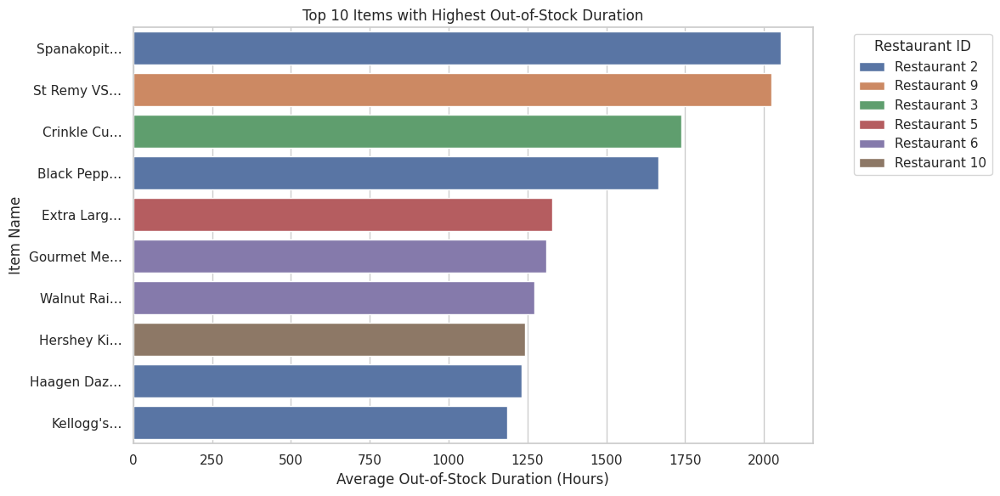

In [81]:
# Visualization 1: Bar Plot of Top Items with Highest Avg Out-of-Stock Duration
# Get the top 10 items based on highest average OOS duration
top_items = agg_oos.sort_values(by='avg_oos_duration', ascending=False).head(10)

plt.figure(figsize=(12, 6))
sns.barplot(data=top_items, x='avg_oos_duration', y='item_alias', hue='restaurant_alias', dodge=False)
plt.xlabel("Average Out-of-Stock Duration (Hours)")
plt.ylabel("Item Name")
plt.title("Top 10 Items with Highest Out-of-Stock Duration")
plt.legend(title="Restaurant ID", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

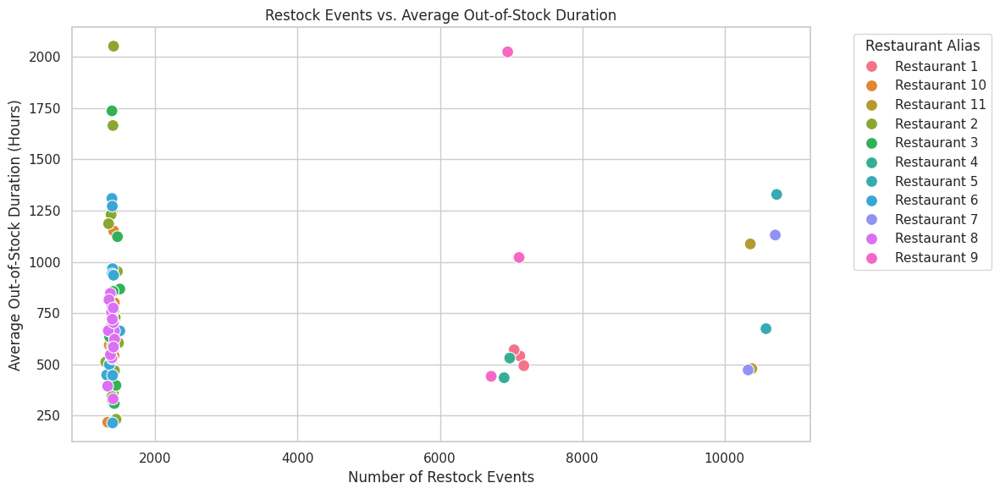

In [82]:
# Visualization 2: Scatter Plot of Number of Restock Events vs. Average OOS Duration
plt.figure(figsize=(12, 6))
sns.scatterplot(data=agg_oos, x='num_restock_events', y='avg_oos_duration', hue='restaurant_alias', s=100)
plt.xlabel("Number of Restock Events")
plt.ylabel("Average Out-of-Stock Duration (Hours)")
plt.title("Restock Events vs. Average Out-of-Stock Duration")
plt.legend(title="Restaurant Alias", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

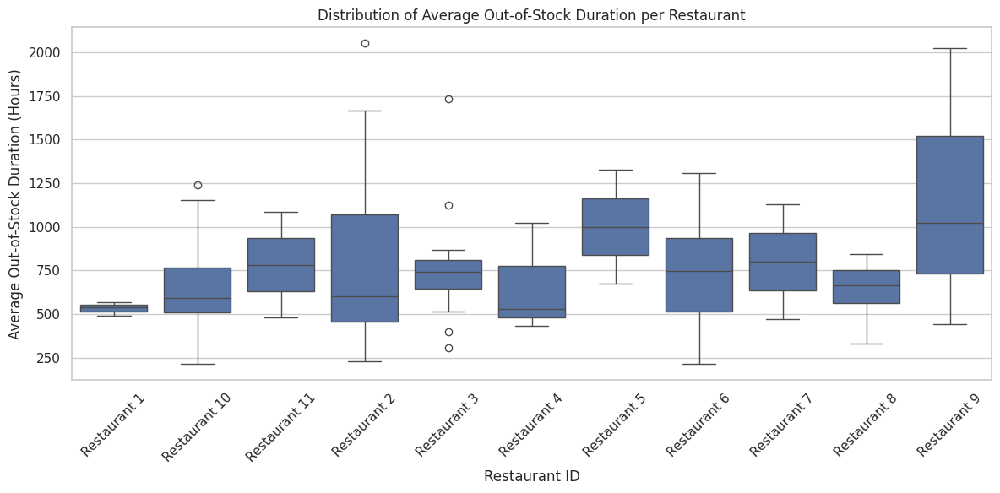

In [79]:
# Visualization 3: Boxplot of OOS Duration by Restaurant
plt.figure(figsize=(12, 6))
sns.boxplot(data=agg_oos, x='restaurant_alias', y='avg_oos_duration')
plt.xlabel("Restaurant ID")
plt.ylabel("Average Out-of-Stock Duration (Hours)")
plt.title("Distribution of Average Out-of-Stock Duration per Restaurant")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Duration from Last OUT_OF_STOCK to DELIVERED

Summary statistics for duration (days) from last OUT_OF_STOCK to DELIVERED:
count    197353.0
mean     0.632899
std      0.620248
min      0.006944
25%      0.179167
50%      0.432639
75%      0.877778
max      3.999306
Name: duration_days, dtype: Float64


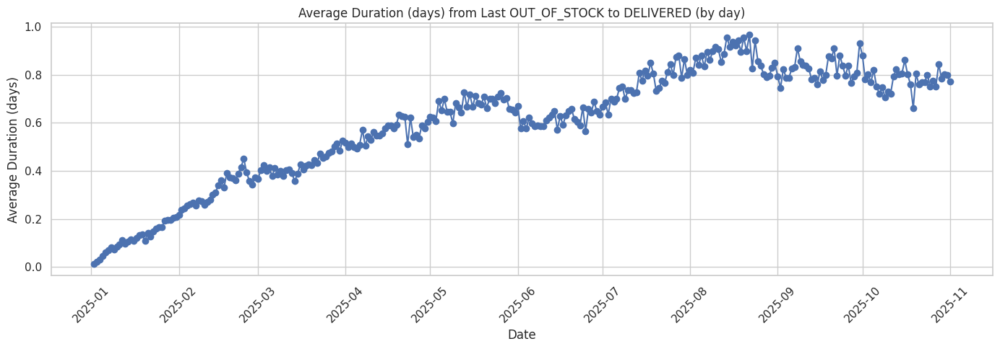

In [ ]:
# The idea: For rows where scenario is 'DELIVERED', use the column
# time_since_last_out_of_stock to see how long it has been (converted to days)
# before delivery happens. (If the underlying unit is minutes, then one day = 1440 min;
# if it is in seconds, then one day = 86400 sec. Adjust as needed.)
#
# In this example, we'll assume the columns are in minutes.
# If your unit is different, adjust the divisor accordingly.

# Filter only DELIVERED rows that have the duration recorded.
df_delivered = df[(df['scenario'] == 'DELIVERED') & (df['time_since_last_out_of_stock'].notnull())].copy()

# Create a new column converting to days.
df_delivered['duration_days'] = df_delivered['time_since_last_out_of_stock'] / 1440

# Optionally: extract the date part so that we group by day (if needed)
df_delivered['date'] = df_delivered['createdTime'].dt.date

# Summary statistics: overall duration in days
print("Summary statistics for duration (days) from last OUT_OF_STOCK to DELIVERED:")
print(df_delivered['duration_days'].describe())

# Compute average duration per day
daily_duration = df_delivered.groupby('date')['duration_days'].mean()

plt.figure(figsize=(14,5))
daily_duration.plot(marker='o')
plt.xlabel("Date")
plt.ylabel("Average Duration (days)")
plt.title("Average Duration (days) from Last OUT_OF_STOCK to DELIVERED (by day)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()